# Lesson01

In [1]:
simple_grammar = """
sentence => noun_phrase verb_phrase
noun_phrase => Article Adj* noun
Adj* => null | Adj Adj*
verb_phrase => verb noun_phrase
Article =>  一个 | 这个
noun =>   女人 |  篮球 | 桌子 | 小猫
verb => 看着   |  坐在 |  听着 | 看见
Adj =>  蓝色的 | 好看的 | 小小的
"""

In [2]:
import random

In [3]:
def adj():
    return random.choice('蓝色的|小小的|好看的'.split('|')).split()

In [4]:
def adj_star():
    return random.choice([None, adj()+adj()])

In [5]:
adj()
adj_star()

['蓝色的']

['好看的', '好看的']

## But the question is ?

如果我们更换了语法，所有的程序都要重新写

In [6]:
adj_grammar = """
Adj* => null | Adj Adj*
Adj => 蓝色的|小小的|好看的
"""

In [7]:
def create_grammar(grammar_str, split='=>', line_split='\n'):
    grammar = {}
    for line in grammar_str.split(line_split):
        if not line.strip(): continue
        exp, stmt = line.split(split)
        grammar[exp.strip()] = [s.split() for s in stmt.split('|')]
    return grammar

In [8]:
def create_grammar(grammar_str, split='=>', line_split='\n'):
    grammar = {}
    for line in grammar_str.split(line_split):
        if not line.strip(): continue
        exp, stmt = line.split(split)
        grammar[exp.strip()] = [s.split() for s in stmt.split('|')]
    return grammar

In [9]:
example_grammar = create_grammar(simple_grammar)

In [10]:
example_grammar

{'sentence': [['noun_phrase', 'verb_phrase']],
 'noun_phrase': [['Article', 'Adj*', 'noun']],
 'Adj*': [['null'], ['Adj', 'Adj*']],
 'verb_phrase': [['verb', 'noun_phrase']],
 'Article': [['一个'], ['这个']],
 'noun': [['女人'], ['篮球'], ['桌子'], ['小猫']],
 'verb': [['看着'], ['坐在'], ['听着'], ['看见']],
 'Adj': [['蓝色的'], ['好看的'], ['小小的']]}

In [11]:
def generate(gram, target):
    if target not in gram: return target # means target is a terminal expression
    
    expaned = [generate(gram, t) for t in choice(gram[target])]
    return ''.join([e if e != '/n' else '\n' for e in expaned if e != 'null'])

In [12]:
def generate(gram, target):
    
    choice = random.choice
    
    if target not in gram: return target # means target is a terminal expression
    
    expaned = [generate(gram, t) for t in choice(gram[target])]
    return ''.join([e if e != '/n' else '\n' for e in expaned if e != 'null'])

In [13]:
generate(example_grammar, 'sentence')

'这个蓝色的小小的女人看见一个好看的好看的女人'

In [14]:
#在西部世界里，一个”人类“的语言可以定义为：

human = """
human = 自己 寻找 活动
自己 = 我 | 俺 | 我们 
寻找 = 找找 | 想找点 
活动 = 乐子 | 玩的
"""


#一个“接待员”的语言可以定义为

host = """
host = 寒暄 报数 询问 业务相关 结尾 
报数 = 我是 数字 号 ,
数字 = 单个数字 | 数字 单个数字 
单个数字 = 1 | 2 | 3 | 4 | 5 | 6 | 7 | 8 | 9 
寒暄 = 称谓 打招呼 | 打招呼
称谓 = 人称 ,
人称 = 先生 | 女士 | 小朋友
打招呼 = 你好 | 您好 
询问 = 请问你要 | 您需要
业务相关 = 玩玩 具体业务
玩玩 = null
具体业务 = 喝酒 | 打牌 | 打猎 | 赌博
结尾 = 吗？
"""

In [15]:
generate(gram=create_grammar(host, split='='), target='host')

'先生,您好我是3号,请问你要打猎吗？'

## Data Driven

我们的目标是，希望能做一个程序，然后，当输入的数据变化的时候，我们的程序不用重写。Generalization.

AI? 如何能自动化解决问题，我们找到一个方法之后，输入变了，我们的这个方法，不用变。

In [16]:
programming = """
stmt => if_exp | while_exp | assignment 
assignment => var = var
if_exp => if ( var ) { /n .... stmt }
while_exp=> while ( var ) { /n .... stmt }
var => chars number
chars => char | char char
char => student | name | info  | database | course
number => 1 | 2 | 3
"""

In [18]:
print(generate(gram=create_grammar(programming, split='=>'), target='stmt'))

while(infoinfo1){
....nameinfo2=infoinfo1}


## Language Model

$$ language\_model(String) = Probability(String) \in (0, 1) $$
$$ P(w_1w_2w_3w_4) = P(w_1 | w_2w_3w_4)*P(w2 | w_3w_4)*P(w_3 | w_4)*P(w_4)$$
$$ P(w_1w_2w_3w_4) = P(w_1 | w_2)*P(w_2 | w_3)*P(w_3 | w_4)*P(w_4) $$

为什么简化，因为距离远的词对当前词合理的概率贡献的概率不大

In [19]:
import pandas as pd
import re

In [20]:
df = pd.read_csv('sqlResult_1558435.csv', encoding = 'gb18030')

In [21]:
df.head()

,id,author,source,content,feature,title,url
0,89617,NaN,快科技@http://www.kkj.cn/,此外，自本周（6月12日）起，除小米手机6等15款机型外，其余机型已暂停更新发布（含开发版/...,"{""type"":""科技"",""site"":""cnbeta"",""commentNum"":""37""...",小米MIUI 9首批机型曝光：共计15款,http://www.cnbeta.com/articles/tech/623597.htm
1,89616,NaN,快科技@http://www.kkj.cn/,骁龙835作为唯一通过Windows 10桌面平台认证的ARM处理器，高通强调，不会因为只考...,"{""type"":""科技"",""site"":""cnbeta"",""commentNum"":""15""...",骁龙835在Windows 10上的性能表现有望改善,http://www.cnbeta.com/articles/tech/623599.htm
2,89615,NaN,快科技@http://www.kkj.cn/,此前的一加3T搭载的是3400mAh电池，DashCharge快充规格为5V/4A。\r\n...,"{""type"":""科技"",""site"":""cnbeta"",""commentNum"":""18""...",一加手机5细节曝光：3300mAh、充半小时用1天,http://www.cnbeta.com/articles/tech/623601.htm
3,89614,NaN,新华社,这是6月18日在葡萄牙中部大佩德罗冈地区拍摄的被森林大火烧毁的汽车。新华社记者张立云摄\r\n,"{""type"":""国际新闻"",""site"":""环球"",""commentNum"":""0"",""j...",葡森林火灾造成至少62人死亡 政府宣布进入紧急状态（组图）,http://world.huanqiu.com/hot/2017-06/10866126....
4,89613,胡淑丽_MN7479,深圳大件事,（原标题：44岁女子跑深圳约会网友被拒，暴雨中裸身奔走……）\r\n@深圳交警微博称：昨日清...,"{""type"":""新闻"",""site"":""网易热门"",""commentNum"":""978"",...",44岁女子约网友被拒暴雨中裸奔 交警为其披衣相随,http://news.163.com/17/0618/00/CN617P3Q0001875...


In [22]:
articles = df['content'].tolist()

In [23]:
articles[0]
len(articles)

'此外，自本周（6月12日）起，除小米手机6等15款机型外，其余机型已暂停更新发布（含开发版/体验版内测，稳定版暂不受影响），以确保工程师可以集中全部精力进行系统优化工作。有人猜测这也是将精力主要用到MIUI 9的研发之中。\r\nMIUI 8去年5月发布，距今已有一年有余，也是时候更新换代了。\r\n当然，关于MIUI 9的确切信息，我们还是等待官方消息。\r\n'

89611

In [24]:
def token(string):
    # we will learn the regular expression next course.
    return re.findall('\w+', string)

In [25]:
''.join(token(articles[110]))

'在外国名著麦田里的守望者中作者想要守护麦田里如自己内心一般纯真的孩子们而驻村干部们也在这个炎热的夏天里撸袖子上阵真正做起了村民们的麦田守望者三夏时节不等人你看到了吗不停翻涌起伏仿若铺陈至天边的金黄麦浪中那若隐若现的人影是自治区新闻出版广电局驻和田市肖尔巴格乡合尼村工作队的队员与工作队组织的青年志愿者在这个炎热的夏季他们深入田间地头帮助村民们收割小麦扛起收麦机麦田中的每个人都显得兴致勃勃一天下来就近22亩小麦收割完毕志愿者麦麦提亚森擦去满脸的汗水高兴地告诉驻村队员我们青年志愿者应该多做贡献为村里的脱贫致富出把力工作队带着我们为村里的老人服务看到那些像我爷爷奶奶一样的老人赞许感谢的目光我体会到了帮助他人的快乐自治区新闻出版广电局驻村工作队孙敏艾力依布拉音麦收时节我们在一起6月中旬的和田墨玉麦田金黄静待收割6月14日15日两天自治区高级人民法院驻和田地区墨玉县吐外特乡罕勒克艾日克村工作队与48名村民志愿者一道帮助村里29户有需要的村民进行小麦收割工作田间地头罕勒克艾日克村志愿队的红旗迎风飘扬格外醒目10余台割麦机一起轰鸣男人们在用机器收割小麦的同时几名妇女也加入到志愿队构成了一道美丽的麦收风景休息空闲工作队员和村民们坐在树荫下田埂上互相问好聊天语言交流有困难就用手势动作比划着聊天有趣地交流方式不时引来阵阵欢笑大家在一同享受丰收和喜悦也一同增进着彼此的情感和友谊自治区高级人民法院驻村工作队周春梅艾地艾木阿不拉细看稻菽千重浪6月15日自治区煤田灭火工程局的干部职工们再一次跋涉1000多公里来到了叶城县萨依巴格乡阿亚格欧尔达贝格村见到了自己的亲戚现场处处都透出掩盖不住的喜悦一声声亲切的谢谢一个个结实的拥抱都透露出浓浓的亲情没坐一会儿在嘘寒问暖中大家了解到在麦收的关键时刻部分村民家中却存在收割难的问题小麦成熟期短收获的时间集中天气的变化对小麦最终产量的影响极大如果不能及时收割会有不小损失的于是大家几乎立刻就决定要帮助亲戚们收割麦子在茂密的麦地里干部们每人手持一把镰刀一字排开挽起衣袖卷起裤腿挥舞着镰刀进行着无声的竞赛骄阳似火汗如雨下但这都挡不住大家的热情随着此起彼伏的镰刀割倒麦子的刷刷声响不一会一束束沉甸甸的麦穗就被整齐地堆放了起来当看到自己亲手收割的金黄色麦穗被一簇簇地打成捆运送到晒场每个人的脸上都露出了灿烂的笑容自治区煤田灭火工程局驻村工作队马浩南这是一个收获多多的季节6月1

In [26]:
articles_clean = [''.join(token(str(a))) for a in articles]

In [27]:
articles_clean[4]

'原标题44岁女子跑深圳约会网友被拒暴雨中裸身奔走深圳交警微博称昨日清晨交警发现有一女子赤裸上身行走在南坪快速上期间还起了轻生年头一辅警发现后赶紧为其披上黄衣并一路劝说她那么事发时到底都发生了些什么呢南都记者带您一起还原现场南都记者在龙岗大队坂田中队见到了辅警刘青发现女生的辅警一位外表高大帅气说话略带些腼腆的90后青年刘青介绍6月16日早上7时36分他正在环城南路附近值勤接到中队关于一位女子裸身进入机动车可能有危险的警情随后骑着小铁骑开始沿路寻找大概花了十多分钟在南坪大道坂田出口往龙岗方向的逆行辅道上发现该女子女子身上一丝不挂地逆车流而行时走时停时坐时躺险象环生刘青停好小铁骑和另外一名巡防员追了上去发现女子的情绪很低落话不多刘青尝试和女子交流劝说女子离开可女子并不愿意接受继续缓慢地往南坪快速路的主干道上走去此时路边上已经聚集了很市民围观为了不刺激女子的情绪刘青和巡防员一边盯着女子一边驱赶着围观的群众现场还原从警方提供的一份视频了解到16日早上7时25分女子出现在坂雪岗大道与环城南路的监控视频中此时女子还穿着白色的内裤正沿着坂雪岗大道往南坪快速的方向缓慢地走着当时正值上班高峰期十字路口的车流已经排起了长队当女子出现时路上的市民纷纷驻足观望不少车辆也放慢了速度但女子并不为市民观望停下脚步依然缓慢走着当女子行进到十字路口中间时一辆大货车挡住了镜头但是当女子再次出现镜头时可以发现女子已经没穿内裤了全身裸露继续朝着南坪快速方向走去记者发现视频中女子周围并没有人尾随或者上前劝止的市民一大清早路上看到这样的情况恐怕大家都没办法淡定面对这一情况刘青表示一开始根本不敢看她心里挺别扭感觉很尴尬但当刘青跟随女子上了南坪快速路主干道时女子作出了让人意想不到的举动她突然靠近护栏要从上面跳下去刘青赶忙冲上去拉住了女子的手将其控制住并远离护栏碍于女子没有穿衣服刘青递上衣服女子没接受还把衣服扔到排水沟里继续往前走没办法刘青只能紧紧拉着她的一只手跟在后面刘青一路上耐心地开导安慰她但只听到她不断地重复着一句话要是你也遭遇我的事你也会这样的期间她还不时试图挣脱刘青的手要冲向护栏往下跳就这样我被牵着走了大概十多分钟天突然下起了大暴雨雨大的连眼睛都睁不开刘青继续说着瞬间他们就被雨透了但女子依然不愿意接受刘青的帮助就继续冒着大雨往前走大概走了有四十分钟吧女子突然停下来说我想回家了然后女子也接受了刘青递过来的小

In [28]:
import jieba

In [29]:
def cut(string): return list(jieba.cut(string))

In [30]:
TOKEN = []

In [31]:
from functools import reduce
from operator import add
from collections import Counter

In [32]:
with open('articles.txt', 'w') as f:
    for a in articles_clean:
        f.write(a + '\n');

151

284

185

43

1456

905

557

3656

3084

654

149

1261

434

687

1027

263

233

431

241

1490

808

2135

662

441

378

117

606

1338

581

2929

1013

1574

117

466

207

347

288

269

482

43

1546

572

1011

783

212

126

2063

1382

2995

540

124

146

2283

374

1146

330

359

658

852

324

538

1503

555

1102

545

1578

701

864

866

473

1444

1370

481

185

98

185

190

733

551

188

877

342

204

964

522

567

941

165

58

204

2539

1902

256

680

518

1016

750

5002

841

247

4

824

467

4

146

632

1112

105

779

460

1748

308

1187

476

314

234

582

698

680

666

229

592

1345

807

404

872

454

3120

306

2208

359

456

371

623

145

744

259

796

2585

605

343

576

360

407

834

1642

335

669

1395

438

829

754

499

2387

937

814

600

2205

2705

1660

320

1224

635

97

362

230

408

1873

1050

495

386

591

1774

316

759

449

318

272

405

299

588

1145

1471

864

575

1785

1051

483

614

518

2005

2220

249

262

292

2518

995

308

587

488

435

577

523

75

612

4228

530

728

86

443

1078

335

1227

36

542

129

489

149

399

394

1188

2066

2519

290

435

2773

305

686

275

495

887

777

1966

582

467

395

456

1620

850

145

428

278

409

4084

212

2600

2062

794

1090

60

236

523

1141

2025

295

2108

442

358

373

958

601

2078

678

340

735

554

468

1255

883

4606

734

2716

989

1109

730

387

618

766

1104

38

208

567

319

1089

79

1227

564

22

293

325

654

734

507

1012

1115

273

936

407

456

7119

941

972

882

1761

351

466

624

439

795

882

724

368

638

427

559

144

285

419

629

502

359

815

933

2857

555

822

1092

673

945

627

503

752

891

523

477

752

708

228

217

1282

586

548

140

1746

497

237

2206

723

1414

1682

750

1068

5519

314

1758

499

122

257

53

2240

449

731

126

665

1507

548

1035

133

551

2120

189

438

1042

260

1446

148

790

2236

644

233

749

828

819

542

2026

1437

611

1643

806

1112

487

233

72

252

611

377

312

214

378

606

2459

951

489

528

185

1164

100

100

657

423

1570

657

789

1120

1292

930

487

900

996

900

788

776

300

657

1626

1488

100

202

5715

568

557

1323

271

86

260

62

1107

228

590

109

213

681

608

361

610

310

857

1317

389

360

277

1039

661

143

407

665

1812

578

758

656

576

253

316

1850

762

1291

293

478

969

451

648

329

558

946

928

131

2639

879

585

1019

438

821

669

536

349

574

353

985

747

390

333

1262

1144

546

440

740

563

401

1381

620

780

349

1130

618

4993

588

809

643

617

932

179

919

492

424

215

407

400

378

294

567

3103

379

1870

2630

402

659

744

795

4946

573

908

555

1264

1134

915

1136

710

488

2916

1089

352

404

269

2561

378

267

340

1584

317

411

311

231

717

1274

755

638

376

422

532

616

828

371

859

345

2690

261

395

717

414

751

572

470

158

398

416

678

254

1219

665

751

593

572

812

398

382

1694

376

107

1386

279

1482

141

1953

335

403

1711

313

610

694

306

3429

582

485

381

1460

420

636

1628

424

6375

725

1017

1155

338

2464

307

3464

1439

809

381

510

347

531

503

716

367

105

276

102

763

519

511

818

427

709

1996

1237

596

1190

69

1541

890

966

1823

95

416

376

4779

206

301

396

1294

2177

431

151

276

1004

788

220

1026

1758

596

403

632

959

3060

691

211

964

389

312

216

271

2140

150

434

549

337

478

296

234

777

139

195

414

1503

1629

658

738

97

747

1246

3535

743

4077

430

730

594

357

759

11544

296

1026

978

829

289

837

387

2184

485

1501

305

143

820

270

641

787

558

855

328

144

715

120

487

356

4932

875

1340

608

529

1045

66

590

683

535

2173

966

120

361

868

466

237

551

374

541

830

530

250

1807

933

805

322

642

1356

2252

2895

1066

413

270

337

606

585

761

745

3271

445

1162

836

286

2584

490

1844

779

1801

349

518

2073

329

474

920

1066

895

346

237

596

285

706

457

1516

739

899

288

744

360

604

755

439

329

766

469

455

422

620

548

934

1499

498

152

631

839

380

722

737

388

321

1184

580

435

424

489

408

4188

793

501

722

1026

353

743

565

74

209

1154

512

229

3623

2436

737

596

585

514

111

487

982

733

1922

410

1014

487

862

1065

815

896

809

851

844

636

127

346

218

800

1697

743

777

703

1450

880

826

319

745

1638

401

246

988

771

499

2006

882

325

399

1396

2194

1894

2207

718

980

736

2389

149

164

306

384

838

303

500

584

4424

48

500

788

734

431

972

1135

749

128

1063

219

925

975

273

835

2180

618

763

1468

727

351

802

2075

1090

406

372

518

406

483

335

390

319

190

821

1695

47

951

1089

391

580

121

64

868

615

58

567

289

256

297

310

370

108

444

973

2513

43

306

880

49

335

841

18

42

347

877

319

324

1113

53

746

46

818

649

304

146

727

1605

513

665

634

331

690

225

3721

231

607

1342

303

436

671

290

809

1055

389

40

749

551

1093

742

59

299

4

413

601

411

368

742

418

247

41

754

385

601

240

207

376

870

1482

313

181

299

1416

662

971

821

1397

1837

13

662

951

661

4496

1681

51

1143

949

873

1080

332

951

659

322

364

729

3270

387

50

1097

343

1351

248

464

154

2463

217

401

465

1436

831

163

524

831

413

1268

331

213

212

3699

417

325

422

2033

768

2104

1191

866

768

2538

417

389

837

514

430

700

709

392

2722

598

836

695

482

898

536

2776

483

341

792

336

361

4931

223

1136

880

858

338

1435

1255

889

1243

565

988

2234

462

131

1678

510

447

451

1209

686

756

314

36

92

1090

980

767

323

19

863

1173

515

402

5167

447

402

639

1219

340

729

481

345

899

2140

570

48

869

45

2302

781

414

72

1693

741

54

813

64

809

83

241

822

330

1303

860

2553

1018

841

1002

4010

753

380

788

2655

286

1125

835

1540

1511

779

884

259

1334

175

681

164

784

326

482

464

154

1369

808

225

785

679

791

1362

1243

216

717

2138

191

719

641

1451

563

804

803

180

681

507

943

583

347

871

862

2278

769

2406

1208

1537

1536

819

679

419

809

300

518

1340

1829

787

256

2116

785

1654

431

768

357

343

838

349

367

264

904

782

223

883

778

1064

610

1215

1270

165

205

353

74

533

719

378

227

274

1907

690

1011

429

534

1177

2896

385

2311

328

886

879

328

808

376

718

4

865

1194

1964

1060

254

2105

1729

1084

4

403

218

759

460

752

3144

697

1206

745

249

717

211

1002

1323

406

1634

1412

596

759

563

262

258

420

53

1517

716

830

261

519

191

352

734

360

501

666

326

1449

601

367

733

661

460

95

386

244

2195

78

773

261

597

503

316

847

199

393

709

188

1535

425

721

330

212

765

635

303

730

833

575

460

491

875

378

635

812

748

653

303

331

65

1110

367

639

533

485

444

2009

350

233

1542

563

1311

377

807

491

156

325

667

202

548

507

334

848

154

580

387

586

179

833

492

551

261

419

846

61

862

800

796

373

265

1256

523

1005

671

1738

486

699

1772

304

374

487

450

27

200

1972

2932

230

104

287

509

486

269

536

894

514

1040

283

1005

220

4016

100

2228

4

252

436

1950

388

1703

3513

370

1714

318

521

1625

218

212

464

45

297

575

314

289

715

11

2139

698

647

171

316

3044

155

453

844

191

497

380

486

155

268

483

518

120

502

1113

510

259

766

570

702

241

538

1172

1802

331

768

222

650

1927

731

813

2419

735

1239

582

300

593

604

3073

471

1010

3155

493

1646

660

1167

754

746

385

246

323

357

319

662

420

1131

1229

489

335

470

726

569

323

1450

580

136

455

430

240

495

351

496

698

101

474

806

442

673

331

363

828

1708

215

701

665

2029

628

281

796

495

1003

188

1911

354

257

512

360

765

136

1511

120

360

2290

543

210

400

795

338

304

839

1230

558

384

1105

1980

465

648

497

237

734

549

613

513

182

714

483

455

767

420

393

826

403

329

669

1028

1880

1103

649

3130

922

446

704

596

737

1960

592

587

818

571

544

793

456

726

1054

536

580

277

739

541

648

618

3148

307

1163

862

2022

376

503

381

593

1619

303

515

406

412

205

1853

346

208

626

778

428

700

768

609

554

776

1092

706

702

991

705

475

482

705

528

2112

753

352

791

492

1774

654

145

395

337

202

1602

833

308

4373

1494

292

427

1082

818

750

1154

724

383

497

381

679

125

329

607

1132

556

655

1495

777

162

1111

176

767

1384

353

796

518

991

334

1677

939

731

751

1058

2685

165

3046

168

154

1565

111

903

1655

780

109

527

256

871

647

246

1056

4875

219

815

377

722

30

893

429

831

2271

538

842

1206

547

742

488

2463

754

1043

146

207

1270

495

242

248

390

945

509

661

173

448

906

485

594

609

361

871

1789

1595

257

180

2484

348

792

60

1136

776

494

379

208

750

304

924

863

3445

2916

772

154

1101

219

196

1194

179

207

2369

1376

788

328

206

475

873

220

296

800

2954

468

112

833

450

500

152

553

282

865

203

221

1278

167

1182

278

192

589

783

516

2336

304

856

173

99

1232

276

1336

1155

325

294

383

158

204

1098

746

225

1149

266

536

504

671

85

258

449

522

474

652

604

3421

512

1016

368

514

381

358

727

356

722

669

498

206

606

575

1614

822

480

908

514

567

745

2807

572

772

850

221

1079

537

547

276

1350

717

1012

62

372

623

402

514

777

498

809

401

384

1049

284

474

281

435

1293

461

920

1206

3723

275

515

979

739

330

721

1496

975

449

1787

1111

433

342

1130

499

637

473

255

1795

464

2454

332

523

459

2209

326

735

760

1722

801

845

261

777

885

786

451

921

901

731

1043

347

601

2058

639

2511

606

940

1474

494

361

783

653

386

445

1816

429

54

245

602

1191

818

1043

250

161

552

221

411

1411

873

686

416

252

743

556

606

1180

541

371

721

366

108

1219

1062

435

776

541

763

384

378

343

242

553

322

1129

562

176

372

538

385

589

843

219

7609

324

727

230

2701

784

2746

570

853

1533

620

983

1035

549

524

838

682

694

732

259

435

428

335

2048

607

834

459

589

532

512

315

850

434

1994

2459

674

622

748

182

63

807

1534

325

498

2281

68

999

838

887

157

164

1143

57

631

367

573

497

874

323

377

985

435

45

1141

2110

778

967

466

737

1060

469

264

1198

756

1536

5161

716

954

407

46

699

639

379

497

1138

773

1005

5750

783

339

545

891

311

1292

227

774

2368

254

774

715

525

856

684

464

965

164

803

1560

915

436

485

975

746

396

1012

253

281

561

526

642

523

923

548

664

281

417

471

392

431

836

160

417

1054

981

402

1320

940

2278

242

1546

115

2036

713

920

568

934

454

182

1095

459

230

891

824

571

453

551

637

368

905

848

720

113

1041

819

996

829

1093

658

446

87

298

966

83

142

493

18

242

149

908

858

852

761

207

583

76

705

799

845

812

775

592

235

557

113

735

633

980

1018

281

1102

1292

746

1034

285

1056

569

507

475

887

185

774

657

842

301

1632

776

704

1257

312

843

471

465

1019

514

241

932

751

488

757

390

3207

620

560

680

857

384

427

71

330

518

113

320

590

518

733

341

504

338

711

28

786

1189

786

906

406

621

1276

243

2031

284

742

976

926

742

14

894

508

455

1082

508

745

821

732

821

1139

616

323

1152

813

323

685

91

820

732

537

749

627

421

858

1054

553

774

600

561

527

3337

405

942

405

268

1954

725

348

756

682

501

820

1

613

907

349

2355

731

504

361

784

552

2904

1062

365

847

522

746

552

745

2132

1080

506

759

780

1131

797

483

981

604

941

500

556

2175

708

1011

779

1161

996

472

732

708

662

646

565

850

2938

822

1447

323

780

742

1996

788

2477

788

2243

752

2367

769

429

666

1693

3696

772

743

1791

760

1295

784

143

798

787

5011

2026

826

1382

787

226

1938

940

125

771

763

364

786

1785

551

896

409

200

1018

467

610

1163

260

505

1808

312

562

998

1956

1338

717

3366

1275

245

1211

534

903

1622

491

790

225

449

2141

1236

730

1507

2220

4138

730

742

229

923

5899

528

493

1378

304

614

654

714

288

1850

1156

366

569

978

612

842

385

1758

312

934

207

212

95

317

900

193

692

617

1402

893

1299

767

711

1489

952

313

1243

236

1622

274

20

654

215

531

231

427

675

214

388

291

316

845

1304

386

909

1397

1225

370

566

392

1358

661

1368

1970

178

273

1154

360

540

2840

132

1598

854

359

4193

529

2548

793

732

604

2923

857

381

549

950

634

2089

1588

324

720

1357

781

535

1007

585

2722

607

2008

926

1765

1929

208

818

535

1020

971

544

120

324

1062

766

1849

1818

615

241

1073

391

962

1947

553

1821

1274

558

1490

130

531

1771

732

553

569

1764

856

1327

452

1715

269

1189

298

885

311

882

304

780

372

714

765

744

813

368

4710

1135

44

412

153

418

49

776

418

2923

778

4

738

405

515

766

198

454

976

608

332

26

844

3452

449

1084

870

1805

1056

225

424

5942

237

782

353

295

501

826

277

1721

777

1181

516

1697

1039

861

271

645

169

838

449

480

239

413

332

534

272

300

783

311

726

361

321

84

837

1712

871

515

230

672

687

2193

297

455

1337

756

477

1184

816

606

207

183

319

554

732

956

1439

738

604

111

254

628

298

334

503

142

207

334

890

68

206

771

293

882

287

116

87

877

714

149

339

1402

903

371

900

838

607

1419

877

334

344

1326

1002

724

739

988

410

989

778

751

508

1461

182

898

407

432

3338

4624

739

355

1618

862

603

869

807

359

780

330

435

1658

366

519

1510

145

527

395

941

2767

625

1032

692

1392

862

758

564

1031

625

859

493

399

524

272

235

223

705

386

379

608

630

105

436

2492

417

198

379

305

405

2120

147

682

647

466

775

795

1882

419

481

1564

1037

767

792

2622

756

483

459

1103

670

322

336

569

602

2327

790

598

1418

424

1714

466

670

320

561

413

2921

394

1293

1836

1238

746

1424

427

1192

328

366

1382

707

51

824

718

793

747

506

778

468

1189

939

214

562

3556

761

1774

1185

749

3921

403

128

2104

1529

513

132

785

2163

1148

696

427

994

759

453

758

675

789

1279

995

301

148

1478

842

289

1493

672

2382

779

2467

401

593

459

3031

733

2469

2021

687

831

316

540

1423

1277

723

561

1537

1342

416

2144

6169

300

613

102

578

333

1974

341

989

744

1034

505

546

613

2508

358

1466

1741

494

1013

1476

1226

337

1420

963

209

740

1648

272

402

1941

358

508

458

676

838

482

366

680

478

884

1586

638

631

226

1375

773

1550

2151

783

836

1676

420

1458

2602

459

2085

467

401

437

1262

362

926

2166

495

2177

427

913

514

1378

308

1855

738

1813

1582

2718

460

1094

3411

451

1139

1527

542

1338

1535

1978

486

957

2502

538

1788

124

422

1098

533

330

152

2184

91

2010

506

1376

2725

531

1130

1291

543

250

981

598

549

614

616

2248

499

967

452

743

1002

642

4

1994

339

97

461

106

845

304

1000

788

357

940

104

509

764

123

454

364

681

488

452

2435

749

1427

1061

6661

251

254

307

357

891

427

887

345

2614

350

783

792

1161

1983

431

707

1423

802

492

2657

479

1683

1878

741

1482

2055

657

716

3110

653

831

459

1231

713

1435

422

393

256

972

1584

286

527

228

628

1221

283

156

716

455

759

582

264

245

272

1063

729

1863

2039

772

980

444

431

140

782

749

309

919

445

282

6289

961

727

978

583

2110

1234

348

1345

1732

850

682

500

449

632

1493

1204

732

828

9862

1089

777

313

1244

573

747

1080

7707

495

1366

800

946

743

765

1874

763

738

327

733

1745

878

803

844

325

560

677

997

751

563

521

868

273

527

3404

1134

313

623

984

755

1255

551

777

1637

1081

658

383

993

306

4291

1182

338

741

308

494

1205

105

723

3183

1083

597

137

1316

554

455

1681

851

824

524

1024

1176

862

730

2485

782

1104

542

106

248

757

582

911

1079

1098

849

171

706

776

416

1556

1199

317

1113

1352

716

319

1136

736

1222

127

550

123

640

784

566

900

1082

1110

515

1285

635

728

520

1011

446

1144

345

1008

561

316

40

245

745

587

504

392

566

866

505

1025

808

995

763

660

702

847

193

579

49

733

1533

213

537

511

745

367

1272

844

627

251

221

1039

83

1229

1933

48

959

557

34

697

215

877

114

198

587

833

472

246

96

1345

328

253

740

551

1084

868

794

101

378

510

423

426

386

1844

196

1333

386

550

1329

48

619

1010

1532

45

1668

476

279

1537

1564

458

619

59

1262

177

677

466

808

364

1096

235

65

1556

473

382

1288

517

1336

895

587

646

1061

515

1347

509

547

797

3145

200

1598

479

617

730

1403

730

369

743

1016

782

1731

911

595

2251

1209

669

80

637

680

1002

782

810

662

768

198

1215

768

1306

860

500

254

879

905

254

1928

870

1190

2775

870

1079

170

677

783

424

583

783

744

2956

766

1127

818

766

348

134

517

741

162

181

741

137

1196

742

1227

173

654

742

1267

423

790

173

306

831

891

188

879

1536

1558

707

273

1252

569

783

1753

109

498

3656

1688

810

1973

856

764

1101

232

1019

779

343

903

483

847

2170

764

845

862

857

1203

1059

717

732

1433

1000

858

896

887

2304

1713

716

1182

1084

2443

787

815

775

766

760

1392

1043

129

1506

879

1847

964

769

1146

2436

345

1103

350

391

345

1437

394

749

597

279

1431

774

468

563

1441

731

343

732

424

564

856

800

518

739

1602

384

1725

543

229

1204

960

624

677

304

841

793

1253

1413

873

470

973

882

1093

1266

756

2193

1997

608

772

167

1107

1378

756

1134

341

422

212

836

1359

3787

502

755

1409

838

953

137

486

128

850

103

1316

492

746

831

511

445

639

834

458

715

281

751

1717

235

1070

917

462

1183

986

147

1391

814

592

1240

949

421

757

1432

1524

747

320

505

1240

234

786

971

780

762

819

669

1042

596

2128

1505

347

513

324

362

556

1325

491

1145

515

1896

3218

928

641

693

766

5082

167

619

449

490

488

560

563

123

3069

153

572

926

403

140

229

521

659

374

497

375

866

2221

1253

577

1358

984

725

1287

3452

319

971

739

573

989

742

699

1021

1301

750

1009

590

834

637

951

536

741

576

963

776

1736

623

894

538

929

272

807

1125

1115

452

1415

247

571

1352

1492

1153

847

875

772

520

1600

850

1310

1075

488

568

1163

844

136

2028

407

1352

1256

855

1876

789

609

513

527

1222

474

1160

550

2310

553

892

2047

856

179

478

794

730

176

650

412

1015

754

1568

493

741

892

552

551

1067

526

174

204

558

567

1761

905

618

754

984

714

624

671

442

686

896

395

844

750

787

915

839

847

797

1160

1041

443

598

268

524

401

84

365

195

694

1455

896

2640

442

1066

1568

844

1549

682

826

1189

1133

126

275

984

584

1406

553

777

1027

859

1621

600

380

766

1686

352

1265

100

2701

403

772

1852

1091

312

103

1111

856

174

164

175

164

602

436

441

10

194

1220

207

1477

2877

870

2671

536

313

563

339

2048

311

1695

774

410

962

1012

774

1251

328

246

2087

872

1198

485

496

1568

285

648

776

490

849

351

439

776

212

232

229

1550

366

738

1613

603

608

311

1251

2885

975

690

407

460

893

124

1724

523

951

997

733

638

2044

363

976

1495

763

2397

760

1437

2249

268

780

1741

325

506

2730

949

591

831

1202

726

103

625

455

1224

813

1021

579

707

511

634

1789

335

550

770

1451

422

738

710

398

1351

303

582

1368

668

2295

747

824

340

936

730

2093

1196

710

2340

1256

261

583

937

775

1311

537

752

769

663

802

47

856

190

1688

388

232

2791

241

839

1528

183

311

394

375

642

725

494

714

468

2270

825

386

1079

253

527

1120

767

2282

912

269

836

749

1196

726

395

1110

681

3979

1141

524

899

680

756

725

1616

417

281

189

1275

184

1375

987

678

843

630

524

737

301

914

763

343

287

823

785

1139

654

708

1600

983

748

788

2163

443

1537

711

337

455

780

563

4151

409

366

976

496

1310

809

326

420

402

483

134

458

341

522

286

742

3334

629

588

803

632

351

1097

719

822

1211

242

513

901

886

491

714

436

460

765

473

1164

468

1270

309

354

359

726

444

721

1011

635

477

1357

741

1151

726

251

452

220

504

349

583

113

3063

315

444

679

339

299

81

1714

502

95

323

1060

426

321

218

2059

1178

528

483

705

649

449

1230

2379

509

769

501

128

565

815

424

217

467

1242

778

320

7

88

460

7

472

1515

731

462

180

452

789

503

173

2170

345

439

862

674

1132

463

568

500

7

487

572

837

608

114

720

203

493

1912

592

188

384

570

644

206

391

334

337

5357

1712

1644

476

336

555

640

321

428

986

397

739

412

64

807

362

181

2440

825

485

1745

893

1726

443

1590

401

1905

84

479

1850

232

616

385

15

2494

2860

10

546

1302

15

305

841

1047

9

691

696

129

1260

815

635

121

212

826

892

1856

3888

603

727

731

91

279

744

697

543

727

1472

721

549

1420

425

1821

7

279

767

2938

440

337

1087

7

578

785

678

925

497

1239

559

805

151

611

1400

276

1546

721

2187

3195

780

2739

227

16

623

446

309

5

454

727

7

167

561

337

1003

647

225

1286

1627

303

1746

661

1787

409

765

387

1741

3981

393

769

8

902

482

1952

320

183

567

501

324

41

901

825

726

393

1553

457

430

410

5

4866

847

284

11

805

285

754

11

1580

721

678

2085

1425

10

372

870

11

778

907

956

396

11

506

748

11

2264

464

613

11

298

177

765

5

548

160

595

10

113

160

820

13

219

4360

3028

9

434

858

216

10

160

2123

12

680

16

968

672

5

422

1391

425

537

290

3698

214

705

331

1241

877

442

889

1073

746

490

392

561

1979

938

2766

7

879

1034

916

686

532

1434

470

2906

366

677

207

782

5

615

1686

698

814

1519

801

2214

647

314

314

728

284

213

1392

836

529

2966

384

554

166

540

1817

351

404

1010

327

269

1652

305

611

2557

545

1758

1138

179

540

608

3689

494

142

524

1001

1564

405

817

768

524

377

1290

597

1685

11

1279

363

1491

11

699

376

545

10

899

642

136

1009

11

536

1103

369

350

11

274

368

801

265

11

372

902

5038

11

468

744

7

269

693

7

462

3894

754

10

838

419

1300

11

1982

862

409

1019

9

1151

560

488

1201

10

461

426

471

2848

12

918

744

5

1942

350

14

516

84

1070

7

560

822

932

15

847

884

2085

589

531

2499

306

459

1263

448

692

903

736

1852

385

299

1269

749

713

590

380

305

2912

187

224

527

1207

1311

1220

471

2159

382

2050

497

423

239

625

8

469

2202

834

521

872

468

445

296

1603

562

171

189

774

356

805

223

1237

342

908

353

464

323

150

1002

212

101

609

1206

1069

586

1568

141

1329

735

1010

545

5

247

1040

2024

851

5

1128

1261

296

5

764

55

5

796

954

49

5

430

69

6

640

463

5

787

790

1008

1073

11

302

275

125

100

558

414

741

2044

1556

558

562

715

369

1131

233

5

409

1363

4176

5

665

572

248

379

522

1290

30

4

1333

339

11

618

881

4

126

1990

612

1144

828

685

389

612

1961

1366

718

926

532

718

509

1658

135

686

451

670

183

669

312

1752

125

670

426

165

1505

588

315

534

150

1071

715

863

7

979

547

1326

144

395

2018

501

447

2686

1278

1014

1022

729

761

1203

60

934

880

2241

3013

1058

880

210

1652

1316

570

147

411

1065

1550

205

570

258

1205

326

584

236

2276

105

584

675

189

897

85

132

1996

855

320

108

406

1962

2517

197

778

406

1896

920

371

877

757

1697

272

316

2008

1062

706

499

228

852

782

777

335

397

89

782

1486

188

937

2165

4

801

575

239

864

370

836

232

731

2029

784

197

353

130

893

229

802

232

561

1339

737

1259

774

358

1430

734

731

4

1607

736

4

384

760

4

1963

193

750

4

1094

4

152

150

829

570

833

577

599

1048

789

605

470

740

143

599

262

820

804

709

346

168

920

311

903

208

866

871

519

184

538

732

828

391

180

110

407

482

839

865

775

491

190

851

2918

4

901

4

427

92

828

4

1273

308

531

882

327

853

490

862

473

423

734

1146

4

547

2214

120

794

504

534

547

751

207

727

842

1526

177

992

1265

809

4

4

975

865

4

822

967

4

362

734

615

540

184

762

485

184

787

2916

30

4

784

858

307

637

1040

4

563

659

1851

171

144

987

140

348

183

439

471

343

208

631

480

319

889

957

766

4

2028

758

733

1964

456

948

3250

603

831

1044

777

773

999

776

593

1643

792

1424

1456

2156

1660

783

4952

1504

476

2172

718

352

1015

704

920

1077

1568

490

1558

704

537

800

127

366

431

671

1219

639

130

1500

59

630

556

679

1102

479

981

572

567

177

716

533

643

599

128

279

1254

1482

178

1252

345

1402

380

725

5

795

477

295

7

1009

840

407

3118

1148

689

261

436

1368

767

631

103

1269

634

1499

561

337

113

214

1253

3538

987

503

5

462

680

818

348

965

1459

843

543

1954

854

123

346

3107

200

817

785

370

706

600

333

1139

1

718

460

566

977

1943

1082

922

833

402

214

234

835

1183

5

1028

795

5

1286

495

48

14

1012

533

200

5

674

549

228

779

747

1783

924

683

108

8

142

536

165

7

241

1201

962

646

1520

623

5704

255

8

612

1061

645

8

4

1110

767

7

4

609

4

1178

2251

4

118

16

1138

4

391

41

424

662

729

536

324

501

154

630

1596

514

672

561

792

754

661

1507

363

180

1003

12

14

179

602

8

1369

868

4

1668

89

982

332

5

4469

2219

371

588

156

551

2752

2420

590

124

1620

5

106

391

305

139

364

577

2329

232

614

227

192

157

710

554

2529

359

157

1665

242

531

70

458

12

756

277

717

1481

12

40

65

11

49

823

528

12

497

752

11

65

316

11

1623

242

175

485

13

707

437

355

14

358

3746

546

422

13

5085

238

878

14

326

699

519

13

207

1562

717

13

397

570

598

214

607

2305

789

16

3180

970

410

511

181

2323

434

480

160

474

1104

342

354

570

477

510

2030

1383

656

978

7

1266

2843

340

489

432

416

216

709

830

509

345

721

342

2103

1773

856

614

207

5

597

727

465

314

597

390

518

436

847

769

238

186

1163

833

327

372

812

929

872

733

66

885

707

782

635

5

1242

690

782

697

1555

1025

361

471

788

636

536

85

2173

771

792

988

12

145

410

794

11

734

632

836

12

346

12

1084

511

780

11

1150

549

11

506

13

495

409

13

338

867

15

14

823

451

2066

14

718

2061

11

813

2051

1036

1033

5179

736

343

281

571

225

424

687

1591

661

2052

704

140

632

848

807

594

293

5285

469

761

285

492

3

92

547

305

1109

331

286

295

550

730

1844

633

1323

1657

793

658

867

573

2935

260

476

765

684

672

78

583

747

944

317

1006

685

1732

11

443

753

1160

3092

995

173

773

876

316

70

837

487

696

941

673

468

391

949

457

453

272

373

410

250

627

577

18

1188

559

134

504

3

242

507

313

520

767

181

460

185

238

529

288

325

748

1023

711

330

957

573

1349

2326

254

822

502

726

212

467

456

899

238

239

1065

592

788

2690

307

3639

225

1644

496

480

664

910

531

872

899

248

789

1349

208

1465

1028

205

945

257

1726

16

345

531

256

535

5

2647

1989

334

422

2194

860

527

551

1498

408

5249

226

611

5099

1009

383

2118

312

4340

99

190

1282

4853

1944

1523

5680

7

1384

814

832

230

1476

1002

703

351

788

2358

42

648

641

1507

804

384

905

951

212

678

1227

367

156

448

198

528

203

366

1164

1769

2722

540

2376

445

11

476

2517

558

56

3174

164

2942

464

183

88

251

358

491

501

259

543

186

5

710

875

528

394

553

2672

323

483

15

442

232

4727

955

5

571

326

194

1030

1140

464

363

1865

1144

590

659

490

764

988

441

348

1767

829

353

2269

423

559

2078

580

56

513

1132

1462

842

5

494

1595

5

875

450

771

2398

5

2817

362

5

776

5179

135

591

5

674

135

1814

365

5

135

497

6

135

370

353

5

827

435

822

261

2725

591

4

225

72

1044

314

828

4

860

554

1813

578

181

209

1544

280

1632

473

479

276

589

1003

321

1442

1862

1720

761

5

4

197

5161

7

264

297

2139

1301

177

297

794

3218

2289

1008

1190

11

917

700

300

164

2238

1197

2173

537

392

1593

2653

135

1723

677

1003

1512

1684

574

375

211

916

1025

1188

491

397

156

1693

159

1262

2014

209

131

2103

135

68

224

814

544

704

212

1067

331

2321

208

336

192

647

9

1239

311

1125

130

186

1638

499

1122

195

670

1684

1393

466

36

820

3106

2765

734

1489

1605

412

1919

28

601

1020

360

754

161

1229

717

2377

483

1364

528

4

1167

712

825

1296

954

1573

2040

825

4

1125

1228

4319

461

175

1149

1600

691

265

361

1106

2607

7

515

1194

362

2527

416

266

2771

736

378

4997

5171

263

479

135

862

831

4477

856

197

59

733

1144

3117

727

332

523

1134

3565

5709

383

571

978

1511

24

2324

198

937

520

823

963

48

1323

1829

529

639

3405

599

1006

2484

690

911

314

368

252

353

135

2778

3521

4

581

375

1183

1709

342

438

987

261

45

651

293

712

928

469

317

1339

48

378

1658

232

2463

155

59

621

851

922

237

1443

100

4

3809

1216

496

203

677

393

989

637

439

4166

187

535

941

191

1364

3657

549

49

2098

302

862

10913

66

293

165

135

1523

617

3999

4179

669

721

1271

290

493

5190

576

497

231

1765

260

3

1221

1201

1020

465

1053

323

134

816

325

3090

86

655

1215

93

106

4

54

1573

3556

760

263

398

111

97

4

530

870

308

984

481

312

4

572

471

638

292

1075

697

828

4

568

1402

365

924

964

1449

4

366

323

1428

1145

135

28

294

573

895

1488

566

1517

758

307

445

1039

783

1241

620

487

801

467

182

1303

135

1309

275

332

762

24

803

2401

1130

291

466

567

2188

1800

351

655

304

236

568

135

514

3470

190

1567

329

241

334

135

3452

546

4

405

1509

303

586

135

3346

1018

1535

1182

979

217

2008

1536

441

1816

325

689

518

4

274

901

167

843

1217

179

121

481

1084

974

2515

271

802

311

214

839

257

822

2595

141

353

287

495

1025

4

3026

2563

200

670

439

929

135

795

3984

1947

885

758

1259

135

4

1634

85

4

369

135

2221

1524

3345

803

10

375

363

371

135

1644

1069

1555

146

1298

409

135

230

1423

933

3770

248

927

782

556

590

285

226

2561

568

2349

627

171

171

1831

891

3425

352

742

245

751

1229

779

262

961

513

221

1874

787

4227

1127

962

132

1134

531

600

844

2256

498

680

236

914

3220

522

2880

617

363

650

428

505

2642

133

500

3257

566

206

115

2230

707

1084

1101

351

3783

310

280

199

2249

385

1980

748

237

560

2373

632

887

766

839

3432

446

117

340

972

2237

1061

2556

616

726

546

401

248

2762

135

7

489

281

431

4799

843

4765

480

456

1507

1108

10336

1713

1248

791

615

915

1444

826

602

1444

4

471

102

1092

81

749

2062

135

1058

4

816

324

864

496

2292

407

557

1080

4

813

375

525

4280

284

690

336

439

55

95

896

2223

3635

149

354

730

433

395

1376

135

1328

599

505

578

521

1596

2831

629

419

2240

1289

622

681

1143

1340

4

1349

387

565

481

1824

572

266

4032

820

620

1432

1046

2125

1118

292

2286

171

2639

1055

2116

1655

95

8

569

132

772

815

3934

550

2297

753

358

895

1962

441

1589

550

3477

892

378

3432

946

333

262

277

1091

285

283

1368

2175

345

4

161

518

419

821

658

907

357

281

256

70

1599

1376

888

2215

270

508

639

570

2384

841

571

493

753

568

1052

2940

138

851

487

1541

4150

412

2962

467

1326

543

1641

1000

289

278

2921

1287

1163

191

1310

80

813

4

547

342

694

813

382

866

1830

1129

525

514

1648

718

405

579

3585

1087

671

394

672

564

2477

1667

1132

924

2729

244

335

2344

282

503

2146

1900

897

617

986

157

730

2132

337

1065

969

64

315

4273

538

1237

782

2177

885

4273

307

327

103

930

131

745

122

733

337

1339

524

1800

380

488

1033

1000

505

4

943

76

510

4

955

256

141

1467

342

46

3983

441

1268

1031

571

1185

3760

72

13

416

24

361

414

266

395

535

414

3284

341

385

372

336

227

442

442

1765

53

492

191

443

278

123

389

2295

1197

1554

1589

468

2562

480

910

1379

420

639

511

1662

582

1255

541

417

1464

454

1333

98

751

1305

277

1199

157

443

3088

4

550

706

401

390

546

666

1088

927

809

1706

1710

3827

428

304

118

4

1764

1577

1145

624

519

214

1469

193

724

344

222

521

1855

177

542

654

1635

5196

1480

847

109

520

2596

690

562

359

92

477

774

4130

2350

955

473

638

493

830

397

1764

1082

1461

4

1706

602

667

812

1299

4

16

5023

15

2248

987

23

16

4878

732

1436

12

899

409

121

11

2177

366

78

11

2790

4

2768

551

13

860

1585

327

14

1058

908

260

1653

13

943

1775

3999

200

376

438

14

1750

2864

56

1155

429

481

1018

1209

301

13

3

212

547

1481

412

800

12

409

4

598

380

357

507

662

1362

66

564

16

2115

5

717

846

368

449

560

311

654

867

252

338

1535

997

533

1084

602

567

2072

4

1011

543

823

4

1721

498

203

1106

4

161

552

138

932

509

1318

328

1368

645

120

1579

2651

482

735

790

488

1161

1162

588

1652

7

335

164

467

1999

515

18

332

626

290

519

2057

546

797

1086

794

1709

916

3150

757

330

277

15

49

656

463

254

257

7

465

644

396

583

1452

1440

834

945

15

750

410

2830

544

2105

1172

546

760

1680

454

694

574

1503

319

727

4

633

1570

178

323

613

759

353

441

1094

883

196

838

551

476

251

1222

452

2080

588

740

554

3304

103

591

285

729

11

168

272

682

239

648

136

355

310

2702

862

453

441

505

695

205

1357

808

865

451

303

4

1008

546

778

438

240

737

483

4

314

767

692

519

368

326

566

200

844

193

345

238

278

295

802

653

224

330

147

590

295

408

512

1419

320

225

293

419

1339

498

522

293

859

2356

436

358

219

904

293

390

298

291

71

293

494

718

194

527

279

626

518

1715

482

171

364

905

593

1152

2156

335

125

423

1152

3187

222

708

264

286

281

420

761

2623

758

293

169

162

1305

314

644

375

312

520

97

1806

847

530

406

54

1402

448

357

757

237

1176

4

309

262

828

723

124

2502

318

250

219

233

768

226

166

365

218

841

225

488

838

150

397

195

758

66

662

346

516

2216

535

549

1365

1046

1854

1104

1298

725

527

905

1226

812

368

833

980

914

1045

521

565

4674

920

1932

659

973

4

565

817

1171

3466

106

1873

4

734

459

1210

672

643

832

116

822

1026

1112

45

1058

928

293

63

241

930

726

511

567

799

975

819

23

620

2914

446

781

1721

17

120

1000

733

1150

207

1009

77

425

128

522

1146

916

4002

1759

56

450

15

655

741

1335

4296

1394

198

3721

818

17

1952

885

3051

59

399

630

1418

6657

486

936

81

498

741

2210

3244

1133

17

316

672

452

1016

3714

2271

216

295

186

554

2149

4040

1249

209

127

1664

1786

738

4013

1269

178

1198

1854

1106

950

710

497

462

204

996

3466

1017

1772

271

345

512

461

2579

1112

593

3513

230

72

844

1044

7

2040

2322

782

127

690

569

110

1053

306

1473

341

2134

47

3408

95

125

349

795

164

363

2234

314

469

696

2148

784

732

4

692

367

1740

1054

1572

833

830

610

957

1075

1478

552

454

599

942

875

4

749

266

439

773

570

451

1032

1084

752

1361

343

372

189

1263

400

1003

1910

770

250

1418

122

1819

1179

290

1134

237

367

709

130

484

293

345

412

1532

1464

1411

161

2809

747

2451

773

2560

365

311

653

2826

190

568

523

200

547

1556

106

196

4303

334

679

248

993

594

3953

396

335

461

329

707

262

436

459

786

324

527

426

650

442

496

2078

427

620

658

641

2237

3297

441

1211

994

833

1013

684

766

427

378

2063

1344

430

1520

420

315

499

3595

239

616

514

438

392

1038

381

394

580

144

679

398

236

3647

344

594

2251

828

92

2914

280

5238

319

776

1575

334

333

370

250

5382

273

468

1157

1011

601

1781

1639

1588

814

317

735

2788

578

235

421

1015

647

827

222

2726

1238

797

456

3714

676

277

523

525

618

596

882

440

807

137

435

957

689

455

2199

1957

1785

845

475

548

893

1729

2505

3954

181

648

11

710

172

419

1516

673

430

125

402

580

427

2139

346

336

846

472

292

681

1405

686

2183

510

324

2138

127

21

1826

924

797

265

193

335

173

3499

544

288

4095

428

2473

1136

503

551

953

605

323

1262

361

530

815

154

777

612

613

1815

297

641

387

1352

2030

2434

1304

1577

1559

581

627

959

247

4

4956

1127

483

571

70

784

717

317

344

939

396

1109

185

1742

1249

433

1428

3921

265

1730

2083

588

421

1627

959

1226

1102

2206

610

337

548

5232

241

1156

669

2459

724

258

643

1248

225

1224

14

2555

190

505

835

451

529

153

783

1136

856

131

2470

530

375

2372

288

902

147

1834

498

250

2553

1302

1733

272

633

474

509

1126

2762

784

1100

1143

1124

401

390

2456

837

2523

802

1140

427

411

349

945

638

851

678

589

1427

308

794

853

850

577

4

671

2507

337

850

1160

482

254

3456

385

1032

1711

1064

564

695

318

1180

2377

659

270

456

369

735

307

4588

508

451

212

1084

674

537

185

223

4787

392

1053

189

186

479

2257

610

896

1160

400

734

626

293

1106

2379

422

1263

553

3773

566

593

202

60

1794

412

91

797

12

515

178

1070

347

1230

856

685

378

14

934

200

3759

2207

2464

473

332

11

175

611

390

2094

1092

117

425

735

15

298

333

2227

833

4356

472

513

342

12

2241

790

296

2311

308

313

363

657

573

835

174

2477

356

129

331

1063

97

980

548

734

2590

364

778

491

902

739

605

219

2226

345

443

607

473

321

1892

909

400

353

1673

596

858

1655

710

286

308

959

2272

171

476

2287

373

740

175

1745

2366

598

823

301

2310

1438

278

312

1331

1336

819

652

283

1223

1147

965

2308

1552

2967

383

436

430

2286

281

426

575

102

290

403

597

2276

735

374

611

299

1894

2257

531

280

1862

342

353

2380

533

1671

421

790

914

2568

771

845

338

9976

449

2373

1413

804

313

9976

504

2421

1321

1139

1413

1015

467

350

2542

490

1027

720

1365

495

455

2688

200

785

663

1393

69

400

2420

639

332

529

80

2376

779

408

155

800

2242

429

507

468

511

2155

450

492

679

95

5041

500

340

434

1059

401

5041

1745

394

385

790

376

1091

459

974

1099

1339

2738

242

735

600

153

2236

71

414

96

659

1022

2332

657

402

797

351

612

2339

362

604

400

419

2037

2165

79

132

609

325

579

2384

385

774

401

393

566

658

1954

547

875

570

222

349

4

1742

868

869

513

242

1772

2705

777

284

1009

296

2922

8279

1245

484

278

1035

1030

1760

1247

2058

4893

863

1469

749

116

1715

122

4356

127

2221

10

4

114

1481

466

10

113

4

955

796

15

429

442

38

430

19

506

1204

2772

9

586

234

381

9

639

4459

7

4

1200

437

1410

7

1384

391

728

5052

10

438

288

1232

614

1449

2295

11

493

338

704

1210

451

871

590

19

1655

2438

204

592

499

12

1033

2154

1383

596

1661

1484

10

1305

4

231

280

742

240

6700

785

968

738

391

616

261

436

954

646

1130

301

937

447

830

371

348

431

898

325

1693

496

351

104

206

460

4149

1112

678

441

3583

353

572

426

1369

513

118

358

3319

1314

111

467

1093

1400

555

1369

2648

1525

767

2264

1712

4

418

785

488

162

1234

144

214

555

1240

1319

1132

1138

1070

963

353

592

576

436

3137

1097

3271

551

1026

1190

2640

342

1251

1369

912

2900

241

430

756

705

3892

398

185

491

4869

715

288

478

1064

319

783

506

562

1837

12

343

1434

731

801

1976

12

1070

4

540

2700

13

513

1251

4

1090

17

264

1130

46

430

12

553

654

1163

914

12

490

960

10

135

578

1873

207

876

11

774

720

835

518

1332

413

5290

17

746

393

467

2058

483

901

12

658

398

854

494

1178

2321

13

1094

1773

358

233

1155

970

118

873

738

381

633

425

655

11

10135

417

14

550

663

2745

1541

688

914

63

4

486

417

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

985

171

223

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

1663

852

310

941

455

587

574

1228

300

1695

956

4

4

777

4

4

4

362

4

2393

654

4

4

4

4

4

4

4

4

893

546

444

405

541

1111

1620

877

1424

845

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

526

442

869

357

565

437

767

1293

1708

586

450

1091

1171

1415

642

1718

309

621

1009

1381

595

980

902

605

909

321

959

710

175

1745

1331

312

2967

1552

575

403

345

194

741

429

660

545

293

578

618

445

296

329

419

419

602

1279

494

495

881

500

1794

288

279

1042

881

431

648

398

2871

1729

1065

1693

437

567

1211

393

805

1406

564

890

284

1475

1425

728

1135

858

766

429

585

176

1373

624

814

739

1467

169

353

384

465

370

531

191

25

454

854

306

339

935

2001

882

1121

1114

422

309

700

698

299

919

416

382

409

379

627

790

895

801

540

1544

731

309

562

2501

1517

2578

1107

1781

1003

1786

2335

145

1960

1739

1221

187

884

713

6564

8946

1247

4

1247

564

872

874

1407

1160

1669

842

973

714

990

878

939

461

832

201

2093

187

254

835

2225

1436

785

714

401

902

720

969

1082

1207

2862

914

1574

213

1262

1012

906

454

232

1227

1351

205

143

618

475

694

780

920

780

1124

647

179

14762

841

606

586

582

77

487

867

1483

880

2539

245

476

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

106

632

284

1091

965

8

1091

936

778

841

119

470

547

3707

1123

377

517

500

225

447

700

85

3123

699

1038

186

962

1288

478

173

1959

186

89

445

1004

273

1745

709

223

216

153

356

334

684

646

201

117

1729

195

505

760

1104

3246

2297

757

380

3

1101

267

5090

8

483

1027

89

492

1349

772

1318

803

308

552

423

566

824

1142

309

319

1106

1627

928

2975

378

922

418

835

3021

480

405

2140

174

1416

454

1563

1799

410

178

491

574

136

2079

437

1171

491

527

1451

488

1974

968

587

543

536

552

1371

1107

934

1282

587

373

926

1881

1068

860

1020

999

447

1343

228

725

102

1869

437

2276

1134

549

585

791

1656

951

727

596

478

824

11

3084

356

1776

1132

316

1017

524

1524

327

345

331

1101

1638

626

1729

905

117

325

328

244

117

774

11

1010

712

473

3123

1159

11

549

845

923

2806

1534

12

1066

3611

4

10

292

1281

16

4

287

3484

11

39

159

4756

386

11

567

336

876

37

331

118

1243

1426

2585

33

2175

345

485

1070

797

14

163

477

2046

1836

1308

5

187

622

698

456

513

482

1956

707

1108

1324

1548

715

4

653

511

859

1164

364

372

72

12

2279

586

440

2419

974

102

657

44

344

486

542

240

174

768

11

1389

640

580

31

2651

1322

1107

76

1348

492

287

2570

1321

563

739

1001

660

308

12

25

413

733

73

455

398

293

156

2290

330

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

16

472

82

741

1496

12

477

3040

355

2462

411

1804

12

612

572

690

2246

718

1148

601

12

1322

877

85

405

6985

2076

169

42

533

701

633

693

270

614

10

354

540

141

792

920

1062

553

4

404

427

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

4

121

119

121

115

121

113

113

114

113

76

74

76

76

76

76

76

76

103

99

101

822

98

528

86

125

121

129

126

124

124

127

126

128

125

67

66

67

64

96

93

98

89

96

97

972

63

1698

63

63

63

63

63

63

63

679

342

100

94

1212

345

679

1472

160

446

442

1900

165

170

445

420

15

315

2006

322

318

315

306

1275

97

627

95

355

236

117

117

111

174

239

178

393

164

1353

1177

164

314

374

62

669

61

114

112

114

129

129

129

129

134

131

181

133

61

133

61

61

61

61

61

61

115

113

115

115

113

115

115

115

127

148

131

117

147

150

149

95

145

109

117

116

117

117

129

118

116

123

116

118

118

1314

40

132

130

132

132

132

132

132

132

132

132

177

583

132

491

72

73

74

73

73

72

72

71

135

73

73

135

135

135

135

135

135

579

131

70

68

66

809

633

2405

97

100

203

201

100

202

950

2457

443

130

130

537

2897

1426

3

91

91

91

303

352

408

301

303

191

172

172

129

129

129

129

129

514

442

458

99

140

140

140

140

140

140

136

140

140

140

196

140

525

93

94

55

89

74

69

74

74

74

474

550

186

189

163

162

330

1297

1287

89

90

97

94

86

72

72

1172

1093

30

2999

661

75

94

177

112

177

112

113

116

107

121

68

68

68

68

373

1045

71

75

72

1822

511

111

146

2433

119

115

359

150

147

111

120

115

115

115

115

653

115

149

75

75

75

242

109

256

233

256

108

109

838

724

116

1814

141

141

863

141

141

141

519

176

178

132

82

446

134

125

132

132

1443

125

86

111

94

854

610

777

460

142

138

140

1183

174

178

57

179

472

173

558

170

167

175

172

167

169

170

995

108

108

108

232

161

561

172

172

163

172

295

179

237

236

813

241

185

122

122

1329

327

427

1225

121

124

1725

385

592

1823

416

376

393

63

63

59

62

62

60

273

461

80

80

80

80

80

234

520

718

611

222

257

555

135

939

61

61

61

94

93

93

94

1805

1137

508

277

1151

591

5702

1118

863

367

1389

421

225

462

801

1106

293

1226

2279

2801

3462

1325

1232

280

358

391

425

322

398

264

959

1154

343

421

343

300

200

362

1077

1223

975

323

390

1427

1280

374

259

547

1229

1120

269

458

1177

1229

458

1492

1438

458

1124

313

371

1229

1023

1232

364

530

766

303

281

374

1582

3237

480

2002

273

422

294

440

618

535

451

344

329

319

382

394

442

338

57

416

905

636

340

639

308

542

834

118

508

117

505

394

972

265

483

577

364

333

575

786

930

949

538

198

290

190

808

433

79

104

485

69

209

203

1092

326

509

231

135

541

132

145

122

144

325

3311

105

90

99

134

129

150

142

1618

234

1616

239

181

191

218

3314

171

266

266

270

266

259

348

648

266

102

58

215

470

1511

164

160

414

541

175

167

174

174

174

172

175

609

592

130

383

151

330

139

701

129

127

127

334

143

146

255

107

124

122

155

123

113

128

155

159

100

100

100

100

100

1862

166

165

1238

156

478

162

656

82

179

82

80

133

148

142

1292

131

2106

152

107

128

3010

137

132

131

132

132

146

140

105

411

125

525

185

1025

1316

600

997

1373

310

296

124

124

131

124

70

111

527

267

151

1189

134

135

132

137

135

154

136

1628

137

409

1566

137

379

1002

580

408

137

149

151

380

153

180

180

728

178

1321

1765

118

118

118

118

307

184

251

319

383

1268

250

145

115

145

150

165

167

136

88

335

863

733

615

378

947

200

2327

393

1272

301

295

284

284

1533

382

2701

591

3081

2697

445

2186

886

375

423

346

192

474

192

223

240

241

230

228

289

320

670

955

741

401

457

2504

238

66

66

273

87

119

88

108

123

1295

115

116

108

106

105

108

109

96

104

105

107

96

114

74

74

74

111

122

120

115

112

112

68

76

76

76

76

76

110

115

112

86

86

86

86

86

86

107

104

112

122

106

106

105

108

160

156

200

159

87

121

150

620

150

133

1462

104

502

124

518

106

105

437

314

522

520

104

102

104

111

104

106

106

105

107

101

139

107

102

147

267

112

292

159

291

262

110

127

157

160

156

161

155

516

58

56

383

129

1145

389

122

122

373

1494

39

142

5556

527

135

453

505

441

198

292

412

157

501

521

503

509

546

511

1398

511

1454

519

357

1295

672

472

282

844

114

526

475

114

111

245

339

111

180

195

181

183

2673

2315

1616

676

422

45

1478

370

1221

544

173

1033

172

366

1090

454

91

347

91

177

114

174

91

56

113

117

181

117

117

119

115

115

113

113

503

117

119

109

110

109

114

137

127

165

139

140

293

111

145

159

106

111

109

103

200

112

204

103

200

102

101

101

115

111

171

1038

161

169

163

164

144

177

1342

1259

172

71

75

114

113

73

943

122

74

122

122

418

149

650

78

158

136

3

136

146

414

101

111

155

86

549

102

112

245

248

137

315

317

315

138

322

315

317

316

316

108

322

323

460

312

316

274

309

266

261

59

70

119

70

102

102

102

1281

245

103

140

106

109

115

106

121

104

100

502

140

151

114

140

122

312

113

181

176

147

324

105

108

122

118

398

118

130

119

132

105

156

109

115

104

103

163

154

152

108

372

124

234

1055

325

512

467

359

95

94

90

488

966

1090

281

207

756

839

109

100

422

100

109

686

1215

624

1123

368

3887

257

1762

15

146

269

100

227

148

99

428

152

150

1870

656

112

327

238

112

392

294

69

76

83

85

79

83

112

118

124

71

71

76

128

46

118

81

127

117

136

126

76

76

147

117

110

108

115

107

107

123

114

106

108

106

114

118

115

115

129

126

133

435

513

123

71

71

71

71

71

71

71

85

642

119

1514

171

331

322

107

117

117

112

117

2162

117

126

116

128

114

128

131

116

114

125

136

570

110

116

118

113

122

113

124

110

111

117

118

108

112

110

118

117

107

117

1173

111

1421

119

113

648

115

2778

349

766

494

629

347

526

105

1847

105

105

172

82

82

82

86

82

85

85

82

81

82

82

81

86

88

86

85

86

85

86

86

86

82

83

83

83

83

85

82

86

86

81

85

83

83

83

123

126

262

262

1065

354

392

427

107

102

100

103

118

109

114

110

117

118

117

116

117

116

111

117

113

106

681

61

260

129

129

129

123

89

686

96

1506

412

199

1150

348

388

2451

941

607

532

588

144

1015

768

777

129

468

123

126

121

130

128

128

129

128

128

126

129

127

118

120

842

119

127

108

400

111

107

115

111

107

110

104

105

105

111

111

67

73

75

69

1406

810

92

85

92

513

140

647

126

180

180

129

127

92

92

169

143

66

55

57

63

65

64

80

77

86

84

107

81

268

150

68

612

62

391

323

104

188

513

288

1800

130

862

347

130

61

62

524

62

212

151

67

136

212

212

202

195

183

677

1774

531

135

680

518

267

424

154

331

155

542

53

436

199

196

198

199

196

793

578

606

424

63

664

1561

448

110

1993

114

1680

105

356

268

283

109

449

1230

121

121

125

109

298

719

108

108

107

154

124

122

121

90

87

140

138

457

964

867

150

227

62

107

110

1926

111

110

109

114

114

106

116

122

107

113

375

108

110

113

106

157

157

797

157

113

158

164

347

155

111

136

118

110

118

136

116

136

115

114

117

140

157

107

921

131

445

776

246

114

126

253

271

111

330

114

1130

354

202

253

109

111

106

162

128

123

130

897

141

1939

144

497

112

135

103

133

144

129

130

136

134

134

128

128

541

1277

130

142

131

150

540

104

109

30

444

435

97

498

145

140

143

129

141

129

126

126

125

251

125

124

142

125

125

125

125

131

103

297

145

125

143

132

142

144

152

146

127

134

128

128

146

157

185

108

119

106

118

148

167

130

147

129

139

141

141

143

128

128

91

378

111

112

103

124

112

126

129

127

140

82

972

85

1221

91

86

58

98

542

1183

105

108

217

126

111

115

339

225

123

110

142

109

113

90

90

576

150

151

164

152

152

147

162

152

149

165

149

602

249

111

155

146

110

114

157

153

154

155

1073

151

169

147

162

150

77

93

93

127

132

125

145

148

170

150

170

164

160

1940

828

61

125

112

130

144

147

147

145

147

153

145

145

388

745

1653

145

451

137

160

115

1395

113

116

115

381

113

763

682

786

15

947

1927

3957

342

126

238

392

247

1255

160

877

276

149

112

111

112

116

111

122

111

113

112

119

119

119

135

110

118

109

150

54

54

54

54

54

54

54

54

54

54

54

54

54

54

54

54

54

54

69

73

69

69

69

69

69

128

132

132

134

108

353

111

109

154

113

56

56

54

68

117

68

68

67

68

67

95

96

96

96

96

94

96

96

96

96

96

127

130

121

58

58

58

58

58

58

58

106

109

94

94

94

65

65

65

65

144

469

120

119

113

104

380

107

69

62

64

63

63

64

65

65

64

63

65

64

63

63

64

64

64

65

63

121

117

117

116

107

106

111

107

61

61

61

370

113

122

117

67

1450

116

503

122

67

67

105

67

107

105

108

117

105

105

105

147

147

106

77

84

359

110

114

115

109

122

101

101

96

97

97

482

67

63

63

772

283

472

303

226

60

66

60

60

159

527

613

372

1265

84

28

105

336

373

316

103

110

116

119

105

119

122

122

109

114

120

108

110

110

110

107

107

107

258

257

518

496

291

160

1703

156

160

507

329

544

97

95

98

103

97

105

105

102

105

104

100

100

1492

100

427

1034

273

331

161

177

999

169

169

169

158

158

270

902

277

1238

148

75

79

54

1530

54

100

100

98

103

838

99

120

121

304

187

1140

102

213

109

474

217

299

297

283

312

286

353

126

1339

186

536

190

188

224

192

180

116

188

199

122

120

122

110

121

50

119

122

1245

796

1067

52

1171

1191

510

239

587

299

321

202

304

99

487

99

168

98

90

604

340

87

98

125

129

124

825

76

77

77

77

124

126

124

121

138

140

140

145

122

129

107

107

1035

137

104

193

138

195

123

753

110

115

570

94

373

118

117

91

89

90

92

503

2197

59

147

159

97

1369

89

93

483

104

146

91

1715

284

907

151

1522

305

320

314

781

602

140

137

1198

52

63

304

354

219

223

46

114

232

228

240

127

129

179

303

582

126

156

397

532

1052

1396

386

450

43

1257

121

201

451

539

202

152

146

135

137

141

399

238

322

365

332

417

68

68

68

239

68

68

238

68

119

116

114

111

114

115

123

116

124

120

124

123

69

119

69

65

65

60

67

67

65

67

63

63

63

63

63

63

63

63

63

63

63

63

63

63

63

63

63

63

63

63

63

63

63

63

65

64

59

60

62

64

80

73

89

75

98

99

89

89

89

89

90

89

89

101

105

101

152

169

173

372

127

127

116

125

124

125

114

116

125

114

127

527

78

78

337

890

1905

1004

244

400

148

153

158

158

153

158

150

201

624

72

68

68

68

68

68

69

68

358

852

111

109

109

111

113

113

113

55

113

58

51

51

51

88

88

88

51

88

44

474

389

374

144

161

476

772

65

65

65

520

65

525

94

90

155

111

111

110

111

112

118

115

113

111

119

111

117

304

111

506

42

244

111

549

804

1047

894

106

58

52

1252

59

111

108

59

53

97

51

190

101

203

52

55

57

56

55

59

55

55

105

106

61

113

149

96

150

113

113

114

180

81

114

81

81

81

81

81

81

81

82

81

81

82

82

82

82

2014

82

82

65

82

82

70

82

1661

60

82

454

888

432

60

54

62

56

581

396

1465

1896

442

277

939

745

200

328

715

436

217

217

231

197

1538

654

107

109

107

56

500

51

173

309

134

141

173

141

171

170

172

172

185

438

1431

388

455

384

382

382

390

148

1976

76

113

110

183

121

88

127

127

127

341

521

295

1329

968

1405

474

543

557

809

1809

64

355

139

854

764

1432

378

1011

1755

1668

162

160

156

163

41

159

214

148

148

148

144

209

208

298

332

46

601

48

372

459

45

1776

770

527

695

206

195

190

195

1973

2294

2117

827

1683

135

135

139

135

382

156

156

135

141

95

96

98

92

618

381

357

123

703

105

100

100

100

176

179

366

48

207

447

3022

208

115

115

541

364

388

300

308

242

293

308

296

259

30

210

606

682

51

140

639

844

166

167

174

71

165

707

148

179

152

84

570

132

95

96

96

100

95

123

123

846

410

262

684

83

83

118

149

296

113

134

75

252

286

210

848

359

249

592

460

1538

554

353

44

148

148

41

387

122

459

1401

134

15

108

56

58

103

51

168

61

122

120

123

117

124

112

1801

2156

433

468

118

160

895

34

1065

2618

2925

213

214

320

242

416

412

461

148

151

152

151

152

146

151

154

152

188

190

188

156

192

9

425

163

506

163

163

240

394

524

176

178

152

156

182

180

704

123

124

127

119

129

128

115

115

61

115

116

116

118

113

118

120

114

118

828

1483

115

115

116

115

361

689

266

120

43

120

120

120

1197

481

1377

144

157

118

741

518

145

115

105

578

338

190

1405

474

352

137

346

104

74

114

139

138

710

62

62

62

62

62

63

110

62

115

115

72

73

72

115

72

72

72

73

73

72

402

72

120

59

59

115

255

124

115

114

48

412

123

110

111

1965

379

548

1042

247

1391

391

247

775

150

124

139

111

115

251

210

124

210

114

533

139

139

1351

139

727

205

221

203

213

205

213

128

172

729

504

1692

534

117

1477

1517

133

131

56

56

397

2058

121

350

82

83

185

1696

614

310

366

101

101

101

546

101

132

132

2035

170

88

92

92

92

92

92

87

169

92

88

92

129

172

180

309

130

131

158

129

129

121

132

664

169

448

354

1120

316

321

161

125

495

120

220

116

416

226

212

113

117

112

1254

382

519

123

61

61

61

61

61

61

61

61

61

276

65

65

65

65

65

65

65

65

65

65

65

133

506

184

68

68

70

131

68

194

68

1775

190

128

46

133

636

1218

122

136

119

127

126

121

112

400

709

134

114

321

309

123

464

1732

134

555

133

122

134

427

551

3131

1533

159

119

155

115

115

459

1937

86

838

86

81

80

86

362

85

118

85

86

118

413

86

81

89

119

50

117

116

1384

113

117

560

297

457

526

284

116

117

117

281

118

355

118

120

116

428

710

116

515

874

428

677

685

701

700

701

690

695

697

685

119

573

381

292

143

238

160

133

1774

1599

81

1915

93

489

347

1411

319

664

343

399

423

593

1046

465

1481

223

115

399

58

58

58

58

58

58

58

58

58

58

693

58

734

405

482

122

116

120

116

116

114

116

120

116

91

118

116

91

2452

92

118

116

116

92

1032

1410

134

134

107

107

140

139

136

62

62

62

62

560

61

2365

643

720

418

162

218

210

187

1574

212

221

902

1158

102

96

97

106

102

144

2129

89

89

89

680

166

172

174

160

266

128

270

164

164

164

164

83

82

83

64

206

64

169

232

197

66

196

61

70

168

103

170

2319

108

105

105

105

152

2379

178

179

178

178

355

229

151

147

147

549

66

65

70

65

63

520

242

252

2282

180

208

211

211

570

210

551

1513

347

90

95

97

90

97

90

90

97

538

1436

751

82

363

81

87

82

82

77

84

84

84

81

77

77

83

79

368

77

387

84

974

857

254

280

254

254

90

187

112

220

685

135

118

372

376

322

374

119

372

120

476

712

712

77

69

69

2581

77

202

205

67

176

184

207

130

206

186

112

148

165

112

112

112

112

111

113

111

115

630

65

126

126

86

140

96

144

146

120

72

56

67

141

66

65

1962

96

152

1699

571

670

142

137

412

133

571

120

62

539

67

194

81

120

69

1913

91

233

219

865

1487

583

390

298

2077

423

501

212

530

51

490

146

461

50

424

694

99

191

360

740

532

358

661

323

438

446

838

387

3452

251

712

369

580

548

516

198

410

165

706

165

165

396

334

2383

157

95

3943

2682

1854

263

478

465

177

197

293

431

359

494

514

118

586

180

112

112

146

268

210

303

164

418

1251

518

520

132

132

134

60

62

62

61

61

123

114

114

129

129

180

133

133

186

61

61

61

61

46

115

61

61

115

115

115

113

115

124

115

425

186

131

116

116

114

116

151

163

151

117

115

117

128

117

118

118

117

118

99

113

110

127

110

110

132

1081

128

110

132

130

132

132

114

132

132

132

132

132

132

132

132

132

130

72

73

73

72

73

135

135

135

135

135

129

142

135

135

135

135

313

67

70

66

66

66

66

809

1462

546

2894

96

2362

203

97

199

220

204

199

336

2412

139

1451

130

130

130

2361

227

333

487

298

379

522

404

352

172

171

191

191

428

129

412

569

1522

129

127

177

129

27

806

140

140

140

140

140

140

140

140

94

1659

1168

55

55

55

895

626

549

176

75

497

336

498

548

546

555

182

184

182

519

162

162

163

163

161

161

316

299

318

315

618

95

96

92

90

75

117

87

468

803

117

1156

117

117

118

117

252

117

679

125

144

177

176

123

118

120

116

104

107

107

106

150

122

74

71

74

2006

4916

147

1229

69

113

1099

342

637

1065

150

657

149

253

73

1585

234

865

221

230

141

744

369

206

109

106

1518

176

176

541

167

173

133

81

530

133

133

129

127

133

129

132

132

133

94

292

860

1126

275

316

172

176

1132

179

168

179

1580

108

108

108

108

108

163

165

272

455

2489

237

194

184

182

125

122

121

641

107

107

566

390

467

443

624

267

63

60

59

63

1302

233

80

80

80

80

80

80

330

125

838

187

125

283

194

159

1026

94

1339

441

1426

262

1209

358

322

899

314

1169

1153

672

1133

263

1018

1111

596

396

478

405

357

1134

460

666

266

2278

2726

3155

387

547

273

299

1311

69

347

368

1032

1238

464

453

780

1063

1143

523

469

1002

353

323

360

364

1411

1142

1282

336

290

436

1411

396

243

423

350

536

331

713

337

128

442

129

132

146

129

625

786

105

105

105

105

105

105

105

202

403

132

1034

1582

393

86

83

575

124

137

136

137

148

87

125

138

185

136

139

315

1007

145

139

140

135

643

136

114

114

114

423

1564

348

700

1321

650

509

136

180

2320

182

175

343

87

196

172

55

118

118

177

327

404

265

818

1641

1074

61

99

863

145

140

760

295

140

684

835

468

200

200

200

238

267

398

218

188

316

1080

291

289

284

285

283

526

1280

360

287

622

825

3000

313

38

288

518

483

192

192

239

197

230

368

437

184

969

1167

318

457

392

127

368

1285

66

190

66

70

70

70

73

72

72

81

70

70

72

70

71

72

79

79

79

211

122

122

916

139

139

139

139

141

139

141

141

141

139

139

141

141

132

139

157

74

289

113

372

298

113

246

115

123

129

126

119

125

2229

476

2569

110

74

74

74

74

74

74

74

74

74

74

74

74

81

74

81

81

81

56

56

56

151

101

155

84

90

90

82

490

1270

181

52

117

115

120

118

118

112

116

118

118

78

78

78

78

142

122

108

119

119

119

108

112

626

125

115

116

115

62

62

62

62

62

555

126

127

126

131

125

127

125

1229

902

335

26

103

97

101

101

262

790

73

73

73

73

73

73

103

122

56

128

130

120

340

143

112

113

110

110

112

84

83

94

92

92

97

958

108

92

82

89

170

145

33

277

385

442

690

433

873

551

467

526

128

360

317

120

115

110

367

108

1257

108

112

102

106

106

106

111

97

72

75

74

76

76

75

76

111

115

113

112

121

557

112

76

112

3

86

86

86

86

86

86

86

105

105

104

117

107

120

108

104

200

105

159

160

151

150

148

422

130

106

540

106

111

104

110

122

101

498

107

101

531

106

104

106

104

104

106

105

99

105

275

111

102

107

265

318

285

145

146

102

155

155

512

248

59

414

104

332

591

1030

578

129

134

942

122

1833

242

329

140

142

713

56

139

298

1677

499

440

506

507

544

160

167

332

505

504

503

504

440

672

554

649

173

87

156

81

96

155

755

1163

136

1342

58

81

976

1823

562

359

199

310

524

822

851

114

644

44

181

584

445

2762

193

109

111

180

1853

2695

603

991

1504

401

176

58

662

1252

1358

653

977

1232

175

171

553

1763

135

87

122

50

107

91

104

91

183

177

178

567

53

118

118

107

1279

196

4404

129

206

146

490

99

155

153

480

294

112

112

164

316

832

998

961

71

69

77

79

79

83

83

122

121

117

81

418

130

131

71

71

71

76

29

81

81

133

125

122

124

134

120

109

106

107

117

116

126

103

118

115

116

104

116

120

137

115

138

1001

123

123

134

71

81

71

71

71

71

71

133

176

111

121

119

1129

117

118

112

122

124

117

118

128

128

126

113

128

128

128

128

123

124

120

120

114

113

127

115

113

113

110

108

107

108

107

122

104

110

117

105

617

109

106

107

112

2118

152

1639

844

611

1730

108

169

118

82

82

81

85

85

85

82

86

86

86

81

86

85

88

89

85

86

85

81

86

81

85

85

83

83

83

83

43

95

85

85

85

86

86

86

88

88

85

83

85

126

120

45

90

128

125

171

458

17

557

390

365

102

101

103

101

74

96

69

120

121

110

114

122

118

110

121

114

109

123

1939

60

613

291

97

154

125

129

127

96

97

97

1475

1030

2254

286

339

627

108

113

732

1270

1401

1326

475

17

426

144

144

144

519

419

745

422

104

129

787

121

127

120

130

128

126

129

125

117

130

126

125

128

129

118

118

118

118

107

113

107

103

315

105

104

111

109

111

67

66

65

779

69

92

92

105

105

105

127

176

180

180

129

92

167

175

407

144

58

54

61

61

61

64

96

61

85

84

84

103

77

125

79

100

96

69

362

407

62

62

1682

59

61

59

59

510

136

130

136

130

150

5484

428

213

212

173

180

215

149

134

815

237

161

206

412

69

384

196

203

196

476

196

213

524

493

56

99

81

2182

87

347

168

52

314

98

111

110

115

109

121

362

273

122

105

108

122

1684

121

108

105

109

107

154

158

89

122

90

405

116

115

113

114

322

310

971

108

110

163

157

114

127

118

116

136

136

117

124

605

1698

137

137

139

108

127

413

253

144

270

119

95

132

162

163

127

146

118

95

90

523

120

133

142

1727

162

126

134

109

129

295

48

143

127

129

130

144

144

128

139

87

161

138

118

102

163

142

91

152

127

129

111

86

131

120

141

107

131

147

131

141

144

103

125

139

115

103

623

139

134

58

561

59

91

129

131

107

83

135

235

110

78

110

113

247

112

118

117

116

126

112

141

90

115

150

108

90

90

94

148

147

147

161

90

145

150

162

69

69

69

69

69

136

127

128

133

129

114

703

300

112

124

120

166

56

56

54

56

118

69

68

67

69

71

67

121

131

96

96

96

95

96

99

95

96

96

96

128

116

117

58

58

115

58

105

58

58

58

94

94

65

62

65

121

119

143

143

104

65

63

65

63

64

64

65

67

63

64

63

65

64

1010

63

63

63

63

63

117

64

118

113

106

120

105

114

422

431

105

104

106

61

121

121

109

122

115

121

261

662

67

67

67

67

108

695

107

107

105

105

115

108

374

147

147

156

74

118

80

121

72

112

116

952

109

115

101

122

97

96

97

97

928

970

63

63

686

514

307

457

162

120

60

60

60

59

258

1011

31

1463

1467

295

1187

301

871

334

164

169

950

800

104

102

117

122

109

507

111

110

117

547

109

104

104

844

114

107

116

239

122

111

954

104

242

324

160

242

151

584

242

97

101

105

100

97

105

98

105

102

105

109

105

105

100

177

178

190

169

158

169

158

263

260

1233

162

77

54

54

303

99

242

107

54

100

98

97

1705

94

121

103

1070

301

1282

799

1560

109

102

215

215

891

902

31

275

288

325

275

287

275

376

387

132

59

125

179

192

134

55

103

100

235

717

214

184

1377

192

46

984

111

116

110

118

110

5270

119

195

644

662

47

1495

580

347

570

556

1775

144

650

106

1125

309

975

685

277

143

453

752

95

1548

88

88

990

88

88

1050

99

99

87

757

93

93

434

78

126

125

136

124

126

216

146

139

114

140

147

1602

114

132

119

720

124

283

118

1762

481

192

711

123

100

96

59

249

245

59

122

115

906

128

96

89

89

471

31

151

92

92

587

90

409

1558

93

383

108

150

88

1666

105

1171

149

1910

135

245

153

147

141

137

150

52

485

67

523

68

289

140

507

364

45

1027

212

447

208

228

233

234

711

126

126

71

112

405

161

154

167

951

734

412

323

1105

212

649

819

1533

3517

338

3265

121

201

201

146

146

135

357

364

419

177

310

180

430

134

312

237

392

678

339

68

68

313

120

115

118

117

111

122

115

121

114

126

127

125

120

69

65

69

65

66

64

261

261

268

1853

67

67

63

63

63

63

63

63

63

63

63

63

63

63

63

63

63

63

63

63

63

63

63

63

63

63

63

66

63

86

63

63

57

55

57

72

64

72

89

98

89

98

189

2007

190

190

187

128

65

59

59

129

59

57

59

57

116

57

101

107

150

109

174

115

122

57

115

107

81

81

81

81

81

81

81

81

81

81

354

82

82

82

82

82

82

82

82

82

82

82

238

696

975

60

60

152

62

63

70

70

52

815

397

1064

319

349

1783

455

227

452

193

221

107

107

107

1428

523

141

1338

141

141

1431

141

1456

213

1913

744

6134

173

183

172

173

169

388

148

2079

701

386

387

391

387

394

777

560

107

104

475

85

111

89

112

84

87

826

127

124

127

152

1690

119

133

80

134

129

478

595

61

78

93

97

1158

153

157

98

123

101

176

207

521

115

115

859

541

624

334

1108

641

576

232

173

208

535

562

1436

475

302

82

294

521

165

3249

239

305

1096

119

1230

64

79

114

138

622

94

136

265

493

164

203

106

175

184

173

1704

70

80

166

128

390

98

94

98

123

391

1470

342

280

259

749

620

83

83

508

388

155

427

100

110

632

382

501

464

346

226

1899

374

473

2842

158

148

270

1875

241

133

362

120

533

119

120

121

119

242

273

99

112

126

398

105

742

4391

464

3073

245

219

153

145

77

314

160

160

350

183

215

727

759

637

565

238

392

53

58

58

56

60

58

98

103

103

53

53

168

56

52

56

56

56

57

56

50

172

58

58

158

58

123

154

61

55

1469

126

52

59

57

128

119

125

126

56

56

54

63

53

56

61

63

61

63

61

63

61

61

61

56

57

61

61

56

61

122

61

111

172

112

124

108

121

121

107

121

118

113

115

127

119

115

126

103

110

106

104

104

106

111

105

105

129

127

129

117

114

92

92

92

92

92

92

2416

92

99

99

99

99

99

99

95

99

95

99

95

95

1384

807

102

123

102

127

102

1394

2416

990

126

128

133

127

129

131

128

133

137

187

325

135

523

355

148

150

148

148

148

119

293

124

106

545

671

529

110

113

104

113

119

343

119

155

119

600

120

123

124

123

124

484

371

90

861

725

73

71

275

377

114

2127

110

929

57

470

80

66

78

76

80

65

76

65

532

1407

748

378

714

115

111

120

112

116

113

114

112

116

115

120

112

114

112

110

120

42

124

85

337

169

83

778

631

2168

267

305

385

1473

1072

485

1297

86

86

86

86

86

86

86

86

86

84

90

86

84

86

86

86

88

93

82

86

86

84

86

86

86

86

86

86

86

86

87

83

86

87

86

306

453

502

633

1883

525

114

238

75

108

665

119

136

102

187

87

126

196

1010

70

141

119

889

2094

1843

601

1705

362

263

345

846

3674

518

174

2654

671

338

146

124

127

112

124

146

408

615

201

204

1212

504

1084

846

1344

140

906

184

177

191

186

967

610

1022

307

394

289

297

431

171

177

176

283

554

422

431

510

121

117

108

109

118

118

1218

79

160

198

205

205

202

208

108

94

1857

178

178

456

486

1439

1443

227

535

57

593

1744

424

118

609

114

239

113

636

116

117

122

119

117

134

480

149

140

1025

140

59

68

136

135

136

136

151

151

3883

137

620

1432

915

279

776

707

743

598

518

576

414

137

92

359

2065

241

1095

407

184

77

334

267

340

278

729

137

136

137

135

140

140

137

137

136

146

137

137

136

248

238

228

111

212

254

111

255

119

119

108

161

347

523

154

158

154

165

289

503

201

203

145

131

131

131

130

127

131

128

128

129

648

129

128

130

1726

64

136

127

129

129

128

128

86

61

137

135

137

132

137

138

761

110

911

748

803

128

128

141

126

128

110

283

68

122

577

432

412

1005

788

49

49

766

300

58

52

424

178

389

608

454

161

79

2769

155

2773

151

148

151

151

151

156

163

920

656

159

167

154

599

434

155

146

155

155

152

157

162

146

623

830

134

135

146

134

146

146

163

146

148

145

151

148

149

147

151

150

149

151

149

151

149

55

721

228

229

222

231

223

223

223

223

510

250

263

246

271

249

251

269

150

149

544

453

148

103

154

150

147

151

150

150

153

143

167

642

646

2133

545

511

361

110

736

539

285

733

2189

543

221

464

451

831

396

267

423

406

515

526

915

330

147

354

1543

1742

565

1501

1224

275

2136

628

474

715

343

250

283

103

76

68

69

414

265

269

262

266

388

187

79

92

247

338

269

337

214

422

282

432

436

278

307

286

59

931

175

174

525

368

2427

174

2119

403

336

174

174

143

693

158

202

290

3604

3935

324

273

848

238

490

420

419

392

411

478

80

166

166

183

166

170

170

101

101

101

101

101

101

76

72

74

70

73

70

70

154

154

148

150

153

150

156

155

151

118

118

118

118

118

118

118

118

127

124

139

123

124

400

711

112

121

108

112

112

120

113

117

119

111

121

117

108

108

119

107

118

212

209

106

209

116

109

124

121

124

112

136

262

612

118

113

112

146

147

147

147

147

118

112

115

419

115

118

127

116

117

609

114

658

123

117

105

113

127

127

136

114

655

114

116

115

114

117

113

113

117

120

333

125

220

208

208

226

216

179

826

375

148

151

305

304

309

316

301

306

291

295

659

368

340

633

1043

1997

732

107

120

107

119

1109

953

967

441

1113

324

112

108

109

144

148

153

152

1713

870

67

109

111

108

723

472

89

223

435

1185

530

361

473

214

1148

301

571

680

436

600

813

704

354

976

183

1640

858

3197

1090

128

1184

179

1053

1685

179

183

179

179

180

172

3641

3316

129

128

123

288

296

169

354

272

239

393

1438

916

666

169

340

75

70

75

70

69

112

113

116

110

122

113

111

110

120

113

116

120

120

120

110

121

121

122

113

120

111

115

121

120

86

126

86

86

86

86

86

119

328

86

284

134

134

123

122

67

69

69

67

67

67

67

67

70

70

67

67

69

69

70

70

111

113

116

134

127

140

130

126

155

144

116

159

122

128

119

135

130

130

133

124

122

124

449

111

112

123

116

124

119

111

113

122

122

112

122

115

113

111

111

113

120

120

116

113

121

120

114

116

122

120

117

125

109

121

113

114

136

136

728

120

134

121

120

135

109

121

122

126

128

120

114

134

124

120

134

118

112

103

118

108

103

103

103

103

103

103

113

128

126

121

120

120

120

131

93

92

91

93

102

92

92

95

91

91

93

95

96

94

94

93

92

93

93

95

93

91

97

93

91

91

91

96

93

94

94

93

93

94

93

109

123

120

121

111

119

116

109

269

119

242

1390

59

110

118

109

108

106

107

118

118

111

671

118

108

124

117

123

116

113

113

117

111

427

117

114

112

109

110

120

122

109

92

94

100

96

112

109

524

1018

110

421

408

389

124

548

127

116

115

114

118

119

122

126

130

115

129

115

31

50

54

287

121

123

120

111

117

123

113

126

116

117

112

155

121

485

129

124

125

135

136

124

127

126

121

121

103

428

95

331

110

109

118

119

106

118

118

117

127

112

115

116

111

109

118

118

117

610

662

846

63

763

61

103

55

55

55

105

103

103

104

103

297

3

394

395

1024

425

1088

1004

510

290

3

1267

835

596

379

127

330

520

159

64

85

268

61

204

113

141

1480

137

232

146

47

58

142

143

759

83

342

262

692

1577

368

500

834

559

77

77

77

77

77

86

119

120

120

119

121

121

126

109

121

120

118

128

121

121

121

121

121

121

131

137

120

120

116

120

120

120

120

118

154

100

100

117

154

150

153

138

134

136

138

137

134

557

136

1134

449

525

259

79

79

79

79

79

79

79

79

79

79

79

79

79

79

79

79

120

125

126

130

79

137

120

136

128

144

107

639

151

122

93

126

103

98

59

99

95

103

321

503

295

310

265

353

317

350

269

266

1121

95

98

99

267

101

95

99

97

99

278

95

276

276

939

488

4458

135

859

133

131

131

131

394

136

137

134

137

139

136

582

430

516

312

1048

1025

425

192

950

633

187

202

202

202

187

192

202

180

192

135

1022

1026

212

208

202

210

210

208

205

208

212

591

506

736

290

70

389

629

72

350

204

277

211

955

749

103

258

865

975

565

509

506

70

597

704

117

119

117

119

115

121

117

116

854

619

959

291

745

1234

1089

203

207

205

203

195

203

197

213

193

189

193

189

2028

122

115

120

119

117

118

116

116

496

1357

488

166

48

608

120

113

117

525

125

1455

80

128

128

128

1444

128

172

167

171

191

167

172

172

166

169

170

610

820

1052

1157

209

407

1778

136

548

276

537

216

354

232

347

632

794

397

437

2195

641

45

325

1042

476

127

127

909

126

126

127

127

127

127

134

1029

129

131

134

128

128

128

531

494

128

127

128

131

134

128

127

131

127

128

1404

148

130

87

156

155

157

155

195

206

206

220

1122

119

115

118

115

119

119

118

119

118

119

119

128

127

127

128

112

113

112

113

119

133

128

119

119

118

126

96

102

256

1391

91

128

94

117

409

96

94

112

85

110

106

118

121

120

118

118

120

119

926

94

100

113

115

113

111

113

135

161

167

140

140

128

128

128

129

96

93

88

111

129

99

129

141

141

1167

112

95

113

114

117

110

121

113

111

113

113

119

112

114

95

120

117

83

121

403

94

96

93

168

110

151

122

165

177

167

93

57

199

113

200

113

523

119

119

142

210

177

142

170

121

142

177

155

145

148

145

230

146

215

166

146

145

146

1675

127

127

129

93

95

94

92

143

175

147

139

96

57

94

139

654

170

139

92

94

88

108

144

173

144

142

127

93

94

88

96

93

93

91

85

142

142

372

187

463

176

180

162

166

360

72

103

167

171

270

334

121

165

174

262

729

125

118

121

174

120

119

3

232

223

214

224

219

177

221

92

93

144

144

148

94

144

89

95

95

679

88

246

436

539

564

1808

101

91

98

117

124

335

426

642

431

3

102

99

86

91

101

101

86

95

926

113

122

125

114

111

123

122

114

113

504

123

254

93

1144

94

96

114

316

114

113

114

114

113

114

113

114

113

31

753

442

452

113

122

110

126

1765

118

413

1053

1136

166

872

211

496

767

313

613

798

1195

89

107

103

108

107

588

103

399

171

107

82

82

90

82

447

82

1257

1261

272

221

609

314

961

403

416

832

838

14

341

1568

3626

3475

337

498

133

134

134

134

466

128

123

239

123

393

446

821

1100

352

272

209

65

68

68

68

66

107

107

103

99

107

103

99

99

162

129

133

166

134

134

136

139

134

136

134

141

134

134

136

134

136

134

136

139

134

141

141

136

137

135

136

136

134

134

134

137

136

134

136

136

134

134

128

119

123

114

107

128

119

119

126

128

114

145

145

145

145

145

145

145

147

145

145

145

147

147

147

90

90

93

90

90

90

90

90

90

90

90

90

90

90

90

93

93

90

90

90

107

109

96

107

93

67

67

67

67

67

67

67

67

67

67

67

67

66

67

558

611

741

588

92

114

1450

92

94

1794

96

94

116

114

116

116

117

69

69

69

69

69

68

69

69

69

68

69

68

69

69

69

68

69

68

68

68

67

67

67

67

67

67

67

67

67

67

67

67

67

67

67

67

67

67

67

67

95

95

822

101

95

103

329

95

95

100

100

122

122

118

122

110

122

121

112

109

113

111

115

118

109

121

125

118

125

115

125

117

111

110

121

114

124

92

113

99

99

123

122

126

115

113

122

124

115

126

123

102

102

102

102

102

102

102

102

102

102

256

102

102

249

249

102

102

249

249

249

771

122

126

124

152

123

120

120

130

126

108

122

121

121

120

122

124

121

487

72

217

67

72

69

68

72

72

71

68

69

67

68

72

68

68

72

68

67

68

68

71

72

72

68

66

72

71

68

66

69

72

72

71

68

69

600

864

365

111

113

115

114

119

111

114

113

722

466

327

63

2701

539

744

95

91

97

91

99

91

91

100

100

95

96

91

100

95

100

1690

31

137

129

129

132

130

135

2578

136

121

127

133

117

127

135

133

141

117

116

125

133

891

1113

116

133

127

128

128

130

136

129

116

127

119

133

127

1072

125

114

125

113

129

131

682

191

826

629

504

1101

2573

438

1143

1692

1117

2695

465

1118

465

270

1159

277

640

110

110

112

112

373

258

464

379

707

158

548

51

252

441

571

462

213

494

747

400

893

277

603

275

298

1127

527

1625

370

856

1481

1527

282

127

557

124

143

121

138

182

186

159

159

159

282

105

119

120

104

107

118

104

111

107

85

88

104

98

68

128

128

123

127

129

126

129

143

129

143

127

123

127

540

130

144

146

150

148

147

119

130

120

121

121

117

176

172

182

174

176

172

177

109

99

111

113

103

1432

1383

595

253

1669

469

222

237

1319

120

121

120

121

120

119

120

120

98

120

116

120

122

502

121

128

120

111

1607

122

392

323

334

401

461

218

347

308

453

413

137

137

137

137

109

114

2095

676

378

112

1519

113

607

952

301

116

1336

432

972

112

114

112

114

114

83

83

83

83

83

83

5792

1676

1496

199

684

1145

415

352

69

515

121

123

121

119

614

664

445

391

147

612

173

174

174

173

174

74

456

137

74

31

397

524

2016

1099

51

80

698

45

2262

286

290

216

408

638

345

450

532

52

488

192

192

192

184

122

275

123

122

122

195

123

123

190

192

211

226

217

214

613

225

156

102

108

102

257

347

953

147

147

153

147

362

193

109

99

122

108

108

106

118

379

1299

1269

413

274

1255

561

362

204

963

6

486

371

1113

836

646

1020

1014

901

2134

362

1535

198

142

434

140

83

480

119

132

352

754

690

881

978

1393

764

422

709

405

1347

481

264

1017

811

115

117

730

113

112

112

309

1196

1329

122

2271

112

249

113

57

192

588

178

536

183

183

378

183

183

183

183

495

502

639

113

439

113

113

118

113

113

113

113

120

120

1037

1127

2312

142

153

142

146

150

153

145

145

148

146

147

158

33

145

117

117

119

118

119

692

336

336

339

454

417

298

311

182

316

151

592

140

663

368

126

129

125

124

134

134

1184

134

134

739

120

119

127

344

121

911

142

293

153

350

357

107

317

57

198

147

136

103

143

107

145

156

145

143

143

140

154

141

146

142

140

141

137

147

52

139

142

602

142

435

257

139

139

147

147

140

118

143

140

286

260

418

1260

221

1326

150

541

566

152

150

61

150

94

696

1477

418

889

47

107

144

141

111

144

568

150

108

147

550

112

234

175

248

151

234

234

953

244

245

179

144

153

155

156

144

155

265

418

188

185

143

524

146

1732

572

52

213

213

213

112

471

121

482

116

120

120

116

116

120

149

149

149

556

148

162

146

780

192

194

194

191

193

53

955

581

108

108

108

108

108

108

108

108

108

109

109

109

109

109

131

126

128

128

131

131

144

162

148

149

153

3009

144

143

155

467

163

522

207

1262

207

399

208

81

115

168

167

165

418

116

455

686

223

50

229

343

100

544

320

263

266

267

266

155

168

417

577

283

592

94

156

152

152

1755

67

73

72

2398

1462

230

282

396

271

209

3

217

3

3

107

48

107

106

107

107

107

107

107

107

107

107

3

430

2458

291

1574

428

3

3

1248

738

596

450

248

1772

375

447

620

731

114

145

3

987

107

109

375

167

895

175

205

160

151

155

151

201

1017

1118

1122

614

14

1194

1903

4274

3882

427

88

349

313

339

191

164

553

297

375

219

186

467

298

591

516

290

393

239

209

1011

949

958

458

471

293

757

143

757

123

147

127

64

67

63

62

111

594

768

595

66

471

626

63

115

111

126

122

111

126

126

134

137

130

114

114

114

114

114

114

114

114

114

114

61

61

61

61

55

60

61

61

61

103

103

103

103

103

104

103

104

104

104

104

103

103

103

112

983

116

112

116

112

112

116

120

112

112

120

120

138

112

116

116

116

122

122

112

112

120

138

116

112

138

120

138

138

116

120

121

69

120

120

68

70

224

66

68

68

65

380

195

1679

756

375

94

94

94

94

94

95

93

94

92

93

94

94

94

95

85

85

85

85

381

252

68

68

68

767

68

1411

954

1022

141

135

134

130

126

131

152

131

486

294

1109

2939

974

707

789

522

1231

901

385

758

2934

1111

1681

120

136

120

462

463

1015

65

66

65

64

66

48

99

69

1072

690

65

65

98

99

99

72

72

68

68

1933

112

112

112

112

112

111

112

112

112

112

31

112

102

102

105

331

103

105

183

493

510

472

455

399

1102

1072

567

1068

74

216

216

216

121

124

110

1200

122

185

115

117

289

115

121

110

121

123

117

121

119

112

110

110

121

124

115

115

121

117

126

121

121

115

113

465

158

119

129

128

126

120

125

128

128

118

130

126

118

127

129

116

128

117

127

127

130

154

153

71

67

71

71

67

67

67

67

63

65

65

71

65

67

71

67

65

65

65

65

67

775

65

66

116

128

116

119

116

116

109

691

119

119

104

431

111

108

104

115

110

106

104

106

428

430

113

445

122

426

133

429

137

441

141

133

425

143

424

115

117

589

523

491

893

324

362

542

782

1862

227

232

232

235

232

232

232

1662

1518

3350

379

439

318

607

123

123

123

122

123

121

126

123

123

123

617

471

302

1299

2050

776

406

252

3

697

387

162

733

182

158

190

184

179

179

170

56

81

81

81

81

81

81

81

81

81

81

81

81

81

81

81

81

81

81

81

81

81

81

137

142

132

131

130

137

120

130

120

119

96

120

104

67

130

118

120

67

352

67

118

67

67

67

67

67

67

67

59

1327

65

64

68

70

64

65

64

963

121

120

120

120

144

139

141

141

141

141

141

141

141

141

141

141

141

142

143

146

144

143

144

659

106

110

105

1030

108

493

326

450

65

65

61

65

133

65

61

133

62

133

62

133

65

61

61

65

134

61

134

61

134

134

134

248

233

229

229

1069

2076

166

161

162

577

163

160

652

767

489

187

475

388

208

385

164

158

162

162

257

259

257

256

268

260

297

251

567

325

253

385

106

228

237

411

219

315

460

232

102

103

295

102

420

1963

1134

149

147

149

266

251

271

269

258

292

262

219

265

266

148

148

148

57

575

493

359

682

344

364

346

345

354

353

75

1370

266

388

662

245

239

131

240

135

233

235

550

137

1026

377

382

1800

381

190

182

182

182

1578

664

261

269

261

271

271

127

127

126

738

390

1017

735

966

710

395

88

667

546

448

1267

383

287

1049

972

431

1140

689

143

730

139

141

148

1617

134

207

347

602

192

103

532

457

1906

745

436

546

310

516

740

1490

736

3

346

1849

776

562

992

598

881

858

876

432

56

44

1978

580

299

174

784

186

1387

357

113

206

959

119

120

120

282

192

120

575

119

6049

195

629

1346

574

547

496

607

100

521

140

745

872

747

900

1192

362

194

681

580

1012

194

194

194

421

194

205

354

344

202

468

1198

273

442

130

134

133

133

806

362

120

120

120

120

120

120

524

542

1881

363

65

2189

227

239

221

232

106

293

304

302

1902

302

302

165

1704

4063

1668

302

170

167

167

169

121

122

121

942

122

1254

141

129

130

130

130

198

707

398

205

194

201

195

194

204

194

200

437

46

339

544

70

4487

444

121

110

387

1496

59

403

461

360

270

68

1798

319

1277

133

440

169

125

119

135

795

116

991

589

642

117

93

94

112

85

156

156

677

110

114

51

160

112

121

160

239

239

60

327

218

215

216

210

211

224

221

213

223

218

218

218

47

46

51

213

100

350

3671

521

583

347

645

199

200

199

1091

423

164

164

164

164

120

118

369

369

369

369

369

200

200

397

91

86

96

100

100

408

263

803

141

137

141

392

109

112

112

113

110

120

109

1408

86

86

675

558

239

121

86

82

118

249

117

117

117

170

170

77

170

140

101

104

101

105

104

168

105

125

158

112

104

137

106

268

265

1380

45

750

509

697

149

150

374

101

868

91

286

109

222

222

1264

469

509

133

139

139

142

658

304

113

1587

143

173

142

169

145

202

198

200

504

380

340

136

2832

205

195

202

199

195

178

420

606

625

523

61

271

196

401

1817

275

235

268

47

491

329

351

350

329

320

151

99

123

99

123

104

381

250

263

272

243

879

581

168

1297

529

1171

942

489

512

1331

298

3

3

3

3

3

3

3

3

244

671

156

255

421

496

162

371

418

830

236

236

144

293

662

420

468

229

1289

379

329

459

242

3

151

3

302

1107

14

1111

1190

2294

83

2512

3356

2687

480

290

474

779

235

411

304

358

110

110

110

339

284

258

207

219

110

110

114

103

103

519

393

239

896

458

743

666

329

532

68

287

68

68

68

68

65

65

65

65

65

65

64

65

65

65

65

65

65

65

65

65

65

65

64

65

65

65

65

109

105

106

184

161

152

113

104

148

165

130

130

130

130

130

130

130

130

130

130

130

130

130

130

131

130

131

130

130

130

136

131

131

136

130

131

131

130

130

131

136

60

136

131

60

60

60

60

82

78

82

72

976

70

72

71

70

71

69

73

73

75

69

73

70

73

75

69

75

66

86

86

92

92

86

92

92

92

92

92

727

726

114

114

114

114

114

117

114

114

117

117

564

117

117

56

53

54

58

118

56

58

66

136

62

142

149

139

145

135

148

146

141

132

138

133

144

142

145

315

174

164

177

164

174

175

163

163

165

179

172

176

164

175

167

173

174

180

168

175

166

171

171

169

174

166

169

171

174

166

358

89

89

89

89

89

89

89

89

89

89

90

89

89

89

89

89

89

89

89

89

89

89

89

89

89

89

89

481

89

325

495

301

89

89

89

89

89

89

89

89

77

403

68

69

71

69

481

73

69

102

102

102

622

102

175

559

3

1246

129

130

142

139

129

135

134

869

147

137

146

146

138

146

147

150

145

137

138

141

135

145

871

998

827

345

487

1244

499

452

829

1061

2202

2208

82

82

82

84

84

82

82

82

435

488

749

1030

290

544

644

675

321

370

683

401

415

119

119

119

111

119

119

119

119

119

119

119

119

119

119

119

111

119

119

119

119

119

119

119

119

119

111

119

111

119

111

119

119

111

119

119

115

111

672

111

115

115

115

111

115

111

111

1580

112

560

31

67

69

68

63

87

136

138

152

143

131

133

151

137

140

134

132

175

175

122

288

126

616

126

896

126

322

126

61

66

61

67

62

66

67

61

63

66

2206

123

123

121

116

114

116

116

116

67

122

120

120

122

227

125

122

441

122

638

393

365

121

120

120

121

299

267

235

305

344

391

390

388

390

396

398

443

387

596

40

807

327

550

440

468

270

264

274

267

1372

274

550

285

252

1016

1055

1050

1374

389

459

523

1470

636

437

532

493

300

343

981

1536

349

379

380

506

546

203

3

446

1409

500

2223

274

147

166

143

144

151

131

142

167

1056

141

117

135

126

128

123

242

137

136

137

140

74

75

72

78

74

74

78

76

74

75

78

75

72

74

74

139

136

61

136

544

136

56

76

61

1126

358

448

72

140

138

140

142

475

140

140

841

75

69

76

68

76

76

76

218

219

219

218

799

66

615

66

219

633

109

1030

94

767

670

533

90

104

69

141

78

126

126

143

125

125

126

126

75

75

75

75

75

75

75

75

75

75

75

75

75

75

75

75

75

75

75

75

75

75

75

75

75

75

75

233

248

190

184

228

173

184

243

76

113

113

125

115

133

133

111

124

118

128

118

124

120

116

129

121

129

129

106

132

125

232

236

229

226

752

233

119

110

110

118

116

124

1523

117

117

996

114

623

971

654

176

776

50

365

303

535

531

536

537

530

351

531

51

1108

69

75

69

69

75

67

69

68

68

68

67

69

67

67

67

75

1929

67

851

455

122

1888

130

335

48

1075

87

1186

1103

122

153

119

481

92

120

90

1151

92

85

91

85

85

95

90

94

96

88

284

1913

122

1466

123

1624

124

122

121

6187

1054

1989

124

119

1058

139

138

2118

476

81

512

162

157

156

155

736

145

706

1704

885

854

1989

309

854

135

135

451

447

451

474

450

448

447

448

621

481

48

199

52

197

824

1194

695

117

193

189

189

197

190

185

196

189

444

464

1133

1060

121

121

297

784

119

121

320

436

292

293

296

300

320

855

601

320

294

447

293

1923

349

311

308

301

452

307

306

293

315

308

310

550

158

159

568

520

342

1792

435

237

954

186

1018

891

231

269

258

277

223

224

234

458

155

165

154

155

2044

155

155

880

460

623

1743

122

226

226

226

226

573

347

252

336

155

417

335

345

155

141

815

154

257

166

593

153

148

444

150

150

322

1819

601

393

847

501

342

571

503

1346

1643

295

133

133

133

215

114

581

1371

145

145

142

143

155

145

141

315

132

142

127

107

151

151

152

151

114

115

114

121

117

116

273

101

185

185

683

1105

604

1193

1159

881

795

629

170

345

157

305

481

157

147

599

147

220

222

635

472

3865

92

94

94

92

1568

139

136

145

126

83

135

195

188

401

186

154

393

184

331

694

181

100

98

194

564

203

431

207

212

370

448

120

124

130

128

528

310

142

105

143

143

460

429

1296

118

118

118

603

158

118

1586

120

78

132

992

126

57

124

124

124

124

779

71

143

394

1919

1838

121

121

121

93

93

93

1028

1032

188

562

330

280

538

150

160

157

154

808

102

801

629

639

138

135

136

141

611

172

1910

458

75

110

159

364

239

184

49

135

135

139

132

191

266

128

130

143

189

166

148

139

103

197

769

165

724

591

314

165

116

236

165

413

164

449

181

666

117

141

508

147

139

135

135

135

48

113

125

126

114

169

124

146

127

2198

124

542

237

233

327

41

3

3

1908

51

590

1004

1687

427

49

673

510

997

45

359

271

375

359

588

111

111

111

111

111

111

111

112

111

112

111

492

230

230

221

701

636

131

168

172

135

143

119

119

117

117

117

117

119

119

430

148

149

836

47

145

55

133

47

490

462

280

362

304

121

109

109

109

1815

1414

316

1262

304

439

739

245

638

885

311

724

371

233

535

491

879

354

237

770

249

4121

115

123

115

115

117

392

276

806

1006

98

136

83

113

313

110

110

957

2327

846

638

410

227

3

3

3

3

3

3

3

3

3

3

3

3

3

83

1830

1934

3377

2627

3164

114

130

128

389

117

114

140

123

154

135

135

137

138

277

230

233

189

746

433

464

637

345

452

421

232

292

251

244

246

314

226

517

932

663

66

392

329

239

961

295

393

61

70

61

69

65

67

67

58

69

67

67

58

58

67

58

62

64

63

60

167

125

405

171

129

63

63

63

64

64

64

64

64

64

530

64

492

95

103

105

96

95

150

165

155

165

171

165

150

313

143

149

149

146

145

132

147

136

148

147

135

149

147

147

145

137

142

146

135

147

141

138

151

148

149

147

134

148

138

145

145

145

144

147

133

147

147

139

162

162

481

155

115

157

133

115

163

160

117

117

117

132

140

142

146

146

137

139

132

137

145

136

144

147

145

148

150

146

141

144

146

135

135

141

133

143

135

146

148

132

145

143

94

94

94

94

94

94

94

94

94

94

522

94

94

94

94

142

135

65

65

65

57

61

56

60

60

57

56

55

56

56

56

63

63

61

61

59

945

338

1135

492

114

109

112

124

114

114

114

113

114

487

59

468

64

63

56

54

54

57

56

54

565

59

57

57

56

59

495

1007

40

1375

584

1007

479

1083

2267

1377

1009

2261

1501

1503

271

123

453

122

516

291

266

383

123

39

1003

123

123

122

123

1004

123

121

121

121

121

119

119

118

121

335

669

121

118

118

119

119

362

273

254

254

259

247

254

255

257

238

119

118

118

118

118

119

118

118

116

196

92

193

194

196

31

92

92

92

92

196

452

94

94

94

94

929

450

3454

146

143

146

145

144

133

145

146

145

143

144

144

504

421

476

438

605

392

473

330

409

148

81

145

143

146

142

143

145

138

144

143

142

150

145

310

144

296

314

317

313

309

296

315

1542

142

393

2100

363

545

663

1342

1060

744

386

683

390

527

553

476

481

1084

576

306

193

171

100

595

588

395

50

567

387

306

1633

141

104

167

166

127

131

133

58

377

160

128

156

139

135

129

128

131

132

131

130

166

122

162

133

125

123

123

478

290

609

301

168

122

158

177

195

193

190

121

190

126

120

174

131

168

177

123

150

132

121

125

177

120

195

191

131

1713

337

975

1530

216

524

971

1781

154

85

72

541

153

152

1124

134

1197

75

143

151

142

125

1387

125

121

115

115

116

112

118

2084

119

118

125

1119

775

674

897

358

324

312

320

299

439

343

477

182

184

183

193

192

186

509

696

711

481

478

94

94

94

94

94

94

94

94

94

101

94

94

94

94

94

94

94

94

94

429

94

848

92

92

92

95

95

95

92

92

92

92

92

92

93

92

383

475

547

398

1192

150

115

113

117

118

400

113

391

117

117

545

112

94

105

94

98

95

98

111

94

94

93

98

105

94

95

92

94

1392

1421

244

95

894

98

773

94

396

31

385

532

1135

396

320

270

1297

548

685

268

264

268

351

77

1754

102

93

91

94

95

93

92

102

100

93

93

94

94

100

93

94

94

102

93

100

102

102

203

887

95

95

152

707

95

95

394

95

152

201

209

1635

498

948

70

285

70

69

70

71

72

66

221

221

217

217

68

425

5329

594

394

109

109

102

100

109

340

1688

660

123

123

122

124

241

241

233

241

241

117

125

127

126

1380

504

563

1183

209

93

93

98

84

93

2266

1469

505

247

220

237

243

228

225

240

261

310

424

236

244

236

234

309

305

229

361

254

245

1137

940

116

128

116

107

108

1258

1020

832

370

411

221

539

464

55

564

458

485

698

239

360

363

883

594

282

187

397

347

332

163

159

1247

1830

1446

49

241

114

246

114

126

399

161

157

330

405

1001

87

491

2385

2213

1746

180

74

179

184

794

90

1014

371

696

127

128

144

121

157

591

1024

508

781

117

116

114

221

184

112

688

682

122

481

484

350

486

481

485

122

481

485

477

478

470

483

44

687

654

191

203

925

913

600

1083

761

860

292

1795

404

439

112

114

114

113

114

115

122

123

435

1638

117

1127

76

76

76

76

1599

539

373

701

521

362

429

626

128

128

132

128

130

129

129

117

134

117

117

109

117

129

131

109

552

214

109

290

599

123

123

123

123

753

433

105

101

100

105

105

355

1659

157

144

143

1898

1136

1533

462

444

460

93

92

108

1184

1369

1546

105

107

105

436

105

810

58

1448

1677

30

77

406

125

68

153

89

35

35

36

36

36

35

2092

36

1478

3

416

35

35

122

123

123

38

124

423

124

1287

3

132

524

132

132

212

311

654

206

221

104

174

35

174

170

163

49

161

168

204

683

116

119

118

116

156

541

171

196

189

197

174

172

141

145

139

134

150

213

123

124

124

124

55

103

104

128

128

115

128

121

129

125

147

121

120

1189

121

138

136

128

216

146

376

546

428

320

208

1440

480

441

1947

154

919

153

123

155

129

155

100

136

129

302

100

146

99

99

154

144

143

143

971

148

1572

2174

314

328

325

582

102

708

179

179

106

167

168

136

170

135

184

184

184

1141

1246

697

131

131

131

130

1636

48

2597

495

491

494

499

491

491

515

493

494

534

512

512

1239

1747

997

921

104

94

1584

2994

158

87

162

162

72

1068

334

516

1017

296

433

1158

573

608

326

22

39

76

90

276

280

1101

43

145

145

145

1515

145

372

328

149

115

131

373

47

370

122

144

119

124

770

428

43

124

301

119

514

110

110

117

2831

783

172

115

59

118

802

135

116

117

78

78

78

78

1679

49

150

161

1485

1250

593

505

107

1060

1728

695

892

524

966

535

2302

1314

190

185

195

185

517

195

380

1666

422

444

454

1047

69

239

310

354

49

498

609

310

344

419

398

503

346

3

3

3

3

3

3

135

153

1060

119

3

3

3

273

3

3

1526

3

19

19

441

1951

785

545

611

1943

499

1001

522

622

617

1877

609

153

167

167

783

696

492

703

647

857

1420

631

126

657

120

510

323

378

15

2930

2334

1115

4072

4224

431

360

452

709

431

449

98

266

264

232

171

283

211

206

129

131

129

127

597

256

712

304

187

115

342

115

239

393

231

210

138

138

815

121

1018

939

615

333

365

387

614

499

74

322

518

456

522

74

58

58

74

74

141

157

140

160

162

141

161

141

165

140

135

134

135

135

134

134

134

137

145

166

146

169

1497

169

174

149

150

166

156

169

135

135

136

135

2484

2900

136

136

137

136

647

2491

1318

1495

1316

2910

112

113

113

114

114

112

4

441

116

785

487

813

426

116

551

309

896

243

242

237

242

241

237

237

242

242

244

245

245

245

252

245

245

150

144

144

149

152

149

160

144

149

144

1615

244

85

85

85

85

85

85

85

85

85

1176

85

85

85

85

85

85

85

85

85

85

83

83

83

85

83

83

83

83

83

83

83

83

802

97

91

93

93

93

93

90

93

93

93

93

94

65

61

365

65

342

305

395

237

233

31

241

429

440

539

209

206

40

297

138

707

398

400

925

777

880

472

425

379

1233

56

445

85

85

85

85

85

85

85

85

85

85

85

85

85

821

1788

1067

960

122

122

122

122

212

214

214

201

201

201

177

215

220

216

219

215

219

214

214

214

215

214

219

214

214

209

113

156

1128

123

102

210

208

223

210

472

262

472

472

633

440

530

699

1054

274

344

261

376

642

241

412

360

506

1561

467

1847

397

687

144

64

69

67

63

63

74

71

63

67

67

470

74

74

74

74

74

74

74

74

74

74

506

74

74

59

65

75

59

63

63

75

63

71

558

64

64

64

64

64

64

64

64

64

64

64

64

64

209

220

220

92

92

92

90

92

90

90

90

121

131

120

122

117

123

115

118

280

135

116

113

116

116

112

108

112

115

115

108

115

101

101

118

160

101

132

108

120

115

108

101

120

116

126

116

174

642

613

423

420

424

1543

536

83

70

76

79

77

82

79

81

76

70

77

73

77

75

77

73

75

77

71

79

70

854

112

116

116

111

128

116

71

71

71

71

71

71

71

71

71

163

159

163

285

163

65

166

65

159

169

66

63

66

61

127

128

63

56

59

67

124

125

132

162

165

164

165

167

159

154

166

154

162

157

162

162

138

144

138

143

638

162

159

172

160

169

164

164

169

161

169

165

159

161

171

165

680

186

179

182

181

185

177

176

168

168

180

177

178

144

137

130

134

133

421

367

860

1206

375

358

179

445

893

1629

308

921

497

443

80

518

314

268

227

431

148

173

937

408

132

139

139

136

130

127

140

106

137

138

127

1253

618

122

122

125

125

124

122

123

121

125

125

124

130

542

130

130

128

128

50

130

543

1423

547

539

557

543

539

544

125

125

125

125

125

126

127

126

127

127

124

124

149

157

1102

1106

496

123

173

162

123

152

215

329

752

499

576

1947

614

554

934

443

375

295

295

349

1542

479

285

278

280

1021

201

200

200

201

59

61

56

61

60

59

31

894

1046

89

443

89

1173

59

971

59

320

236

363

961

1809

854

1904

1253

703

481

250

478

56

174

201

99

100

92

100

100

114

5

1509

283

373

122

202

132

810

331

136

130

450

141

664

47

1811

378

431

328

653

2010

587

516

587

2153

149

633

570

151

542

294

151

1225

345

141

800

139

165

285

124

99

124

109

98

116

111

116

619

1677

280

397

394

384

410

384

410

383

142

142

1731

459

221

384

375

139

347

1722

169

171

950

814

401

5

428

748

357

359

627

517

371

342

352

408

476

204

204

204

224

204

760

129

1780

638

641

58

880

280

477

280

993

920

119

755

1331

317

317

326

318

324

293

401

821

1042

156

159

160

159

448

774

178

159

1970

564

179

160

169

160

791

160

334

504

1705

798

530

834

317

910

116

118

116

115

1334

117

984

131

553

131

131

131

1223

608

75

1764

683

148

137

371

104

176

149

147

439

507

1753

428

734

669

287

592

590

759

259

164

135

135

448

117

547

413

117

117

117

117

117

117

117

117

419

523

131

131

130

130

232

224

233

235

238

238

238

136

136

326

123

125

125

127

122

122

124

123

125

122

132

132

132

252

135

233

239

250

239

247

118

117

117

117

117

117

117

130

128

184

184

184

184

184

184

137

137

233

144

144

145

145

224

147

598

3510

204

204

202

132

368

269

495

133

303

133

109

735

133

132

132

132

145

132

147

142

147

142

147

149

349

85

121

121

121

282

244

243

280

276

163

160

161

157

122

122

311

123

98

98

195

187

167

237

1010

191

237

164

234

164

56

152

152

155

149

157

157

152

152

152

153

153

150

158

158

161

805

302

553

866

620

1797

1249

443

339

366

1941

317

124

135

106

135

106

130

227

80

705

131

129

124

102

105

102

112

106

110

105

106

105

595

105

433

512

789

108

110

424

113

194

112

111

113

238

120

14

13

117

117

117

118

117

117

117

118

117

362

369

365

364

376

362

364

365

362

370

390

106

108

119

408

14

124

113

123

124

121

121

107

122

105

119

119

2082

122

121

123

121

114

378

254

229

227

227

232

51

99

99

99

100

98

123

131

981

1446

1319

108

127

286

135

286

356

339

297

332

112

2949

202

205

308

62

291

207

126

208

212

207

124

124

127

124

223

224

119

224

120

123

120

597

149

149

283

300

477

301

137

757

132

812

132

137

665

132

132

601

137

432

713

137

1011

3078

669

441

509

104

419

104

104

106

106

106

805

132

132

132

108

164

168

171

125

129

1028

110

119

108

123

123

118

117

111

685

53

117

121

115

115

115

111

628

95

115

119

111

113

111

148

107

110

110

112

112

128

167

1489

278

1112

115

446

185

185

119

199

115

129

109

133

123

133

109

133

1982

186

158

146

145

110

111

109

108

112

589

84

136

140

119

137

119

134

319

141

141

141

137

140

295

136

137

137

136

136

136

136

137

137

58

60

57

60

60

57

138

138

140

139

139

62

62

53

51

53

53

54

60

60

58

61

142

142

141

142

141

58

52

50

52

61

1730

114

165

113

114

114

114

114

112

113

169

478

113

113

113

118

111

114

113

160

160

160

160

160

160

160

160

160

160

160

98

98

98

98

98

98

98

98

98

98

98

98

98

98

98

98

98

98

98

98

2849

2322

380

753

135

76

79

68

79

78

78

79

78

78

67

78

78

78

78

80

79

79

79

67

79

78

78

79

79

78

79

79

79

78

79

78

78

92

78

97

79

79

97

79

79

97

79

79

79

97

97

97

97

97

97

97

97

97

97

97

97

1885

832

1114

466

135

135

135

128

1796

187

176

176

176

176

1290

129

124

368

126

770

129

129

129

126

2363

126

122

125

124

124

124

124

127

125

127

127

127

128

116

120

118

120

118

118

1149

600

398

1733

50

308

449

309

309

138

138

138

138

96

117

111

112

119

122

122

123

124

123

109

111

111

121

116

119

105

117

117

118

105

109

120

117

106

112

113

112

112

113

112

112

113

112

112

106

111

112

111

113

114

150

161

150

160

163

159

143

153

161

57

1329

3484

155

156

578

111

123

154

119

123

119

107

174

119

120

117

126

119

106

122

125

125

131

128

361

40

121

121

124

135

120

121

121

110

509

297

300

403

139

188

187

186

193

2562

843

119

132

132

84

128

132

132

347

361

433

504

819

450

435

84

458

1486

159

45

308

885

119

111

111

111

111

111

111

111

111

111

111

111

111

111

111

111

111

135

142

135

135

62

62

62

62

62

62

62

110

108

149

151

149

2579

284

281

284

149

1538

758

290

438

377

88

870

46

345

46

46

46

60

419

46

405

260

490

331

1009

380

511

93

94

94

94

94

95

94

93

93

95

94

95

94

95

95

96

66

194

104

221

200

197

206

74

74

62

69

62

74

74

74

74

74

62

74

69

74

464

71

88

89

85

85

91

68

74

94

162

70

69

70

70

599

94

94

94

251

55

273

481

611

350

111

111

111

111

111

111

111

111

111

111

111

111

111

111

111

111

111

111

116

111

130

115

112

116

110

112

110

102

110

5488

117

118

117

117

115

126

104

182

102

119

129

129

980

92

150

1302

128

141

141

54

141

1558

783

141

141

141

150

141

1164

189

189

189

187

187

365

1084

583

382

132

134

132

132

131

132

131

763

389

136

151

136

314

352

238

236

231

235

235

197

194

197

197

200

191

756

128

116

117

123

118

384

132

132

132

136

132

132

126

600

126

127

126

127

126

127

549

1541

133

129

915

900

224

777

147

166

481

302

165

171

98

126

96

128

101

101

95

568

628

127

126

357

269

266

269

261

259

272

266

493

168

175

169

168

179

587

61

210

218

208

1207

768

165

69

164

164

164

164

165

165

165

163

168

394

892

319

493

1791

482

577

263

568

1101

141

1802

137

138

143

138

134

242

117

137

137

212

139

137

141

117

117

117

117

931

969

674

153

155

57

586

1900

122

118

117

1622

112

110

110

110

234

234

234

235

217

217

365

264

1764

469

360

112

112

193

194

193

193

193

193

110

114

114

1121

110

110

110

1256

545

114

110

114

114

112

1028

116

1081

1642

146

512

132

119

152

188

132

142

142

220

902

627

220

142

48

214

586

375

108

216

220

133

520

2005

110

200

849

196

205

208

550

347

123

120

122

122

125

45

754

178

176

177

172

995

239

300

719

580

623

440

764

420

934

1070

732

378

1386

407

509

197

920

164

388

1837

307

782

178

808

633

332

523

271

406

112

117

1814

240

237

238

1069

291

114

118

755

3

610

115

114

114

162

167

168

160

1643

115

166

158

621

343

640

1626

336

117

311

262

280

353

296

339

323

909

957

152

116

138

134

1181

554

842

279

281

281

291

648

967

287

939

384

164

165

164

165

369

528

336

621

412

217

98

93

217

541

123

128

129

131

1507

1177

847

252

256

252

249

253

1616

142

253

252

743

153

192

143

163

149

150

145

148

149

697

119

122

122

122

118

118

132

132

132

132

132

116

118

132

132

133

135

135

135

193

193

190

190

190

150

150

150

150

150

131

131

1548

105

105

104

997

104

116

173

173

178

245

267

169

211

321

352

687

202

506

248

184

497

269

806

121

525

118

121

115

121

114

155

121

145

144

145

172

179

173

180

179

175

49

148

148

148

148

148

171

172

175

171

172

213

208

147

208

3

404

144

302

116

116

116

944

116

116

44

116

35

475

485

1428

89

235

614

108

112

517

1240

93

103

20

97

527

97

138

48

1381

95

580

240

521

326

44

57

114

378

839

114

90

113

112

124

176

104

374

173

681

404

1214

147

157

151

389

139

143

121

602

155

153

130

119

128

388

263

565

259

722

155

154

919

107

176

171

176

174

179

172

175

169

650

111

174

119

110

113

180

179

666

935

803

79

113

438

450

115

113

113

202

714

358

173

348

1384

48

169

572

169

172

823

151

3

376

791

3

3

1014

1015

171

107

304

351

322

623

302

2288

211

106

125

114

117

109

111

110

109

150

160

188

176

649

628

865

181

1072

590

405

341

1188

933

1051

14

466

966

2893

2279

2195

3287

1293

530

279

609

534

682

446

807

393

239

73

67

70

76

71

71

301

306

312

308

73

74

76

304

74

304

74

76

74

76

304

76

74

303

303

74

76

74

304

76

74

76

74

861

129

155

133

159

133

133

133

132

131

132

78

78

78

78

78

81

81

78

78

78

78

78

78

78

78

78

78

78

78

78

78

78

78

78

78

129

119

119

119

116

131

120

121

132

127

118

128

130

127

131

67

66

66

73

71

71

71

71

71

71

71

71

71

71

71

71

64

71

71

71

71

71

71

71

64

71

71

71

71

64

71

65

71

64

71

71

65

71

64

65

71

71

71

71

71

134

134

133

130

132

623

117

116

366

116

847

117

117

117

116

448

149

148

130

129

150

137

68

68

68

68

73

77

68

68

68

68

73

68

68

200

190

209

73

757

75

66

68

66

68

72

68

72

66

66

66

72

72

68

68

66

72

72

252

830

705

394

109

105

123

104

107

46

906

913

129

123

132

129

129

127

129

129

131

128

125

131

127

123

135

122

124

134

133

132

128

127

130

132

124

123

125

129

567

123

129

357

348

467

798

721

979

274

279

271

277

273

728

524

2071

589

193

120

117

132

117

117

119

119

131

135

131

130

121

215

947

404

69

1053

539

177

853

97

57

679

141

450

488

146

167

172

353

926

448

105

321

923

726

493

409

129

240

291

242

258

340

1967

2415

363

134

572

134

141

134

174

89

134

341

134

381

145

456

1730

292

1974

224

729

123

116

110

121

110

112

117

111

117

120

110

110

114

133

121

119

121

123

136

133

123

119

120

119

124

109

117

123

110

123

110

116

120

121

111

109

108

122

107

120

111

118

110

108

114

108

110

120

115

125

124

122

109

118

123

114

110

111

104

122

109

105

105

114

105

119

157

107

818

332

157

4487

730

308

813

157

157

157

159

157

157

994

519

498

315

108

103

71

160

108

111

140

90

133

137

152

368

2075

167

156

120

171

121

119

122

78

78

117

126

113

110

113

111

528

111

109

114

109

2025

112

112

114

99

128

97

144

144

386

851

144

142

143

996

140

134

117

118

123

121

118

120

121

119

1537

216

215

215

217

215

216

1746

94

121

123

123

120

52

127

122

127

331

127

127

400

158

445

430

463

607

252

256

263

259

377

442

574

132

465

200

903

133

123

118

121

1280

167

170

172

173

167

121

1068

858

137

137

137

134

144

696

460

321

548

612

125

125

120

501

530

206

692

810

330

113

114

113

131

135

132

133

137

134

366

126

1237

128

126

127

127

127

839

117

57

1032

55

1433

130

130

133

153

94

94

94

94

217

206

209

205

207

206

206

896

552

765

129

127

127

128

128

150

145

158

158

510

2266

246

672

128

128

128

128

128

128

138

142

942

340

1141

834

759

139

108

107

697

1073

943

645

574

242

134

134

134

388

2264

398

496

356

254

415

387

363

760

479

556

315

134

128

132

131

133

131

113

364

658

443

113

2530

115

223

549

306

327

347

651

511

189

427

597

494

296

312

1296

218

112

112

111

112

888

113

675

136

135

135

134

2204

135

138

137

1173

933

825

132

132

134

132

132

132

134

2164

132

134

543

187

1491

1078

449

433

441

442

111

460

405

478

414

689

375

405

474

428

72

136

136

136

138

155

155

155

149

1781

709

393

171

171

171

208

208

100

94

89

92

96

142

143

145

143

168

168

822

172

169

167

166

170

169

169

91

97

110

230

229

229

114

96

230

114

110

110

551

111

111

111

110

205

194

211

205

194

196

205

215

540

384

158

158

158

158

159

90

158

103

84

83

89

170

83

78

91

95

106

89

82

93

86

96

159

175

645

166

160

160

159

108

106

106

160

158

105

99

99

100

104

86

91

91

91

89

120

112

128

91

91

116

112

115

112

111

114

135

1621

169

164

183

559

114

114

127

112

412

186

153

114

673

109

411

95

112

50

99

91

95

95

99

101

91

104

111

100

99

92

134

134

133

134

136

697

387

86

673

674

1981

842

829

1450

571

141

140

141

140

1061

96

91

91

94

88

109

673

661

1039

116

382

104

106

1306

127

127

129

127

330

748

455

651

929

548

494

516

170

164

168

1001

174

505

112

111

112

114

115

106

115

119

106

107

115

108

110

103

115

109

105

475

117

123

116

107

116

122

133

119

132

1087

1017

371

850

1077

159

777

174

158

163

160

154

162

162

166

163

160

158

170

156

170

156

155

123

122

122

122

119

484

120

50

451

989

73

70

72

67

67

71

70

70

71

71

70

73

66

71

70

72

67

70

451

540

120

511

123

120

123

122

120

123

120

116

107

112

114

122

122

106

122

103

106

119

106

108

133

109

133

182

153

152

149

48

168

161

173

161

384

620

1430

360

445

114

215

210

212

215

210

210

69

199

69

69

69

647

65

70

69

130

96

96

363

96

96

96

96

254

624

689

518

504

662

489

183

179

180

180

182

182

183

179

416

864

686

1017

1162

90

89

90

90

90

90

87

90

90

90

92

91

87

92

90

91

90

92

92

92

91

92

751

72

117

246

117

83

201

93

1501

272

270

259

533

537

590

215

1227

1562

491

1051

1215

937

109

106

111

106

120

112

115

127

112

135

135

149

143

139

115

490

116

124

1760

363

83

115

115

672

83

1329

83

83

820

2349

885

74

74

74

74

74

74

74

74

74

74

74

90

89

91

87

91

87

90

92

80

671

754

101

495

1376

171

178

106

165

105

105

112

1674

1520

55

111

120

111

114

118

116

112

108

108

107

112

110

216

125

117

118

116

885

119

982

153

153

153

153

153

157

5688

208

394

1224

861

79

281

272

269

266

286

183

584

175

343

182

154

189

478

361

1136

454

416

129

550

458

377

359

418

537

241

1625

385

468

369

242

330

339

201

201

174

148

148

148

148

810

340

401

576

336

460

446

673

503

25

468

62

1127

940

1153

131

131

130

131

140

206

1315

1460

307

1677

350

489

875

492

469

1011

677

504

263

338

731

826

572

1623

341

567

1774

397

490

509

347

1002

211

55

420

637

261

1344

426

182

80

894

1031

2298

2189

490

2762

964

397

630

978

508

747

625

1287

647

958

79

625

411

558

820

283

523

571

1155

285

496

290

1662

537

522

611

1546

806

353

328

311

706

682

283

186

221

171

185

188

217

221

363

1631

227

1166

227

2251

227

208

190

209

191

190

187

190

184

1472

114

115

184

173

197

157

178

147

191

443

1563

492

100

100

100

290

765

676

1130

62

383

299

226

239

244

231

25

2368

997

164

165

164

295

665

1141

59

168

145

229

172

1714

149

465

63

88

126

78

130

158

470

473

1751

191

43

262

303

265

264

267

272

265

261

266

92

105

270

105

92

178

105

297

179

179

103

128

128

58

202

59

208

207

216

204

213

206

217

596

1027

129

128

129

129

128

129

148

119

1749

2148

145

179

179

179

196

186

179

140

138

147

140

1196

308

469

49

428

53

373

48

512

732

1331

188

2020

404

59

999

234

316

93

163

148

148

148

148

148

148

148

148

536

337

534

384

401

659

631

523

505

323

399

420

447

749

406

227

1032

1764

892

1848

433

290

313

364

380

15

1609

605

1840

3645

3911

399

377

331

198

260

460

207

200

204

239

204

126

139

207

128

128

393

234

1932

449

765

639

386

727

1516

330

109

107

117

116

115

52

693

1967

108

115

112

110

113

110

115

114

107

107

107

117

107

111

110

116

105

107

107

118

113

113

113

177

113

159

774

181

326

117

163

1448

114

123

123

121

124

121

120

122

121

85

86

86

83

83

83

83

83

83

87

84

198

60

60

60

60

46

60

1293

51

51

51

51

51

51

131

129

131

129

130

131

130

129

131

121

123

123

123

123

123

159

171

329

157

134

128

1192

832

357

106

128

56

41

124

715

1449

121

115

123

121

407

1958

116

118

118

133

115

128

115

123

129

116

130

125

122

130

117

118

129

116

124

117

116

74

655

69

105

74

112

112

109

849

110

2536

326

329

326

332

840

1514

1100

395

183

175

330

176

1918

1533

489

457

175

169

697

328

638

1091

413

9

447

486

95

93

89

93

89

89

93

109

111

100

106

99

99

99

105

105

2021

371

124

120

122

120

112

118

1262

33

400

46

471

434

307

59

57

60

58

58

59

59

59

60

675

123

121

1530

121

847

148

344

2481

121

130

129

124

129

130

2532

1532

1098

454

1367

110

109

111

112

112

112

120

111

111

110

120

538

535

107

83

83

83

83

69

71

84

83

83

69

85

69

68

69

69

69

87

494

108

537

61

61

290

304

224

61

61

267

61

275

268

268

268

722

156

122

122

2369

122

122

122

122

122

122

121

1003

127

128

134

125

125

128

130

126

143

129

544

159

167

167

184

1032

133

714

138

1952

506

254

253

255

222

195

268

142

142

107

146

107

1140

156

112

107

107

67

65

1244

225

582

568

48

1887

243

244

143

854

152

135

144

150

143

2400

101

181

178

188

174

170

170

193

170

144

144

146

146

301

2162

286

1699

594

71

71

71

228

71

439

57

51

806

186

125

398

1091

1151

104

99

102

102

99

99

99

98

98

102

99

100

99

101

99

98

97

99

99

102

103

103

98

97

99

105

97

106

97

99

99

99

102

472

108

380

416

355

151

180

5780

256

190

1744

1808

824

541

359

548

702

307

293

324

644

480

1609

622

1403

619

332

506

619

468

810

857

502

202

488

998

490

228

113

852

809

779

1074

1110

1024

369

162

1255

54

568

55

797

998

770

1060

150

119

122

119

131

152

131

129

1468

138

326

131

347

605

603

1952

511

1024

219

70

384

491

365

232

619

428

918

481

596

743

325

493

391

607

350

978

1123

1354

412

1327

190

353

239

448

579

505

381

1840

337

1179

216

623

353

463

620

1903

988

297

317

693

487

789

194

600

457

427

250

1852

1359

197

183

984

182

453

183

1231

180

399

186

247

557

1853

242

246

1772

238

53

238

239

287

767

637

273

270

280

257

555

310

155

158

159

158

312

158

159

155

464

1938

443

160

163

163

158

163

323

138

138

138

702

159

157

148

457

302

1178

590

790

147

434

1699

300

340

179

826

824

824

825

824

826

826

825

831

831

831

599

659

2088

501

178

170

55

169

176

167

1789

173

173

168

179

187

181

174

214

215

227

115

117

115

115

115

165

165

165

165

356

133

139

141

100

100

100

245

100

464

1795

553

523

756

324

324

324

331

331

324

377

1171

485

923

140

172

595

1088

692

140

472

692

501

925

415

1242

508

691

400

300

300

300

300

300

300

300

225

177

184

182

1616

202

193

197

54

199

827

307

150

150

150

150

146

146

280

362

768

441

2005

150

436

544

2233

587

147

147

144

146

148

148

1114

314

301

304

314

306

301

315

186

184

189

521

416

170

206

206

211

615

129

128

132

128

135

130

173

177

232

632

545

89

367

108

460

347

44

763

1121

566

120

752

593

25

173

174

309

173

185

276

174

306

1034

2011

43

136

514

125

126

119

124

125

124

124

124

125

63

125

225

67

208

104

209

209

110

50

100

110

1841

159

1181

120

122

119

121

1333

119

117

88

164

119

127

119

117

118

325

537

563

102

157

404

511

365

276

289

841

297

501

320

393

239

190

190

189

187

189

192

187

1059

1370

611

364

1913

316

93

93

93

93

93

93

93

93

93

93

93

93

93

93

93

93

93

93

93

93

93

93

93

93

93

93

93

93

93

93

93

93

55

53

60

119

122

123

117

122

118

113

124

111

114

122

117

111

113

118

118

118

123

120

123

110

121

123

124

126

126

119

111

111

111

111

111

111

111

127

110

138

133

131

142

137

115

117

78

78

115

109

81

109

117

110

81

78

81

81

566

1016

293

151

151

151

151

151

151

151

151

355

135

135

137

137

138

135

136

136

139

138

1271

91

91

91

91

91

91

91

91

91

91

91

91

91

91

91

91

91

91

91

91

91

91

91

91

91

91

965

85

91

86

85

85

85

96

85

85

85

87

85

85

96

85

85

96

96

96

96

96

96

96

96

96

96

96

96

135

135

135

361

1439

297

295

293

296

294

412

2165

1480

1841

730

360

145

146

144

149

149

162

175

150

163

162

461

173

174

145

164

153

162

158

148

173

153

160

148

161

163

152

161

162

162

162

153

164

165

148

149

3135

131

1546

2558

132

1293

146

1554

472

3136

2589

1275

227

981

732

48

106

110

108

108

108

108

110

998

270

491

109

106

109

101

101

101

101

89

233

233

235

233

233

319

783

73

73

73

326

73

413

49

1165

759

579

339

123

125

123

181

114

129

125

126

128

113

109

122

127

296

302

687

429

1170

95

367

1129

64

2231

888

435

106

108

106

104

104

104

109

106

98

102

98

386

1436

123

171

477

527

114

43

931

1564

228

228

228

71

211

66

66

69

66

68

1228

552

3

1381

876

99

991

776

149

3

143

609

116

118

116

117

116

113

116

116

117

117

116

117

116

118

115

116

119

117

117

119

119

118

1151

279

2692

73

69

73

73

73

73

74

73

72

73

73

76

73

74

72

72

73

860

73

499

195

175

178

178

175

177

607

3

62

1212

862

941

506

270

1090

1042

1832

407

373

483

156

599

488

221

838

895

762

998

545

1015

1030

112

1265

974

478

76

103

905

115

629

49

438

889

418

200

594

145

1186

884

374

49

143

146

136

135

144

154

118

98

98

98

98

98

98

480

98

98

98

98

699

68

66

66

65

66

72

66

66

72

72

68

65

466

133

173

173

174

173

413

68

1324

66

69

68

248

548

525

132

131

134

364

121

123

124

120

443

115

122

115

910

115

115

115

118

115

115

115

115

115

118

118

115

126

126

135

135

1484

1129

853

196

92

1680

671

241

1346

112

116

116

116

116

113

112

112

112

116

116

116

116

112

116

112

113

112

116

116

116

112

112

112

112

116

116

116

145

131

305

131

133

314

145

148

293

295

131

298

298

306

297

112

53

109

110

1852

114

1619

111

55

138

195

199

108

154

653

232

541

369

211

560

164

133

164

138

178

150

164

164

2442

299

329

86

86

85

85

85

86

86

86

85

85

86

85

85

86

76

77

76

76

76

75

76

76

74

76

75

74

75

75

463

646

115

114

120

486

75

75

75

75

75

75

75

75

128

75

131

130

54

124

802

482

586

992

773

775

927

1952

583

218

440

212

1152

1129

366

607

359

359

959

243

306

261

265

246

145

555

25

551

123

136

120

658

730

120

124

126

1119

124

126

126

255

245

536

128

283

272

1543

279

270

276

272

294

68

369

431

226

388

411

1357

233

318

358

654

418

6648

3

142

496

2590

1553

347

1185

494

611

951

307

908

595

488

316

124

124

125

374

531

459

124

123

123

123

123

123

527

138

364

425

416

97

268

396

1300

321

1094

1909

761

3

1377

986

906

755

49

597

572

1148

438

913

51

280

635

487

334

116

598

510

837

1914

818

1205

710

1699

686

204

130

130

899

130

1192

130

548

1040

2101

606

70

590

121

136

1932

136

1600

407

583

3

178

71

458

521

819

838

326

309

49

782

1129

736

593

1620

211

523

1129

448

410

175

630

490

67

765

1161

359

137

918

137

183

137

1644

137

3178

348

164

165

816

123

122

634

119

119

752

684

1013

559

516

380

41

649

513

502

384

387

387

382

383

165

166

621

393

382

367

353

373

371

377

372

254

252

263

252

541

254

44

279

266

276

266

281

266

278

70

426

126

127

130

817

134

291

191

348

205

459

95

326

515

318

289

288

154

95

543

95

565

64

702

435

160

170

172

170

351

210

198

211

201

359

241

92

213

193

150

143

267

152

352

475

1933

167

552

241

241

241

241

241

241

557

432

199

191

198

518

279

287

284

287

282

1330

3471

1640

44

362

223

225

225

227

221

223

220

220

3471

52

180

351

587

242

247

334

244

338

241

240

116

114

115

111

115

199

115

342

246

238

42

136

136

139

141

243

131

194

189

196

1673

200

211

194

243

202

209

124

54

239

858

55

923

1399

670

68

619

681

73

228

1004

122

188

43

188

206

155

139

131

164

316

163

102

170

155

155

155

464

684

163

1061

878

998

122

141

140

268

265

496

122

155

104

55

141

105

131

105

111

223

223

116

125

122

116

212

127

3

116

122

127

127

1410

111

111

125

125

375

338

179

149

118

1024

154

123

109

141

137

504

114

156

183

373

564

150

415

159

155

223

122

219

215

209

45

1205

47

136

144

136

144

625

1367

492

1186

196

1460

766

391

118

117

397

120

119

117

117

119

116

118

654

561

678

37

528

824

351

2705

471

312

129

618

130

129

131

117

130

642

129

130

2595

129

131

486

133

181

133

113

131

111

124

275

130

852

662

126

130

126

126

670

604

580

64

311

1254

519

793

434

926

317

296

681

260

254

253

254

325

1419

339

1434

846

2021

31

1993

2689

523

286

570

3763

2815

2860

372

290

210

672

1511

647

562

290

453

321

333

386

436

1709

372

181

255

220

273

123

242

123

239

123

393

245

245

243

1129

243

271

216

217

271

266

266

272

267

271

1848

220

919

843

991

861

250

895

377

286

265

206

237

233

379

322

264

242

237

428

204

753

123

111

113

148

119

149

122

153

147

148

152

129

172

129

129

129

147

152

148

148

151

176

152

983

132

411

125

121

131

132

132

190

190

188

363

188

337

356

435

1313

117

126

112

118

132

122

114

124

119

116

118

128

118

115

129

231

231

229

229

220

230

235

229

228

228

232

387

1577

406

484

349

2433

41

2673

1044

793

493

74

79

73

74

79

74

73

72

79

79

79

79

79

79

72

78

80

74

74

78

78

78

78

78

781

270

267

140

1082

269

1192

265

267

267

140

116

113

123

110

113

120

120

121

120

121

122

120

121

110

109

119

123

123

120

120

122

121

122

121

1129

596

111

1521

201

423

122

109

116

116

111

578

126

112

119

121

122

117

109

121

111

123

120

114

122

120

122

121

120

122

119

122

114

119

121

395

321

115

118

116

107

121

110

118

117

110

120

121

116

120

118

116

116

118

125

116

117

112

118

111

119

117

813

1012

1132

957

1350

313

489

526

146

146

148

146

148

146

144

146

144

146

146

144

51

107

109

107

107

107

107

118

125

124

123

125

126

115

120

123

127

124

112

116

119

127

125

118

126

117

116

117

126

125

117

126

40

127

122

117

120

117

116

112

115

113

116

170

115

132

135

136

139

135

133

478

145

142

830

143

333

113

110

119

118

114

120

118

112

118

1549

820

426

145

669

278

65

2068

2580

901

623

791

104

104

103

104

120

118

119

119

119

120

120

108

119

1566

124

490

120

698

887

99

873

432

394

957

66

61

66

193

66

167

66

66

208

185

184

1591

665

707

542

284

234

425

847

317

469

534

62

62

62

64

64

64

465

77

77

77

77

76

76

75

75

76

75

76

664

416

482

121

368

118

121

123

118

118

118

118

123

118

57

62

57

62

62

452

93

93

93

93

93

93

92

646

1634

58

79

58

106

80

614

629

80

79

79

106

99

106

106

106

99

100

148

149

439

347

1129

619

103

101

102

108

106

93

93

102

102

138

141

1840

138

139

135

129

129

335

129

129

129

127

675

4172

114

69

71

69

69

78

80

69

69

131

133

133

133

131

131

1764

825

144

142

147

116

117

119

114

114

118

118

125

115

114

115

115

119

119

115

115

114

116

118

125

116

114

114

125

430

453

159

161

796

161

467

130

132

134

108

103

104

110

107

103

101

102

103

103

110

104

107

108

109

109

103

103

132

103

390

134

132

592

355

393

69

69

67

67

70

67

69

70

68

69

68

67

68

69

789

68

68

70

67

67

69

69

69

77

291

68

532

753

67

81

523

459

497

138

80

87

123

81

54

123

82

123

53

65

65

60

60

138

138

138

138

138

138

90

81

81

79

79

88

90

171

150

248

239

248

248

246

390

358

140

134

133

63

1679

58

56

59

63

61

62

60

65

399

6135

175

1313

1276

3

3

575

416

108

1854

220

241

83

304

2117

315

216

205

214

217

97

55

663

319

839

271

1162

1409

357

1033

631

754

1632

770

584

1783

867

220

860

818

209

847

60

433

408

895

1273

413

314

106

542

493

542

58

830

1335

146

146

149

142

148

147

149

143

143

149

144

147

574

2109

1213

1045

826

782

392

573

3

413

122

149

125

122

146

122

131

122

134

130

1706

1526

787

682

1186

1031

438

91

89

89

89

110

257

76

1851

432

436

463

422

225

227

228

403

561

282

166

870

538

974

528

601

1472

1415

224

2421

504

568

604

1602

1726

337

664

1676

348

595

497

353

360

270

369

388

193

514

328

225

225

223

1420

181

172

335

103

193

224

621

350

199

174

172

447

327

2195

156

760

291

1337

286

127

127

127

130

127

127

1417

1939

1831

2225

711

1852

2805

60

2589

162

1119

129

123

125

129

114

180

129

123

129

381

129

174

175

1397

505

2248

4163

2850

582

2256

224

251

528

391

227

345

442

197

215

157

161

160

162

228

120

100

120

122

382

743

1223

96

103

92

98

478

514

239

393

1129

200

1222

1241

545

939

692

992

458

355

139

141

141

141

141

139

142

136

141

141

141

141

144

139

139

141

142

142

142

142

90

90

90

90

163

160

136

92

92

167

140

164

67

67

65

67

65

66

67

81

85

142

88

142

142

110

143

142

142

120

123

123

132

132

132

118

132

122

132

132

111

110

111

114

114

110

115

1102

115

1300

3

103

106

103

106

103

103

103

106

106

372

91

103

89

92

48

92

103

88

104

104

104

104

103

104

613

66

67

69

71

180

140

141

140

140

140

134

140

852

54

911

1129

542

1191

2594

1136

1565

106

103

109

104

103

109

103

105

103

109

105

103

103

103

486

106

103

106

111

106

106

106

106

108

106

108

106

108

108

108

106

106

110

110

110

110

110

745

347

686

112

112

112

25

112

112

70

112

110

112

310

110

1345

574

115

114

115

114

114

115

70

115

70

226

226

229

227

243

243

225

226

70

136

70

127

137

139

140

128

225

340

578

204

671

157

2143

102

485

103

103

103

103

103

103

103

103

103

103

103

103

103

103

408

103

1363

349

2552

104

86

99

101

95

101

99

1560

379

1189

1132

385

66

176

315

460

309

322

329

339

314

307

363

325

347

317

281

1055

323

313

316

311

307

309

307

308

312

318

319

309

308

314

308

314

319

317

317

313

308

260

308

574

886

172

44

172

172

172

172

55

172

172

172

172

172

172

172

172

172

172

1005

482

369

132

132

128

130

133

191

132

128

129

188

185

187

187

194

185

187

187

187

171

167

180

728

182

172

174

496

331

47

416

367

80

70

67

79

69

70

981

71

70

69

69

75

70

78

444

478

292

838

339

261

297

709

846

83

96

95

175

174

176

175

176

175

1129

347

620

515

194

344

308

1274

78

78

78

80

80

66

61

61

66

63

63

61

66

146

148

148

62

132

57

61

60

61

62

96

96

96

96

193

167

190

167

188

658

178

171

887

167

248

167

252

388

98

96

95

96

96

96

56

79

158

1179

80

79

79

79

79

79

79

79

79

79

134

137

134

134

143

111

97

2159

98

109

91

86

91

91

109

109

174

174

1159

91

161

91

173

572

91

160

161

161

161

161

161

160

162

161

463

113

96

1381

59

303

249

59

709

58

59

1403

570

668

105

107

107

105

105

84

84

84

531

84

83

83

83

83

152

83

1351

103

103

103

103

103

103

103

103

103

103

103

103

103

103

103

477

558

356

223

50

784

59

108

449

105

199

1150

215

215

291

162

566

670

405

376

88

88

88

88

92

88

66

69

66

72

66

66

66

96

81

81

83

81

82

81

403

76

81

106

99

99

106

106

107

106

98

99

102

864

1044

503

1006

525

294

301

503

1023

1190

393

613

1398

202

296

1231

949

534

1943

253

143

1688

142

142

144

929

535

394

257

253

253

257

257

1024

193

337

115

193

72

441

193

301

267

875

522

1435

209

612

397

543

886

616

273

472

780

363

1045

78

61

78

78

78

61

61

58

78

78

78

61

78

78

78

78

78

78

78

81

78

80

81

5340

81

348

641

271

1129

300

535

384

246

1313

481

379

1265

1138

3203

921

1387

677

1083

516

1248

337

303

151

1858

374

131

1740

939

245

115

1234

124

116

114

1055

359

562

477

507

439

640

3480

543

2406

1872

266

1165

210

318

329

316

318

2193

315

538

243

191

128

243

187

234

191

187

135

122

122

122

725

138

184

186

227

237

267

266

186

254

246

267

226

264

450

370

138

138

448

138

1565

471

1248

441

335

153

452

866

1747

1478

398

331

1430

149

219

146

143

764

139

144

150

148

166

165

172

170

166

130

138

134

155

162

1330

158

57

152

338

180

98

229

299

231

180

231

176

1016

1455

185

82

185

614

293

406

1346

479

563

299

737

139

136

479

131

193

127

152

231

423

124

125

124

386

1283

337

339

339

119

342

343

341

344

141

172

178

175

1288

267

271

271

271

272

271

271

271

1609

40

814

882

189

191

189

217

212

1313

214

1705

1091

858

397

56

83

99

131

46

847

332

572

1459

651

986

142

79

154

728

511

141

706

82

134

369

469

715

2654

198

185

191

200

398

410

117

422

411

420

411

414

407

408

414

413

405

188

188

187

413

187

214

238

1567

105

103

103

290

290

395

80

122

74

130

129

129

127

127

127

78

147

148

146

146

131

148

920

133

147

141

141

141

135

141

137

45

49

110

497

94

121

111

190

98

125

824

1555

230

234

234

246

228

229

194

201

192

191

193

231

136

136

138

123

121

138

123

138

1019

123

148

149

988

547

1692

1674

609

515

444

133

1352

192

193

192

192

192

193

829

588

819

518

248

882

167

158

332

1055

173

173

171

171

184

89

171

89

89

89

113

89

115

115

175

175

175

175

175

559

306

704

529

1551

363

772

247

918

749

1275

402

283

459

729

208

4249

3929

1735

44

1062

280

258

529

380

437

329

401

385

157

531

676

234

239

201

168

393

1129

393

257

818

1079

640

704

616

286

359

235

157

157

149

70

64

64

64

64

64

244

244

107

112

145

111

116

103

103

105

105

103

102

103

103

109

104

317

450

87

87

87

87

87

103

87

87

87

87

87

87

424

118

121

120

119

120

120

130

119

120

118

63

216

212

202

201

197

198

167

176

119

171

126

176

126

128

119

126

170

121

126

115

127

117

126

126

116

125

126

142

142

144

142

142

144

142

144

144

145

47

142

140

127

1247

115

124

114

116

116

116

125

1005

880

135

136

135

147

127

135

132

123

96

97

93

95

95

91

95

92

94

113

123

124

116

123

112

103

105

103

104

102

106

104

104

102

104

102

144

144

334

144

1129

74

68

73

68

66

73

74

74

74

67

65

73

69

67

383

70

74

418

65

69

66

73

323

73

69

382

72

68

72

72

73

73

69

73

73

68

73

69

68

68

73

69

424

69

69

68

68

68

72

73

72

73

270

247

432

534

126

126

128

126

119

616

1127

2647

339

1475

106

108

108

2

108

110

307

215

221

216

216

189

215

207

156

155

109

109

111

109

104

125

106

104

104

497

126

125

123

104

125

230

668

313

567

335

608

495

580

367

256

385

472

186

2

322

94

449

208

129

1348

20

789

173

1673

226

221

228

51

453

173

119

336

116

834

116

372

565

137

126

128

137

127

126

135

140

137

146

136

141

136

607

408

533

928

707

171

414

399

157

158

160

156

159

158

160

158

160

160

158

160

158

158

755

401

557

147

143

130

134

77

130

141

77

489

97

100

97

82

76

82

82

76

100

76

100

82

76

1316

74

84

78

83

78

1109

3458

431

1704

758

157

155

96

101

93

375

1542

95

174

20

1150

123

1158

127

719

502

222

222

218

214

80

74

73

420

544

275

112

110

133

510

139

141

141

141

485

591

537

357

983

452

222

102

1312

341

866

1213

504

1018

1318

1919

1081

543

1907

95

1310

1433

162

148

165

147

165

165

168

160

165

173

101

113

102

96

126

120

102

537

132

130

130

114

118

113

113

13

162

1680

98

101

98

96

114

112

113

163

158

630

160

285

562

162

120

118

123

123

118

123

120

120

120

123

138

138

107

350

47

1039

118

1105

114

118

128

98

739

423

392

258

652

93

2745

118

122

184

189

182

188

185

189

113

101

124

130

132

1028

716

2390

118

68

130

110

118

111

112

112

113

118

119

152

117

232

751

114

533

1413

2202

469

3

1154

121

109

178

112

107

105

101

500

1222

955

107

717

117

108

413

174

128

115

326

2148

409

476

178

409

411

423

416

412

420

419

420

438

416

111

116

112

109

109

115

114

114

114

113

134

2123

119

117

119

119

580

119

490

146

146

377

147

146

863

141

527

135

249

253

237

253

233

246

242

211

123

162

165

165

143

133

123

114

131

628

712

135

462

131

131

135

1836

473

132

947

511

168

97

170

721

168

1359

166

170

195

166

194

197

201

194

3118

94

95

99

99

95

94

107

1628

108

571

51

1145

77

110

74

120

118

231

1267

994

119

118

401

2465

118

1069

347

404

110

205

69

109

107

109

109

216

485

128

26

93

91

3526

1268

1306

663

341

343

337

337

341

341

347

337

119

112

114

128

113

1134

436

172

1936

48

69

122

124

117

91

511

127

68

52

2697

130

130

130

130

130

982

407

455

130

61

118

130

331

1211

387

735

458

399

1258

110

116

401

113

118

113

165

150

336

169

111

154

750

109

114

1129

576

114

114

112

186

186

186

186

186

383

92

1094

164

115

92

325

80

80

564

1129

532

121

128

103

102

102

126

113

971

679

1331

135

132

135

137

119

141

118

728

128

454

1233

131

105

132

105

547

171

145

145

147

248

173

179

182

163

2048

130

388

130

130

130

130

339

344

468

242

344

336

344

224

217

777

525

324

96

69

233

69

132

129

129

259

824

71

382

87

193

85

1040

680

275

962

312

315

338

898

918

291

1244

15

575

186

175

246

186

175

187

312

267

269

266

266

273

271

266

266

263

239

1342

130

116

118

121

865

126

122

126

133

137

135

126

421

123

122

122

123

121

122

121

292

409

1082

105

104

105

104

102

105

109

111

112

109

112

126

128

142

128

143

858

1129

119

117

119

119

120

119

119

127

109

120

111

118

107

118

116

116

110

113

113

238

392

107

112

151

171

102

226

161

94

1281

674

52

1029

229

544

656

329

243

64

96

96

96

96

96

96

96

80

80

80

80

80

80

80

1004

80

1312

706

115

115

104

115

115

115

106

109

115

109

115

107

102

214

62

1129

347

249

1296

249

190

262

243

249

289

244

241

240

275

259

245

243

473

514

286

120

120

124

120

128

143

25

198

334

121

55

2317

121

121

121

186

196

2832

207

102

102

99

50

49

483

544

333

1259

312

304

2000

323

1067

816

490

579

555

947

653

270

1368

474

603

582

283

163

405

93

421

1338

134

1227

130

504

223

323

74

396

375

995

69

88

540

1129

241

121

114

123

932

697

222

275

165

176

119

176

188

133

117

1119

123

155

119

121

127

132

357

260

914

246

363

411

481

579

471

1020

623

1109

386

647

235

316

232

264

230

212

285

262

437

1331

300

999

1126

2003

1275

512

800

494

495

875

1232

729

915

200

1092

119

124

118

121

120

118

122

116

100

103

857

264

151

151

151

151

151

62

476

233

1021

25

141

626

1497

523

145

177

118

244

634

162

1271

1503

131

131

129

127

339

167

1369

216

1731

543

420

421

421

418

419

419

424

751

92

81

396

389

390

73

70

73

81

395

394

389

389

224

224

224

228

367

228

715

394

120

1713

117

1280

1684

156

301

88

334

1189

296

1121

1634

278

287

281

261

301

1207

1369

1358

499

557

287

1553

2503

481

377

398

2056

92

79

74

1025

71

122

106

104

216

113

119

91

215

223

218

213

222

80

91

1767

217

213

75

1817

1390

493

471

480

517

526

484

504

508

89

89

708

742

148

1033

391

107

286

1764

206

1277

126

108

594

104

104

136

132

132

130

130

137

134

130

137

87

78

74

50

106

105

103

103

101

101

106

106

111

652

2195

395

1055

3169

2222

116

116

116

116

116

76

74

165

80

161

206

160

200

204

200

200

255

207

133

133

125

853

211

210

211

654

205

167

165

162

169

163

511

2086

107

105

739

112

107

341

116

105

1217

107

107

104

120

719

687

220

783

182

846

130

130

130

130

258

128

127

127

269

132

134

833

924

206

62

2124

322

75

75

31

127

130

143

128

1250

150

117

123

114

114

142

135

112

139

112

146

176

139

137

137

178

163

158

158

158

155

52

94

81

54

183

186

104

113

106

1142

129

170

160

210

205

253

160

160

163

164

631

987

511

144

81

370

140

136

138

144

145

91

123

264

123

123

122

116

108

119

574

115

108

108

120

456

108

108

108

116

119

361

117

137

119

137

136

137

136

137

137

138

201

207

205

544

214

199

111

108

109

112

125

125

125

125

125

127

162

162

103

114

112

108

540

379

410

129

187

119

188

188

188

188

185

195

126

119

118

119

693

310

1224

675

687

372

400

679

272

601

2606

239

16

714

330

220

293

103

105

108

104

102

105

315

325

112

112

115

370

112

115

329

330

238

1128

392

982

804

961

1002

403

453

269

120

114

125

125

122

119

122

116

121

114

124

119

119

114

119

119

113

111

109

114

117

116

124

107

116

128

163

114

57

57

57

72

57

57

72

57

72

73

73

72

85

85

72

85

85

85

85

72

106

85

199

106

137

112

113

109

124

105

148

112

628

941

139

121

89

985

531

143

675

105

139

155

141

152

109

148

139

151

109

103

110

110

105

105

109

103

467

895

130

130

122

114

118

419

118

1128

115

130

560

432

2764

1907

1128

134

126

701

361

476

76

76

76

76

76

76

76

76

76

76

76

76

76

76

76

76

76

76

76

76

76

76

103

103

173

103

173

176

96

104

107

344

104

475

107

560

96

124

110

118

118

103

103

108

130

110

114

108

127

460

121

568

127

1631

122

1038

128

245

460

113

131

305

529

374

119

370

369

336

569

243

176

615

1337

676

558

433

32

716

626

1657

1113

409

1187

1042

485

895

622

1011

704

24

100

59

1129

1538

613

303

371

359

356

359

358

1341

369

294

357

357

363

362

679

513

183

196

193

191

1323

1102

161

825

844

156

929

158

153

137

888

228

1018

597

51

227

534

532

725

78

240

568

424

114

114

91

700

83

96

91

102

2759

101

224

287

278

224

285

256

228

880

97

4981

115

641

130

134

134

140

130

134

452

438

331

374

491

81

62

81

81

65

73

62

59

66

77

75

68

66

62

105

65

432

64

307

334

283

90

96

94

95

91

94

94

96

96

89

95

94

104

94

1727

94

104

94

91

653

1840

91

359

91

87

83

315

89

330

195

124

203

124

203

204

204

961

550

127

430

124

129

185

185

261

60

125

1016

121

185

610

122

309

919

220

517

173

179

173

179

173

500

2101

2111

156

149

150

155

152

149

151

152

151

158

149

156

153

151

158

154

155

150

153

153

62

62

62

62

70

70

62

1102

63

70

69

63

64

64

72

63

64

67

64

68

68

68

67

68

68

68

68

99

68

97

97

101

97

286

111

1064

999

1377

198

193

191

182

192

193

189

47

163

163

1186

162

86

86

90

86

86

72

72

72

72

72

72

72

59

59

59

58

59

85

78

59

78

24

81

81

79

80

81

79

154

154

154

154

230

248

252

261

251

249

301

987

2031

1665

218

230

227

226

232

58

120

276

103

309

130

121

248

137

130

131

1298

1096

1467

188

50

439

1277

911

1012

542

701

47

1234

140

140

139

688

169

174

169

117

117

116

116

453

1601

835

962

791

610

309

310

1286

404

2104

397

372

343

2019

876

211

211

212

210

214

348

251

809

681

266

378

406

127

122

113

259

291

636

122

115

112

122

117

115

113

112

113

122

108

121

292

115

109

108

108

103

117

115

108

112

105

108

119

108

111

117

106

117

117

113

119

117

117

111

98

98

98

98

98

98

98

98

98

98

98

98

98

98

98

364

127

136

136

137

135

135

135

135

133

137

125

137

136

134

116

137

118

129

104

127

131

113

107

118

117

114

118

105

106

117

119

110

111

112

119

117

109

118

110

108

118

118

112

118

108

120

109

108

116

4579

1695

202

227

219

203

224

200

210

220

338

669

192

1300

1706

1220

301

275

274

322

294

284

308

304

289

651

286

284

324

324

283

310

163

161

239

371

206

220

347

214

221

221

403

682

511

1260

402

479

384

519

100

100

101

1238

1195

923

1221

1185

1148

93

131

1985

139

85

84

135

323

132

512

378

389

127

129

127

127

127

1152

188

1688

109

94

95

101

138

126

133

133

1251

1944

370

1936

577

114

114

395

114

149

955

145

138

1359

10

145

149

127

127

127

127

125

876

126

392

311

430

199

118

120

191

1244

841

955

268

968

194

186

186

187

190

218

2391

661

244

249

248

249

92

142

88

142

87

142

142

966

1094

434

236

115

150

45

236

231

115

115

94

148

219

207

207

208

203

206

155

144

687

404

1900

86

2704

2181

193

319

325

212

455

218

432

227

132

190

188

255

128

125

244

244

497

319

399

246

116

243

128

247

1035

1089

1616

394

498

238

392

1128

289

213

224

213

213

213

215

213

217

213

220

84

89

84

88

82

88

108

82

31

123

110

111

111

112

109

110

111

107

106

95

94

94

94

95

1434

95

95

94

94

65

102

67

65

102

65

67

65

67

99

104

102

102

105

102

784

93

64

67

67

67

104

109

104

104

109

104

121

105

119

107

105

105

110

101

105

111

105

101

101

109

110

110

105

105

101

101

105

105

105

101

1129

105

125

127

132

119

119

123

79

81

79

79

80

80

229

235

229

77

74

87

77

223

78

505

117

123

120

110

205

804

118

108

108

360

115

113

117

994

195

846

1128

1323

483

1304

1212

1145

2407

1468

385

39

897

957

1270

992

103

104

96

99

106

144

103

431

179

573

392

125

125

125

125

125

125

125

125

125

125

125

125

125

125

125

125

125

125

125

125

125

42

119

1859

125

125

119

119

118

125

118

125

118

124

125

118

118

118

119

118

118

118

125

124

118

124

125

119

120

125

125

414

125

125

119

125

42

391

101

96

202

204

203

206

392

207

240

134

62

304

125

759

430

52

94

93

94

569

96

94

62

61

62

62

67

62

61

62

60

67

61

61

67

60

67

61

62

62

61

61

63

62

252

489

131

389

430

117

116

115

386

949

108

108

108

108

108

108

108

108

108

108

108

108

108

108

108

108

108

108

108

108

110

108

110

110

108

108

108

108

108

108

108

108

108

108

545

108

108

110

108

108

108

2367

106

529

660

283

136

248

461

459

465

464

460

466

459

472

475

462

285

364

198

549

304

312

198

198

130

171

708

1535

124

122

124

124

134

122

397

264

264

122

124

124

124

127

127

127

1491

1515

186

758

417

979

523

898

1197

1593

1131

450

89

1406

99

1088

96

386

1119

427

187

134

134

123

1320

149

149

146

149

146

141

146

677

395

465

1256

363

1674

94

156

344

542

508

998

1716

281

318

435

111

110

114

112

113

112

119

111

111

112

111

110

112

111

111

110

111

119

111

111

114

109

110

116

110

110

112

371

112

112

111

113

110

113

110

112

110

111

111

112

111

111

112

114

111

112

110

111

119

111

110

110

113

111

110

113

112

111

110

228

340

364

180

202

256

175

175

175

169

39

175

94

91

91

93

95

96

91

91

95

90

96

91

96

91

93

97

93

93

90

92

92

90

92

90

92

325

331

344

359

319

103

116

125

125

125

125

125

125

126

125

125

125

125

125

125

125

125

125

125

62

62

62

61

60

61

57

62

56

1475

114

2174

52

406

106

62

317

1366

113

113

196

329

322

337

264

263

270

284

1440

258

254

258

262

265

558

371

350

586

214

363

142

142

133

142

142

142

142

142

142

131

131

131

141

131

131

131

131

131

909

131

1140

386

536

7879

962

1128

1610

408

1078

637

1172

530

1611

646

97

234

132

1178

347

395

452

486

552

431

1128

101

501

606

227

426

890

568

1480

204

646

690

513

1229

766

683

990

93

2265

2150

2972

353

2825

1487

296

129

221

125

241

185

134

191

217

144

191

435

221

223

276

491

549

1727

208

204

183

135

146

704

168

168

2142

168

51

14

132

135

147

108

313

118

292

295

303

109

107

108

129

1266

312

1268

1708

827

453

441

601

136

1862

135

60

611

1484

266

259

252

253

2352

160

153

156

156

157

298

644

50

46

1252

345

98

81

370

758

157

681

1365

479

306

544

161

607

214

639

453

74

1975

398

752

397

217

1349

326

454

97

93

394

131

62

30

2687

158

102

89

82

170

1271

456

245

146

560

163

214

199

203

228

207

205

213

210

201

214

519

610

455

1039

176

178

176

175

112

177

386

170

174

396

382

389

398

235

229

392

385

395

127

102

234

103

236

222

249

255

222

255

266

266

161

160

163

205

164

179

165

207

163

123

123

123

123

54

512

894

386

57

174

121

1039

367

398

813

117

119

118

118

118

119

119

106

100

621

104

105

115

329

728

111

347

109

108

1900

109

110

109

110

393

564

89

1091

288

276

464

180

442

271

810

981

451

510

328

1304

251

259

253

255

251

253

252

256

250

252

253

400

381

233

227

17

1359

1888

3624

3685

3114

212

332

387

360

369

214

232

235

1405

335

444

846

250

168

336

171

167

533

167

299

700

1344

898

483

1004

469

496

238

284

392

1128

143

89

304

59

120

126

116

59

376

120

127

116

116

121

123

187

116

189

82

82

82

82

82

1741

76

76

76

76

76

76

61

56

60

56

76

60

76

60

59

61

61

61

1520

70

87

322

226

73

56

56

79

81

78

1092

119

119

2218

1635

1015

483

543

118

289

289

289

258

253

256

258

239

242

244

336

51

77

743

154

72

843

325

1218

1096

401

2884

74

229

490

229

532

114

117

116

118

119

584

115

380

918

573

2269

447

402

1630

1420

160

160

133

435

387

527

2835

158

464

135

137

136

1056

525

559

444

1712

73

73

73

73

84

84

81

81

81

81

81

81

137

133

462

93

91

92

90

90

93

93

94

93

94

64

90

90

91

93

90

95

90

93

91

58

58

61

64

58

58

88

88

58

46

61

88

88

88

88

88

88

88

91

88

88

88

88

88

88

88

88

88

88

88

2668

656

2822

1068

48

1389

633

83

84

82

84

84

84

79

83

79

84

79

83

83

83

83

988

319

155

156

156

157

563

986

143

150

143

143

150

1020

193

63

114

1031

109

117

115

116

106

108

115

112

116

109

999

994

1292

107

113

107

113

112

108

107

104

104

125

126

125

134

128

136

126

129

125

124

130

128

176

142

127

117

134

136

117

139

180

120

135

207

110

137

121

128

115

127

127

127

127

128

128

129

498

62

698

1700

801

213

1150

483

283

89

90

106

106

127

106

124

116

129

127

1210

197

661

160

77

76

697

304

76

75

65

65

77

65

77

75

79

310

494

953

297

363

418

122

126

125

124

125

125

125

125

124

124

122

127

126

125

521

125

126

393

1007

419

254

256

98

98

98

98

98

98

98

98

464

98

98

98

98

98

98

98

98

98

98

98

56

56

56

56

961

121

121

121

121

121

121

121

121

124

121

1482

67

65

65

67

71

71

71

480

71

468

480

481

478

436

479

479

481

424

752

108

112

110

109

108

108

1513

88

86

86

86

98

91

1896

98

71

71

71

1724

73

404

210

210

210

210

210

255

1128

377

320

236

242

127

320

320

320

1129

320

320

320

347

320

361

1094

216

913

1754

65

65

65

65

65

65

65

63

63

63

249

241

259

244

250

255

232

236

250

269

222

1148

253

173

74

78

74

74

74

74

74

74

74

1725

368

461

496

1417

652

622

529

1128

1056

785

505

2320

356

1136

1145

588

1490

190

1502

2645

1568

414

132

129

138

122

133

137

122

684

132

136

140

132

131

137

125

137

136

127

132

137

130

135

126

124

126

136

137

128

126

125

132

137

133

2186

125

73

72

72

602

336

177

168

622

246

1032

246

600

51

479

3

1843

2098

1160

657

280

1048

167

114

927

280

281

289

914

178

1420

394

45

176

578

630

657

116

129

124

51

1126

201

129

130

171

132

136

137

165

1142

181

1110

542

1339

173

152

173

118

117

110

737

120

211

228

231

225

235

225

241

232

225

225

252

233

225

235

236

223

367

2360

364

121

118

120

119

144

144

122

144

163

128

128

97

124

760

128

131

129

478

128

127

128

126

139

136

1876

353

284

59

53

297

295

403

304

294

155

289

2123

926

239

643

1555

797

881

173

1208

170

1600

163

52

296

326

791

48

91

1151

135

521

790

2784

154

151

52

916

602

746

111

113

1510

108

123

110

121

111

415

120

670

405

374

114

1247

475

539

212

1229

84

416

1066

328

198

734

1828

519

2164

442

831

198

1447

146

146

342

1684

1066

1061

753

666

441

14

2022

2775

354

3490

3724

195

1035

195

207

268

2188

390

137

154

382

349

94

113

101

550

206

194

322

241

293

424

250

250

482

260

250

250

250

250

250

250

250

460

560

293

137

137

399

538

214

1170

926

960

413

445

752

518

525

774

1128

392

1420

88

117

128

117

238

120

122

103

103

103

101

102

96

571

205

205

205

205

128

116

141

58

53

61

59

56

79

79

79

113

113

83

76

88

82

87

107

121

119

119

110

113

107

118

119

132

72

115

114

114

122

113

113

123

123

123

112

123

113

123

113

122

114

123

112

123

123

123

126

113

113

117

122

122

115

125

114

693

2540

357

83

83

85

86

88

83

87

83

88

86

87

83

84

87

240

1158

313

507

66

70

66

66

64

64

64

66

66

64

70

71

66

64

64

70

1522

2413

395

232

223

888

1412

3425

347

109

109

110

110

110

110

110

109

110

489

422

483

86

87

365

453

447

310

475

312

299

543

968

307

142

575

872

138

268

134

904

2789

97

1435

96

97

97

96

97

97

97

97

97

96

1106

119

118

111

119

118

110

119

122

121

113

112

113

114

117

119

116

111

114

121

115

110

1160

119

108

110

194

210

421

218

119

217

209

216

209

217

312

59

715

195

20

1442

359

1747

550

1174

1067

2271

190

437

1779

723

1606

190

189

189

189

190

189

191

1820

402

886

189

187

177

1214

178

272

404

985

360

318

2346

524

426

112

2136

99

1625

1262

289

966

65

89

132

1495

54

744

106

152

3

64

196

64

64

741

64

2375

64

64

64

64

143

143

143

131

189

141

133

133

133

133

133

133

133

133

90

118

943

1512

169

1018

118

181

118

174

63

403

82

82

1383

173

173

603

173

58

67

60

69

68

64

59

66

64

60

59

62

69

65

61

59

61

61

68

68

62

64

68

59

64

63

68

408

331

310

293

329

293

299

333

1079

580

278

275

279

277

274

3999

1204

1180

36

74

337

150

500

343

150

829

576

141

155

148

152

132

132

132

132

132

504

659

673

836

938

384

45

405

1686

346

74

78

397

337

365

949

68

377

1373

408

688

59

371

1228

2036

252

729

244

247

247

244

246

246

1637

239

181

122

580

590

710

1784

138

1307

523

400

1000

155

155

155

155

155

103

105

104

107

100

107

110

102

715

369

578

967

969

343

352

349

358

336

347

352

336

827

132

132

1624

176

185

111

111

115

112

114

112

110

114

114

120

109

110

111

118

112

109

115

118

111

110

110

109

111

110

121

109

111

111

113

3091

1129

347

202

1501

1826

982

1148

620

222

631

255

1243

1160

888

171

84

78

404

146

146

146

146

146

150

59

59

60

60

60

60

60

59

59

59

59

62

58

59

62

60

60

667

133

125

121

124

122

135

343

123

129

129

129

122

120

117

121

119

117

117

117

117

117

117

117

121

117

251

236

201

251

264

117

117

227

119

190

327

260

175

191

232

246

247

260

229

217

230

175

204

278

173

267

331

183

918

369

1666

4599

529

2005

1128

252

2410

634

94

357

1128

948

195

195

192

509

190

327

772

1328

368

894

413

900

510

222

734

422

975

659

927

1165

592

206

420

481

609

2350

585

1344

213

222

222

212

222

713

1565

2350

804

73

1216

537

913

1344

132

132

132

132

132

132

132

132

132

132

132

132

132

132

132

132

132

132

132

132

132

132

132

132

132

132

132

132

132

171

132

132

6822

286

1936

289

166

899

285

286

1002

50

895

1214

145

1317

1606

223

138

71

500

404

735

4092

207

200

206

202

205

200

200

223

214

186

186

186

186

119

1653

120

162

651

208

109

832

165

179

568

506

157

193

167

167

167

174

167

176

173

165

194

2021

436

426

290

2614

280

1291

421

198

181

227

185

206

209

202

209

193

202

202

202

170

169

426

174

176

121

241

128

379

174

593

174

638

115

359

465

124

352

621

503

1908

457

48

396

104

153

1281

117

101

90

202

164

123

892

287

1771

415

1183

122

474

159

1664

55

1291

1142

538

67

80

78

99

301

198

213

735

267

345

262

937

103

617

794

84

1292

260

261

260

262

259

267

1213

119

210

127

1116

170

231

224

216

214

225

347

225

228

1735

225

1480

1011

748

339

223

223

496

1034

263

43

246

263

275

242

50

6454

352

209

205

205

211

308

208

46

86

1634

95

569

112

821

1419

3093

117

308

382

119

123

93

614

1285

319

309

309

313

211

225

225

213

212

78

216

1359

4627

388

257

199

1457

157

473

160

112

113

167

151

145

151

145

148

169

144

176

258

256

251

237

255

254

773

246

248

111

112

406

564

308

303

298

167

170

173

307

308

310

308

307

148

155

113

193

110

309

148

158

888

139

194

155

192

1350

184

1025

567

115

435

344

122

185

146

2143

131

150

189

130

194

518

345

255

288

263

241

252

280

280

250

262

707

251

527

2011

1423

75

746

88

295

170

515

206

95

2711

313

609

83

1146

516

515

276

260

259

284

278

259

284

266

734

1176

279

692

539

2542

1602

1608

357

114

148

153

138

364

472

338

63

1268

1589

2533

3841

2720

2772

227

380

470

271

312

486

211

403

132

295

111

1236

418

226

172

172

457

172

172

168

248

168

249

356

392

304

238

1128

407

977

926

1105

442

790

708

456

443

392

142

138

143

141

80

118

119

113

110

156

517

679

80

80

114

109

110

57

58

68

68

68

68

69

68

68

68

68

118

68

69

129

124

68

117

65

70

115

67

115

104

115

63

67

68

66

65

65

65

65

72

65

65

358

2596

95

156

95

91

157

1002

133

119

3

2025

331

444

104

116

116

2389

2916

2459

1286

1606

1229

2112

2389

117

118

110

121

117

117

118

106

112

106

114

118

110

117

117

117

119

119

115

108

115

109

111

112

112

115

112

119

119

110

118

113

119

118

217

536

729

66

65

69

66

59

57

56

56

56

56

59

57

56

102

483

59

56

1491

106

56

56

106

104

102

104

106

105

107

102

105

113

108

297

383

383

112

114

114

114

114

606

116

116

330

104

430

106

105

103

103

103

103

103

103

103

103

103

103

103

393

864

975

365

110

106

106

106

106

106

106

2774

110

110

110

723

470

440

40

1375

922

205

110

110

286

158

220

1031

509

288

304

106

80

557

77

80

77

80

80

82

80

80

78

77

77

78

78

78

80

77

78

78

62

131

124

465

452

350

20

105

97

97

100

96

249

104

202

108

102

109

108

101

100

100

102

100

619

81

1058

84

273

364

584

284

2320

161

168

177

441

184

723

451

241

679

456

173

182

144

1838

142

239

182

242

193

224

207

185

269

177

189

164

220

110

110

104

104

111

108

110

108

108

108

108

108

110

110

174

225

1509

182

178

159

193

178

175

217

1106

624

444

182

654

444

48

255

178

645

404

137

132

570

454

121

465

125

94

125

203

340

931

276

123

251

659

1658

518

170

482

130

134

137

448

498

921

456

972

1128

99

151

89

2832

1903

1240

165

48

106

166

365

166

166

113

166

161

166

374

166

610

83

83

83

1134

996

491

1418

305

307

132

119

120

136

123

120

123

191

190

146

135

133

136

137

150

132

135

136

133

133

136

130

130

372

133

382

131

132

263

260

258

259

251

263

255

254

399

258

252

2039

934

1113

463

357

375

201

199

59

191

197

76

55

70

58

57

58

57

121

57

58

58

60

56

61

121

120

121

128

114

128

123

128

124

121

121

120

121

120

121

128

121

122

127

130

176

129

139

140

175

176

164

131

128

126

133

64

69

69

64

69

654

64

93

93

93

93

93

93

88

88

88

88

1034

384

280

120

120

120

126

161

120

120

120

120

120

120

120

115

120

102

592

328

381

624

382

448

94

94

94

94

94

94

94

94

95

109

83

116

116

113

95

115

110

115

271

116

116

117

441

114

447

219

175

384

45

151

863

260

365

237

239

234

250

243

223

220

222

219

231

239

712

136

810

1674

459

505

287

114

1076

1533

84

305

542

137

72

71

312

363

97

92

101

77

84

90

101

103

90

91

107

359

98

85

76

223

222

212

76

85

85

97

76

81

81

82

81

76

76

80

81

82

78

86

80

88

80

85

80

78

80

77

76

82

78

80

80

82

77

83

85

78

893

117

116

101

1100

56

56

56

60

60

56

56

56

56

56

56

56

59

76

77

56

60

56

76

78

81

85

79

85

82

79

76

79

79

79

90

78

77

162

5871

454

495

444

431

1128

2024

1180

1732

3

932

145

161

145

451

152

152

58

2116

346

564

70

1042

1007

1070

54

1201

78

1458

360

165

853

2385

345

121

427

219

121

130

133

1129

131

130

549

99

318

347

510

165

979

1373

363

760

771

508

691

650

367

322

955

611

1049

1208

1281

4177

384

460

401

218

216

509

249

130

131

253

371

353

132

343

481

335

338

250

1206

329

348

290

392

318

1348

238

823

594

1128

1292

1164

541

547

653

522

111

113

115

115

115

113

943

105

105

101

353

101

485

105

112

121

109

126

104

122

112

115

117

101

110

121

122

107

111

101

103

110

103

105

123

114

117

115

116

116

113

110

114

118

117

116

114

126

117

118

117

118

130

116

114

131

119

168

631

160

162

79

77

79

87

79

114

81

79

112

77

114

77

114

79

114

114

114

498

252

112

74

1299

258

2637

259

258

252

130

128

130

116

116

114

118

115

116

116

117

115

118

115

116

115

116

116

115

115

437

192

166

139

105

106

105

105

108

105

76

105

89

89

105

71

105

73

71

105

80

89

76

99

95

3137

92

140

230

233

233

618

412

231

561

83

97

97

104

98

97

1491

97

3

83

98

103

97

927

98

413

126

945

349

214

124

2972

1743

244

126

62

63

61

64

64

65

65

66

65

61

65

64

107

107

107

107

107

107

107

107

107

107

250

454

842

25

63

63

77

75

75

67

65

81

75

83

83

83

77

83

81

81

81

83

590

83

83

81

83

83

1228

53

274

142

133

148

133

144

133

135

71

135

103

114

125

113

70

110

110

114

111

139

544

144

136

593

365

360

815

362

70

240

398

778

1129

55

56

57

50

50

55

52

50

1563

199

603

603

407

365

390

541

99

111

104

95

95

102

1653

247

1712

634

527

407

60

284

282

282

282

282

281

281

282

2478

1493

1333

702

938

687

1128

113

113

117

113

113

119

113

1818

113

117

119

113

113

1194

325

477

145

116

913

412

50

126

307

380

293

406

368

332

268

117

117

126

119

128

116

117

119

116

118

120

126

126

124

128

126

124

114

127

128

126

118

118

113

119

127

118

113

125

1302

129

148

1231

304

138

315

150

150

427

118

114

105

105

114

103

94

113

103

114

114

393

803

534

557

430

189

323

429

1403

625

554

77

53

54

56

62

66

62

211

53

56

213

211

66

214

214

104

104

104

104

104

71

64

78

74

371

130

1323

130

130

130

130

130

1208

110

114

114

112

70

70

70

70

154

127

147

153

113

115

112

115

113

114

102

125

352

189

187

185

611

184

184

121

185

182

111

130

134

2342

573

170

170

173

170

170

968

88

88

88

88

88

90

89

89

89

574

89

308

559

741

367

234

119

378

428

150

452

240

130

140

136

143

130

142

698

141

351

956

1328

4888

1540

25

2100

1430

470

259

644

131

333

921

1010

128

131

144

128

157

378

827

2544

71

79

72

885

72

712

146

146

146

146

856

344

504

583

53

172

177

176

172

1594

952

591

164

126

81

345

895

566

1024

607

1217

241

241

240

241

241

240

250

240

434

123

139

193

721

1052

471

193

190

132

132

132

899

50

226

104

167

290

160

413

260

133

347

138

272

141

138

296

1020

159

531

861

946

499

203

999

133

134

243

643

176

244

192

192

323

542

117

105

103

117

104

2112

158

500

110

117

110

109

53

151

146

149

122

146

123

113

1375

114

114

2628

114

122

429

126

1128

2091

1325

577

110

234

234

234

130

162

154

155

162

98

97

139

142

143

375

1567

530

158

161

158

305

227

220

2584

2079

1814

321

963

647

107

149

148

146

149

140

419

448

401

944

174

448

510

448

156

156

141

187

75

567

916

782

110

1376

618

191

73

191

41

43

68

90

449

456

127

130

701

338

212

233

210

179

247

540

126

506

48

146

363

148

407

153

302

1066

52

225

868

696

123

127

112

511

396

169

162

169

162

162

170

160

159

779

113

1015

147

492

67

140

77

436

51

810

466

448

232

221

229

239

150

454

121

109

110

320

334

109

108

111

360

109

99

102

50

114

108

110

121

229

122

121

107

113

113

106

101

362

106

131

282

281

391

350

391

162

316

164

167

365

161

125

166

123

495

144

156

620

490

479

455

642

157

470

157

154

157

157

160

162

372

443

607

660

584

378

445

773

780

378

1031

344

701

538

1134

262

321

14

1287

646

2134

2357

2044

2528

465

179

171

169

171

179

179

180

180

180

180

114

216

218

112

107

107

112

132

413

110

132

132

196

198

197

1842

1164

295

1161

445

454

238

369

1019

392

352

106

106

106

106

106

106

106

1904

149

147

161

151

147

149

155

147

145

147

147

161

154

157

147

144

150

154

157

142

144

157

165

144

158

152

152

157

157

75

2457

111

110

109

108

110

110

111

111

111

111

156

110

147

136

144

151

401

120

122

131

138

122

139

132

130

130

121

547

1960

155

162

155

157

155

164

164

120

134

126

81

80

80

80

80

80

81

81

81

80

117

80

117

117

119

117

82

79

79

79

81

81

76

81

79

81

82

125

128

123

123

137

137

333

135

136

1671

1146

106

108

116

117

117

118

117

108

122

106

108

111

111

123

107

107

107

107

107

122

109

115

109

124

114

124

125

347

1800

111

114

446

124

105

200

110

195

670

194

841

469

660

335

106

109

116

111

1182

1515

759

152

136

149

111

113

122

121

146

153

112

481

460

98

1075

98

28

98

104

644

84

882

84

85

127

121

120

127

131

115

126

114

127

630

126

467

175

299

90

165

160

162

79

79

324

165

81

69

79

69

69

69

69

69

79

79

74

567

460

1503

2680

205

461

39

1675

128

122

132

141

205

127

127

118

108

119

117

116

126

111

119

109

116

52

115

115

115

122

113

189

186

187

187

95

123

1358

647

134

271

2063

401

707

308

421

298

743

1162

472

333

430

252

1013

118

127

122

119

115

118

121

128

128

118

297

124

130

126

115

117

124

117

123

134

115

113

117

114

568

123

123

110

108

169

557

118

118

119

119

165

119

111

119

352

157

150

82

163

82

82

82

82

82

82

82

82

82

82

82

82

82

82

82

82

82

82

82

83

380

170

170

170

529

197

209

209

205

648

113

113

116

120

637

465

112

948

1109

787

1116

544

432

2792

1412

485

465

1013

593

563

98

88

102

67

99

131

71

74

143

467

174

174

177

171

170

216

3791

547

186

1570

491

479

1064

107

107

107

66

118

237

239

237

165

167

1368

178

1013

201

203

192

186

187

196

178

133

135

131

132

210

211

136

133

133

132

133

136

5061

160

140

54

52

378

275

1426

224

376

1449

166

166

2419

439

147

142

172

194

1992

252

252

252

250

256

251

256

152

152

200

144

152

173

202

178

190

166

173

168

142

52

374

206

100

196

787

481

939

364

347

301

1010

1113

1154

1527

263

447

579

467

747

619

405

608

2079

725

362

322

931

177

182

183

184

816

104

104

1249

398

154

2752

154

204

177

206

177

172

178

389

350

353

343

144

343

351

347

343

142

1448

142

182

178

126

134

144

139

125

113

116

125

111

866

77

1663

302

141

110

110

111

1725

578

152

88

659

454

1730

1711

545

137

876

572

122

122

125

115

220

1858

934

178

178

207

363

399

216

399

210

363

210

367

158

374

123

374

123

119

354

363

357

357

369

363

123

119

210

117

117

3895

119

521

123

329

122

340

119

120

248

256

125

82

526

29

29

29

652

29

29

29

29

29

30

29

30

30

30

30

30

1021

30

30

30

30

30

117

30

115

30

117

145

145

783

505

126

126

105

113

113

115

76

246

114

268

259

114

115

1129

113

114

118

663

120

701

111

116

115

119

111

109

116

114

126

123

111

116

312

116

112

29

52

114

872

112

115

853

282

398

127

119

96

133

166

160

452

1131

1147

340

340

340

623

328

345

343

395

2499

136

133

138

210

144

163

141

194

95

100

250

144

110

81

176

159

1019

181

320

474

203

506

467

162

141

98

119

118

122

119

985

222

119

119

122

859

260

136

129

118

131

112

116

298

131

130

118

115

131

125

125

117

261

132

118

113

121

609

115

126

107

279

111

107

104

268

271

277

277

278

270

278

100

104

106

106

107

119

127

124

122

129

204

130

139

143

145

577

175

169

189

350

611

132

135

126

417

291

302

1179

103

147

152

525

454

126

674

445

160

1945

1686

241

128

516

885

675

541

1495

379

257

400

482

258

1680

355

259

973

299

131

124

124

123

123

123

617

749

739

1568

45

1260

1487

3678

3126

1942

148

158

327

175

146

173

194

175

177

173

173

175

286

286

286

286

286

180

143

460

177

180

169

180

207

177

220

199

199

168

201

171

169

170

894

829

200

200

200

392

80

203

196

51

208

238

203

80

78

80

80

80

80

80

78

80

80

80

80

80

80

80

80

80

80

78

80

78

80

80

80

78

80

80

80

1022

1151

1321

392

229

76

72

75

75

74

76

75

75

76

88

88

2008

88

68

68

68

68

72

72

68

68

68

68

2512

73

178

166

601

203

152

94

95

94

94

94

114

117

101

102

95

117

114

112

104

141

104

150

105

105

107

107

110

110

110

110

116

117

116

107

113

106

108

118

112

117

109

113

117

122

107

110

111

119

77

75

77

75

77

77

77

75

75

616

77

1078

967

116

110

110

110

109

109

157

142

151

148

142

114

143

109

116

116

114

117

155

157

114

114

121

108

1502

106

127

109

124

116

110

113

110

116

108

109

108

109

114

114

114

114

122

116

113

58

154

60

78

77

89

77

77

90

77

77

77

77

77

127

77

612

827

542

350

137

244

137

135

127

132

123

124

110

114

109

105

117

108

119

120

124

124

124

86

124

86

88

86

86

86

88

96

91

86

268

754

446

76

76

76

76

76

76

76

76

76

76

76

76

109

76

76

76

76

76

76

76

76

76

76

76

94

94

88

88

88

88

88

92

1461

2370

664

42

2829

613

444

339

84

91

90

91

82

80

86

85

85

93

86

91

109

109

120

190

126

116

119

126

121

128

119

128

124

107

108

482

106

103

99

104

100

105

142

138

142

2127

243

1443

482

829

104

104

106

111

107

155

209

988

243

1083

330

124

299

124

124

122

124

120

122

124

124

124

124

126

124

122

120

123

124

120

127

122

125

25

51

489

123

123

123

123

123

123

300

499

860

125

116

114

119

125

112

121

117

65

62

529

64

68

1093

64

64

1480

63

517

104

122

110

239

54

110

116

113

126

2698

107

107

101

1733

107

99

99

106

101

99

106

107

99

101

99

98

99

107

107

102

105

98

109

101

105

99

107

104

144

134

133

146

133

150

1407

137

146

146

143

83

261

86

85

90

456

702

87

160

425

89

84

92

90

144

826

2135

2133

787

728

491

285

255

261

258

1139

1122

253

1886

2089

263

763

476

122

278

416

1348

289

106

566

364

763

516

788

1858

782

1448

145

136

136

132

137

132

134

171

182

1597

125

400

128

128

690

359

530

187

603

184

189

67

139

235

240

147

219

238

236

102

451

112

102

744

216

133

133

133

143

139

134

146

136

133

133

134

176

140

97

494

259

251

235

215

211

413

253

225

222

112

946

1380

264

236

296

112

112

114

140

112

112

125

127

112

112

125

142

141

126

138

126

125

129

245

220

483

477

426

483

492

485

499

288

274

312

393

208

149

139

139

139

42

85

118

119

41

289

250

466

300

394

141

170

501

572

329

693

499

485

313

105

708

900

466

459

1189

909

363

129

233

156

991

25

327

543

186

91

91

91

901

78

78

79

67

76

78

78

78

78

76

83

81

78

88

78

78

79

1154

395

423

1230

438

1424

455

446

1480

439

513

409

463

440

442

440

435

436

438

440

438

445

114

104

125

1319

808

425

1960

441

742

491

200

178

194

171

224

174

207

195

188

156

155

182

383

91

91

91

90

91

93

92

85

83

211

193

237

200

220

1170

185

194

884

205

258

1856

141

332

144

429

282

912

5964

2061

352

557

748

548

684

683

153

1346

386

616

605

227

1641

1134

467

335

708

347

235

252

353

356

837

1005

325

1433

914

1454

241

1184

425

722

2142

970

479

716

924

996

1121

127

927

419

1200

122

110

123

72

840

292

628

1284

138

400

212

410

656

2396

88

382

54

621

129

129

708

130

189

130

172

172

172

130

137

577

139

137

134

141

1797

1051

126

927

359

2741

1116

595

192

190

198

198

1811

863

991

1202

1101

61

217

135

135

133

136

133

207

2231

118

148

158

147

149

145

145

145

121

143

145

143

145

571

143

236

118

237

237

120

236

239

236

239

236

124

1515

841

276

280

277

281

275

199

253

217

200

655

142

144

543

440

93

179

312

558

424

89

93

132

84

85

82

136

93

158

85

136

198

591

336

440

251

306

334

252

221

192

1123

200

1634

137

196

173

1142

170

2254

161

157

106

104

220

222

219

1263

1982

58

221

221

224

235

233

2474

353

603

69

161

162

137

130

137

210

325

534

147

149

351

108

594

149

294

1945

130

111

669

367

1165

49

1448

459

552

270

528

216

1009

734

729

750

733

125

731

730

722

727

728

734

2362

173

176

178

599

295

930

110

886

111

111

412

114

38

391

41

123

872

235

456

124

130

51

128

80

129

1858

87

128

831

483

60

3114

891

3

158

3

135

2502

644

162

166

427

51

50

3

3

484

3

157

149

1216

835

157

157

157

745

157

157

214

214

214

216

223

217

1416

987

537

757

133

141

134

1523

140

134

3555

144

165

1016

169

164

169

97

169

101

97

101

101

75

277

280

286

288

289

292

280

286

279

286

69

221

267

133

129

216

221

219

228

142

128

127

134

146

146

131

131

131

134

88

832

119

108

126

126

126

91

239

237

239

237

239

195

195

190

209

209

922

1545

1035

606

1853

924

1537

547

478

378

359

2173

279

258

260

258

260

268

893

150

142

149

415

694

392

421

441

294

2308

1620

1801

881

513

14

1599

2158

4155

4262

570

429

324

203

394

377

406

174

208

321

218

246

216

262

346

129

129

133

1404

108

113

390

123

123

133

123

124

172

238

309

392

1038

1116

407

983

422

429

639

112

115

116

112

109

119

130

669

124

67

67

67

67

67

63

67

67

65

66

67

173

65

170

172

173

2393

106

106

71

106

106

106

106

106

106

106

106

110

110

106

106

125

106

116

112

129

111

114

107

107

135

115

113

127

107

108

111

104

114

114

108

115

160

178

161

116

359

113

119

118

120

122

133

114

132

117

122

114

123

125

121

116

119

115

110

118

127

116

122

124

120

117

114

129

121

117

115

117

122

122

124

84

119

125

79

82

79

79

79

84

84

84

84

84

84

84

78

78

78

82

78

135

133

702

110

126

116

116

3090

86

86

86

86

86

86

86

106

109

122

120

116

122

119

116

107

110

110

105

110

107

113

115

115

113

356

103

101

103

102

123

129

123

123

129

131

178

428

178

178

178

114

114

116

116

178

178

89

89

87

87

87

1539

102

96

3595

2386

1099

97

107

108

109

115

109

106

189

167

165

170

176

165

167

111

114

108

113

110

108

106

108

905

520

109

375

109

125

45

109

109

1212

112

126

125

130

129

129

128

129

133

126

124

125

2688

372

315

91

93

116

566

113

114

98

113

97

99

108

480

128

70

114

108

121

806

129

122

112

122

129

129

129

129

129

129

129

59

58

58

58

58

58

58

58

58

59

58

58

68

58

58

58

61

61

58

67

58

1229

58

1326

58

786

61

330

285

61

61

477

68

91

239

369

704

126

91

91

91

62

72

57

72

57

57

57

127

127

127

127

127

122

127

72

72

68

68

68

64

64

68

68

68

573

68

67

66

398

979

75

72

82

191

1053

193

196

192

192

192

197

76

76

76

76

76

76

76

76

76

76

76

76

76

76

76

396

1028

318

1631

854

302

144

88

124

555

1347

914

97

107

104

868

990

440

210

210

210

210

210

210

210

210

210

416

210

1043

822

982

532

366

609

405

437

138

478

168

1272

441

1362

688

1417

1244

608

396

434

1040

567

985

1428

2262

1177

1107

174

144

59

65

60

73

70

417

69

123

73

73

75

691

220

221

799

220

471

979

221

179

1222

1234

136

145

140

136

131

134

135

137

66

62

62

65

63

63

65

65

62

64

65

65

65

91

91

91

91

91

91

91

91

91

91

91

91

91

91

123

89

456

91

119

858

129

128

119

122

122

57

110

110

112

112

109

110

93

72

72

74

74

74

74

55

54

53

52

56

53

66

55

132

489

243

231

61

57

58

59

61

58

59

59

61

948

62

65

59

61

61

63

61

42

65

61

58

62

62

61

185

44

239

250

223

251

228

250

224

316

530

332

223

497

991

770

1193

641

849

334

356

31

1301

1453

646

837

1984

387

25

47

382

45

468

675

131

1461

255

255

257

259

535

403

128

198

193

191

189

192

154

149

145

146

658

45

109

969

113

114

97

135

129

130

319

252

250

224

217

233

248

225

212

237

232

137

137

138

137

1760

591

428

535

466

141

459

1185

1173

466

430

461

436

443

433

430

210

45

512

353

352

337

369

344

353

361

353

345

337

337

126

123

820

586

123

118

151

159

153

154

153

157

677

374

2936

390

208

94

94

94

94

125

94

486

125

123

2936

123

117

123

123

219

119

256

117

117

117

117

117

117

234

130

239

239

239

220

239

239

239

226

355

360

440

365

365

355

180

468

123

127

125

123

663

123

1451

264

263

266

262

254

151

159

153

123

123

123

117

200

123

114

114

553

729

113

107

99

104

126

116

116

467

171

207

129

127

522

120

125

116

120

122

120

54

116

120

117

137

138

138

1045

119

138

138

128

138

1848

193

1034

203

153

157

157

1543

193

876

53

804

249

242

242

262

450

222

214

215

237

214

225

121

461

198

116

121

114

116

116

125

103

110

104

103

103

103

103

57

94

96

100

87

164

145

144

258

269

266

759

47

252

130

216

255

453

125

47

673

546

138

84

74

527

1789

103

119

109

95

117

153

151

373

193

133

193

123

124

2162

193

193

132

122

485

604

173

1416

133

730

584

125

124

242

237

241

243

182

239

197

241

243

197

194

124

129

123

199

210

216

124

130

114

130

133

122

77

122

122

117

129

126

476

116

132

169

119

167

123

125

126

123

46

126

120

132

134

136

130

936

127

122

125

124

75

133

123

128

133

136

538

318

49

1520

1663

108

106

406

588

99

540

520

661

136

277

545

1641

3

609

177

183

175

176

176

176

177

176

176

177

2110

176

176

176

176

48

106

176

2042

254

261

110

3

73

250

52

407

111

47

719

283

270

277

264

516

344

218

222

220

218

221

218

127

131

124

127

166

335

156

110

102

102

101

101

98

101

101

101

96

110

163

269

134

794

92

165

94

94

94

94

186

452

563

537

301

449

1079

378

1213

167

161

174

832

171

2253

400

156

114

320

171

168

203

145

375

473

134

327

995

345

130

972

367

2318

572

494

1275

2435

1254

1189

1539

432

87

87

572

281

279

1081

499

461

1449

422

2913

128

112

211

124

1921

2303

403

4515

3548

127

127

200

129

132

131

129

186

186

1487

444

69

72

69

69

69

72

68

68

68

73

68

68

68

104

111

100

106

105

993

863

568

734

42

1640

519

607

175

26

425

513

612

364

2029

497

171

109

109

109

109

109

109

109

351

322

322

326

128

346

127

301

257

318

101

301

98

106

94

105

94

98

104

99

108

98

94

100

300

516

1993

460

241

254

254

245

249

248

246

249

246

254

255

2653

86

245

748

589

315

42

292

225

1982

68

121

174

680

174

176

174

177

169

174

103

105

103

103

103

121

245

257

259

68

208

189

193

200

215

207

193

208

206

237

200

204

202

174

136

129

124

125

121

124

118

119

82

353

2071

661

151

120

73

358

516

270

846

596

1242

1486

656

979

449

230

971

2202

83

89

85

471

402

479

497

215

143

121

120

138

120

123

144

119

123

134

109

423

330

1061

658

566

937

1561

589

609

945

1208

184

181

181

181

47

181

182

156

162

161

158

164

153

643

142

130

144

135

137

142

132

149

142

149

152

110

119

119

152

110

104

101

110

113

103

97

99

112

110

114

97

103

101

110

106

140

100

99

390

112

80

1363

105

221

218

219

227

220

221

125

115

221

364

119

117

127

115

126

118

115

126

127

129

129

116

1665

188

117

118

127

127

188

120

114

250

250

1164

250

250

1361

443

1235

1459

486

512

418

286

661

874

339

441

370

74

248

251

258

251

268

274

252

847

869

395

420

201

203

343

203

551

569

205

122

229

453

196

214

1022

70

501

67

68

68

68

66

64

68

59

59

66

59

531

140

140

140

140

140

148

140

140

141

194

136

140

142

131

142

132

132

99

92

55

95

133

136

136

159

210

528

359

199

458

1482

310

553

579

26

1081

441

120

807

528

603

778

120

118

121

338

109

121

113

121

109

847

112

110

108

108

113

115

111

106

109

111

113

100

291

106

108

224

252

233

372

279

238

226

242

221

239

279

263

230

506

1304

1573

441

555

352

481

71

71

602

71

71

71

71

71

71

71

85

87

85

71

85

85

87

85

87

1158

1649

263

3

449

838

134

83

148

978

657

798

635

306

352

1675

497

1183

668

1032

358

613

1482

1056

158

1474

154

150

156

156

561

316

669

40

2508

863

266

290

274

309

266

353

697

57

134

70

409

699

131

68

386

67

730

74

67

68

75

67

71

71

69

68

67

71

70

76

68

76

65

67

67

67

67

66

63

62

65

71

63

62

59

1486

62

541

63

418

5065

443

82

83

619

475

290

1743

49

199

163

154

3033

330

146

152

886

148

180

606

190

144

630

145

147

429

324

474

396

1172

307

245

1470

1064

1040

217

1447

715

556

713

631

281

1124

1765

860

371

676

953

153

163

716

413

407

422

411

408

410

417

404

421

2885

402

405

424

411

408

402

405

400

414

120

155

144

146

148

193

193

193

139

139

889

110

170

105

98

103

104

128

889

128

189

190

190

187

191

176

97

97

97

97

114

97

32

660

1265

952

156

303

156

223

223

224

224

224

216

674

481

1208

996

1403

139

1178

139

139

139

394

139

146

146

146

146

146

450

744

797

239

506

1229

54

471

603

859

429

99

509

99

511

321

398

595

305

627

294

289

293

290

292

291

294

293

125

142

128

468

121

513

204

192

201

204

196

140

165

163

161

483

157

157

157

157

161

117

123

252

1584

308

361

372

357

358

355

342

371

357

235

199

199

235

137

136

136

328

234

342

137

135

147

138

137

95

99

965

157

157

177

177

172

177

178

180

173

173

132

128

223

48

230

200

526

226

296

103

200

169

374

200

274

200

179

274

284

274

282

283

314

574

414

247

247

254

254

31

679

414

443

319

159

165

168

159

165

94

112

128

169

447

440

445

438

460

457

442

232

86

443

228

86

230

173

172

233

224

1708

130

1522

611

758

101

1009

2548

143

143

143

143

136

106

114

173

155

115

175

113

109

179

175

172

150

136

140

140

140

477

133

118

133

115

55

53

115

48

881

43

108

956

75

186

1214

187

108

115

109

168

678

163

199

190

206

170

159

160

172

176

3

192

192

240

192

191

189

188

879

109

1426

320

49

716

1341

532

237

689

744

2390

120

120

126

2525

346

110

2765

95

872

399

3

170

182

836

182

3

178

3

3

483

637

342

700

1598

187

2524

198

216

219

223

223

226

218

170

176

175

147

809

145

438

2957

161

3041

240

767

109

127

130

129

204

127

3569

138

137

43

122

694

406

133

138

254

302

516

1258

489

438

2750

240

490

42

374

14

1473

1189

2514

4199

3708

389

136

1056

446

367

511

232

180

203

277

453

182

391

167

259

172

201

198

201

201

198

201

1652

459

236

396

253

258

255

260

255

255

257

968

259

255

393

239

1290

131

1444

481

1137

2560

106

106

106

106

106

106

106

390

124

128

125

117

126

118

121

95

95

95

95

95

968

95

95

494

287

221

1108

50

50

51

50

67

70

71

70

70

67

65

1434

56

56

56

114

56

56

116

124

116

116

127

124

113

115

125

126

114

115

113

126

114

127

123

115

115

126

124

127

125

49

110

124

108

125

110

108

207

80

77

81

75

81

78

77

76

75

75

80

76

76

76

75

164

78

167

171

79

399

166

75

77

77

75

75

77

80

75

75

77

75

75

706

118

110

111

113

126

127

167

105

105

109

107

119

122

123

120

119

171

143

142

143

141

143

41

1441

2526

2497

884

1122

484

323

68

73

76

68

72

73

72

72

73

74

220

203

244

2769

474

206

502

1742

129

390

1111

262

1028

91

91

98

91

91

97

97

94

94

93

92

91

91

91

614

104

662

98

109

108

110

110

108

118

472

112

98

308

545

66

984

105

1055

349

495

446

1023

124

99

113

114

110

105

110

109

116

58

67

64

110

97

118

223

258

253

235

336

303

281

164

238

554

1524

323

58

231

169

175

177

134

397

109

134

113

135

115

956

1388

77

78

73

71

78

77

78

77

73

73

1096

466

137

137

495

141

138

141

140

141

145

134

140

143

145

137

143

397

138

1046

373

1786

112

98

109

104

112

112

112

114

112

120

115

113

114

100

97

101

102

594

475

719

3576

394

31

237

231

235

232

135

231

233

31

139

125

226

101

52

1425

514

230

626

760

675

1327

561

1054

422

1819

1310

1046

927

394

489

471

590

517

493

56

94

94

94

94

94

94

94

94

109

109

109

107

1615

107

109

1711

74

73

75

73

75

72

75

75

75

340

358

357

340

75

344

835

1735

515

60

61

58

69

60

56

67

567

644

70

151

55

55

55

116

116

116

116

114

116

118

192

178

178

67

172

163

192

163

428

176

163

172

67

176

1400

1238

153

153

154

154

154

153

392

168

964

165

103

171

182

231

199

202

212

207

182

225

229

1003

237

95

86

86

80

89

83

82

83

82

89

82

82

83

86

83

86

89

82

80

82

95

94

86

2518

514

60

59

54

1907

56

1761

827

389

95

99

99

95

97

97

99

97

1104

571

57

57

57

164

57

155

163

155

55

194

59

59

222

56

56

65

245

66

790

65

402

318

365

544

174

1506

174

265

99

319

321

318

321

314

324

315

689

323

315

299

136

1650

136

126

408

91

93

94

97

91

91

91

91

91

91

91

58

54

65

182

182

233

182

185

182

186

183

186

183

183

233

278

892

502

54

305

148

293

147

144

5296

488

515

379

973

136

98

97

91

97

91

172

333

1528

1489

879

3035

1576

507

414

85

58

142

596

875

2692

568

406

137

876

1040

527

641

1232

190

190

440

189

406

2319

607

127

127

122

59

2332

434

390

1579

1103

1164

328

527

308

778

474

367

227

1238

228

214

244

556

2408

1478

630

147

156

158

144

145

145

564

144

156

158

147

309

587

151

151

153

205

442

2163

1885

497

326

298

182

198

214

1134

855

1653

182

195

203

792

826

716

1002

200

1615

359

521

225

844

1753

944

1388

1309

461

407

577

1949

368

2427

534

594

548

327

408

781

746

614

600

1322

1094

423

279

447

1909

221

220

236

222

225

925

883

62

165

179

166

165

335

253

262

270

278

278

253

270

144

133

480

178

180

178

176

293

178

490

136

139

127

124

140

496

361

463

388

113

530

482

370

1241

568

236

1024

223

1078

90

90

142

90

1181

413

207

207

196

175

182

177

160

1834

157

157

177

177

177

177

200

203

206

216

831

118

132

123

122

137

125

550

816

1127

156

196

211

1829

462

214

479

627

471

536

528

171

175

376

116

206

1187

238

242

244

245

1186

464

3671

130

123

123

152

351

406

148

152

140

994

139

377

477

1158

581

298

1842

797

442

599

682

122

106

124

124

114

874

41

299

53

480

429

196

177

179

141

90

67

327

389

107

443

2144

120

119

123

125

118

120

1928

113

390

247

247

251

256

249

243

64

244

64

66

226

675

234

386

223

159

165

161

154

159

163

178

3

601

3

3

64

66

57

76

51

57

2725

42

218

44

63

717

61

2520

59

737

861

632

31

1203

152

152

90

1051

123

107

235

141

256

68

724

103

627

2236

213

1692

616

209

1355

185

211

224

215

211

199

215

196

86

87

125

3

54

2657

201

31

3

190

3

3

31

2021

128

294

128

135

304

31

321

317

300

268

267

311

261

437

184

181

184

190

162

162

1002

890

110

131

96

459

31

639

2426

106

782

129

2057

117

110

120

116

118

120

111

113

155

147

152

109

126

986

916

49

95

185

1389

77

869

96

1061

150

1890

331

1170

268

142

2026

132

131

135

131

132

894

2993

314

566

739

546

742

1600

61

264

2008

2223

143

154

140

140

801

135

555

743

1251

89

89

102

102

116

112

376

319

319

338

319

332

338

196

196

148

147

148

148

144

148

130

143

148

283

283

119

118

1085

203

471

834

471

203

833

104

1525

590

817

2470

440

1114

156

272

1276

162

183

167

932

178

163

2016

1667

216

387

230

236

230

223

230

239

1237

1031

225

223

335

221

702

1407

364

174

1582

286

288

290

290

398

123

2710

403

224

223

234

714

94

452

180

278

233

180

180

84

85

180

180

237

1845

555

1879

1125

142

142

139

139

142

139

250

257

254

680

454

254

1490

1129

321

1477

2454

27

3086

2907

383

2364

363

461

413

169

169

169

169

487

207

190

346

716

308

1852

331

405

261

338

101

102

103

3197

3197

239

360

175

329

393

174

174

363

360

601

361

368

359

358

375

79

76

80

75

84

894

77

875

933

140

142

150

151

140

140

144

142

139

149

140

143

147

140

142

149

147

146

135

149

149

138

137

148

136

148

152

141

140

150

140

149

921

375

151

362

127

173

72

1907

110

111

110

111

662

165

162

169

126

123

549

146

475

168

121

173

125

123

140

125

131

124

399

135

141

141

145

131

236

1500

46

1227

118

122

116

117

121

117

108

115

114

115

114

115

115

105

109

109

101

101

109

102

103

101

101

106

98

98

100

107

107

107

107

107

100

103

99

99

102

100

100

564

344

102

222

72

111

111

111

140

140

140

111

112

140

140

484

122

190

117

117

117

119

117

124

117

117

117

116

117

123

119

117

117

117

115

475

915

367

309

287

281

284

286

284

549

284

408

101

101

290

408

521

101

101

101

101

101

101

101

101

101

101

101

101

123

120

125

125

125

123

120

125

567

2155

127

125

112

362

120

116

114

106

112

113

117

112

118

114

115

114

108

111

106

112

112

107

101

2686

156

508

43

67

61

57

59

63

620

137

134

138

140

138

138

131

137

132

133

139

137

139

147

131

137

144

136

130

140

137

127

137

138

142

134

137

1484

637

433

62

443

167

113

142

26

3144

124

143

143

139

139

139

142

142

141

110

111

1407

114

112

68

430

68

408

1469

69

76

815

2240

1008

917

77

997

54

391

54

1753

623

126

127

114

116

126

117

115

116

128

114

116

129

122

127

503

115

122

79

64

65

65

63

64

65

65

179

180

179

1536

183

4340

25

214

167

423

822

122

243

257

246

258

253

253

194

237

249

2695

1329

1505

1095

245

1583

536

836

2123

374

732

596

495

1069

1098

1074

95

89

372

718

287

295

295

283

462

284

283

291

283

281

287

459

285

295

801

306

230

237

270

237

217

270

249

268

389

270

1766

1568

282

266

503

156

253

753

180

604

149

64

59

61

61

59

59

64

61

125

58

61

126

57

625

69

126

121

56

113

129

119

61

56

51

56

53

53

54

63

49

162

164

164

179

171

162

163

165

173

152

152

181

114

115

114

127

113

113

115

72

72

72

72

437

558

1123

71

71

71

137

149

134

132

138

135

2314

78

144

78

496

1740

77

78

67

66

68

2397

84

84

84

120

93

147

149

149

150

99

99

99

100

99

104

98

95

99

101

101

101

117

101

107

107

480

495

416

270

146

140

140

148

148

108

148

108

148

108

108

108

108

108

108

108

112

108

108

108

108

108

108

108

108

108

108

108

108

108

108

108

108

108

108

108

108

108

108

108

108

108

108

108

108

108

108

108

108

108

434

37

1793

1596

111

113

112

111

112

112

309

661

113

72

821

606

465

72

407

420

72

72

72

490

1505

1071

680

737

644

543

1819

562

959

451

42

46

365

461

163

157

1222

167

169

167

666

885

5245

131

925

131

54

595

1549

366

889

595

1206

434

194

226

196

748

541

2232

421

277

256

340

10

465

289

886

229

2092

62

439

651

399

462

84

369

947

87

469

418

362

5529

94

785

812

442

302

515

397

528

296

49

614

88

515

152

154

154

154

154

154

587

1107

1182

882

229

91

449

1045

528

189

199

198

200

197

164

167

169

305

169

1369

1530

157

150

148

149

149

153

151

155

185

157

569

185

185

396

1220

425

980

475

233

231

1212

206

222

135

231

235

251

367

534

347

458

348

602

1819

317

945

693

486

1007

892

1152

906

942

1427

768

1044

596

1398

892

657

401

553

691

464

361

142

143

142

151

143

854

146

303

489

357

399

402

442

394

145

231

519

136

127

244

424

125

41

132

215

123

131

148

130

164

172

155

154

147

138

399

161

161

234

2369

177

116

964

468

442

162

160

160

160

1796

130

498

68

233

230

235

228

229

289

1029

157

157

251

1099

196

125

138

129

121

126

128

243

237

784

236

187

185

183

147

147

201

1332

520

402

634

447

248

275

1212

179

386

151

244

228

250

278

275

260

254

250

789

387

1892

1212

367

554

1122

2488

395

462

1176

2822

740

334

258

205

272

321

325

688

677

885

2730

338

1698

649

70

2344

2807

1358

210

208

422

362

3522

191

402

2616

2605

164

369

257

302

401

246

279

377

704

488

1530

423

393

239

108

106

107

106

107

106

107

106

106

106

106

106

106

1004

106

721

614

363

302

403

134

134

134

135

131

433

123

137

135

126

129

130

137

137

131

127

123

128

145

126

126

136

135

137

138

138

138

139

138

138

137

138

138

69

137

2215

105

131

51

462

142

403

321

280

112

110

112

113

115

116

313

753

1002

9

55

58

55

55

53

55

53

58

55

56

53

920

131

129

130

125

125

128

139

119

130

121

119

58

58

58

58

58

58

58

58

58

58

58

58

59

59

59

276

58

305

1176

108

108

108

108

108

108

108

108

108

108

205

107

107

107

108

108

108

108

107

108

107

108

108

107

108

108

108

107

107

107

107

107

107

107

108

108

108

108

108

108

423

209

196

194

652

2199

350

121

1755

122

122

122

122

123

111

113

121

122

121

145

122

121

122

115

122

121

122

112

126

228

203

123

126

122

202

121

204

120

195

203

221

114

112

110

110

112

112

111

111

112

111

109

111

110

109

66

64

70

65

66

66

66

67

67

67

67

67

67

67

67

67

67

67

67

67

67

67

67

67

67

67

67

67

67

67

67

67

67

67

67

67

67

67

67

67

67

132

131

1286

132

112

112

112

126

112

112

112

112

112

112

88

94

91

94

98

102

98

89

96

94

91

88

387

1860

228

207

211

224

1058

237

233

65

65

65

65

40

90

350

86

336

284

326

382

411

474

290

544

357

131

325

948

407

1382

461

435

1502

96

421

560

76

648

97

35

149

372

279

495

374

337

111

113

113

111

117

111

117

113

117

117

117

117

115

117

117

113

115

2050

113

115

111

508

85

85

85

85

83

88

85

85

85

85

88

84

84

85

85

86

86

87

83

85

84

85

85

2370

85

84

88

87

83

84

88

83

90

88

86

88

85

85

148

1070

144

146

148

428

119

731

204

1743

2248

2351

53

561

343

204

204

311

366

79

529

609

263

205

120

51

592

427

416

67

656

694

891

546

45

928

427

181

307

1509

63

2084

1050

131

86

63

131

129

123

124

133

133

134

267

157

156

1220

157

702

88

82

101

82

82

107

88

100

82

82

88

88

88

82

82

82

82

82

82

82

401

392

371

381

379

142

139

140

139

140

143

141

141

137

139

138

147

170

36

100

836

591

129

100

77

116

113

112

112

6787

113

130

140

851

1108

130

768

120

129

109

52

110

109

110

105

126

105

112

126

127

97

730

190

200

201

232

268

264

272

1697

382

286

374

72

300

408

423

76

144

104

147

147

136

694

659

31

1612

242

581

155

167

157

156

156

1776

415

157

88

94

93

102

643

2564

449

685

251

242

233

242

241

123

125

383

166

243

254

129

478

121

1435

129

132

983

948

1282

626

90

167

1751

478

405

42

486

338

44

852

427

1551

793

459

41

455

274

195

230

426

93

347

297

702

51

114

529

111

114

115

114

439

549

1155

189

189

576

74

189

189

982

189

340

189

189

80

101

101

205

499

584

571

896

1783

102

706

1067

102

1204

384

319

430

148

244

338

140

139

334

306

135

270

274

255

220

296

284

226

262

171

161

158

731

82

228

229

227

749

1387

115

117

115

120

120

124

130

118

204

143

2618

143

578

141

143

393

184

143

103

497

149

491

141

478

105

510

497

496

501

488

1924

586

726

112

113

115

116

116

116

926

122

122

121

234

248

250

246

124

124

118

168

475

519

341

611

137

107

111

285

294

272

296

277

158

263

164

143

144

146

1185

318

429

213

51

177

497

505

1545

492

92

341

204

180

212

171

169

182

56

148

989

180

35

199

31

137

202

1105

636

131

134

131

199

440

494

77

434

150

138

144

148

536

274

580

469

76

1899

561

106

1009

116

87

78

72

124

122

124

124

74

93

124

84

94

126

827

127

125

129

129

100

161

149

161

98

160

93

145

110

145

91

145

145

145

145

174

927

805

422

93

99

94

143

306

143

143

476

124

98

124

976

125

125

198

194

105

196

202

110

107

118

106

114

139

146

144

144

139

146

145

146

146

98

408

1731

129

133

129

311

92

118

118

118

118

118

322

425

307

307

349

312

308

614

125

405

125

125

290

117

134

256

416

498

514

280

107

423

507

113

111

108

111

112

112

114

112

110

112

93

112

324

108

107

107

109

110

109

110

109

108

91

218

91

125

2397

516

147

147

147

147

190

147

135

133

134

1156

1963

98

90

123

99

87

87

134

117

118

120

173

123

128

119

175

123

116

132

938

138

138

139

143

125

138

141

139

128

120

111

121

121

112

120

121

117

118

111

121

116

121

121

118

120

112

123

120

117

116

121

122

122

114

123

120

149

658

119

115

115

146

126

111

111

156

159

149

124

111

163

124

538

111

169

161

149

152

143

805

109

109

111

111

143

111

36

317

143

137

137

180

140

77

103

180

183

386

137

180

77

569

374

33

35

115

113

113

114

114

108

116

45

670

161

155

164

165

162

158

157

153

157

154

937

154

154

159

154

162

158

165

165

170

671

125

136

123

121

135

123

132

124

117

122

101

129

129

131

135

117

127

127

47

108

110

111

110

110

108

108

110

108

100

109

100

100

100

100

102

49

119

119

119

115

132

112

316

97

106

106

108

110

109

106

117

125

618

99

99

97

99

99

99

99

99

117

109

106

119

112

139

138

138

132

132

138

132

290

134

191

184

181

658

83

80

82

80

86

82

81

81

80

82

81

88

84

88

82

83

82

83

81

83

83

80

81

87

179

224

143

133

133

133

514

108

198

197

121

108

112

110

115

110

112

112

112

108

112

438

110

369

110

112

110

906

502

440

692

896

319

63

63

105

107

107

106

104

104

107

106

106

90

74

82

82

84

87

79

82

82

79

79

1750

85

137

84

84

269

981

204

136

137

134

133

134

137

134

134

147

137

635

137

1805

591

118

824

119

119

118

122

447

422

354

137

110

107

108

116

119

113

112

115

101

114

102

123

123

62

148

222

558

284

538

435

204

468

443

798

459

803

1797

332

65

65

65

65

67

65

65

65

65

67

65

103

2525

103

592

441

864

3961

135

636

536

2710

2949

500

570

33

985

95

708

156

173

1053

43

43

194

870

94

1362

95

126

124

126

126

126

300

128

262

273

263

129

126

123

149

143

125

1013

126

369

104

168

168

149

429

108

108

108

108

479

580

179

105

367

106

289

414

331

99

382

133

121

146

112

158

113

166

394

90

398

466

431

69

147

844

169

169

166

345

380

740

651

502

553

56

1482

743

54

1763

32

189

193

189

189

193

149

155

150

153

83

381

118

349

1005

337

781

1755

31

503

199

199

199

199

199

199

647

380

90

604

412

358

295

421

197

1345

176

197

197

214

1113

1675

127

1824

422

963

118

92

121

133

106

132

723

929

177

104

177

627

386

177

1309

1932

110

109

109

109

106

52

1766

107

112

106

106

110

107

109

113

108

121

120

107

120

106

106

107

106

106

106

106

131

131

221

211

214

216

207

3362

159

123

123

153

153

92

299

303

306

299

299

299

300

299

317

304

299

308

100

89

756

58

673

604

1369

447

108

102

113

110

104

110

96

121

122

120

123

120

143

53

155

146

155

143

143

155

155

143

146

146

146

140

140

140

140

140

674

526

584

717

80

123

122

120

121

174

169

177

167

180

168

171

1090

100

148

132

132

100

113

744

279

82

182

684

597

106

112

154

174

154

159

159

175

965

1537

103

108

608

1059

309

94

87

92

100

85

98

364

31

263

166

71

88

133

133

90

98

544

111

109

419

150

206

218

209

886

209

209

204

201

197

215

211

196

218

196

210

215

198

205

203

1525

204

1135

179

181

180

181

177

173

111

110

104

105

106

105

102

103

101

103

102

523

121

127

127

127

125

127

141

126

127

125

126

125

123

126

527

464

685

585

621

81

413

521

758

697

262

266

222

971

262

225

268

219

142

1912

140

83

143

131

142

145

139

142

142

137

144

148

140

845

734

110

1640

516

1171

545

197

106

106

105

106

105

111

114

112

114

114

114

105

104

105

104

112

106

116

113

111

110

104

111

112

107

104

107

661

109

106

106

106

107

107

107

108

539

393

461

704

338

800

2618

105

356

320

332

290

143

141

143

141

143

147

608

400

89

471

370

91

690

1278

1978

101

98

130

130

130

101

80

120

746

832

987

3128

447

2110

484

561

109

710

1164

1577

763

933

331

803

761

2066

2066

152

156

2181

310

73

230

635

2068

2066

911

137

345

1834

143

145

203

98

105

98

98

97

98

99

98

98

99

102

98

99

92

93

91

94

95

100

138

3522

319

180

1996

1824

122

155

121

1421

427

4044

2716

438

161

162

156

162

414

1582

208

213

203

239

203

393

52

893

1026

1017

70

2078

1730

59

70

70

59

61

59

70

552

70

70

61

61

59

59

59

59

61

61

59

59

73

75

77

59

72

80

73

73

72

76

75

78

73

144

457

163

92

92

92

92

92

92

92

92

92

92

92

110

92

92

122

92

110

124

113

120

123

111

121

134

134

93

93

93

93

93

93

93

93

93

93

93

93

93

93

93

93

108

119

110

111

115

633

119

117

709

116

115

115

107

113

113

108

108

115

106

105

112

115

107

107

115

113

116

108

107

106

108

115

108

106

135

121

132

122

124

133

122

124

130

197

123

131

102

112

124

123

123

125

125

123

111

111

100

101

113

112

114

115

114

105

106

62

66

76

69

63

70

66

62

61

63

70

72

66

65

61

61

63

76

61

61

119

689

114

113

113

122

127

122

129

118

129

118

111

100

3

79

79

79

79

79

79

79

79

79

79

119

79

128

128

79

79

79

127

129

119

116

118

131

121

128

120

120

126

120

188

168

172

169

172

165

172

172

165

174

160

109

167

163

169

933

160

101

109

163

56

101

101

109

104

128

127

125

125

127

125

126

126

510

102

102

104

104

104

103

102

104

101

103

101

101

102

101

101

101

101

101

101

101

101

101

2396

101

101

101

66

992

125

101

131

125

124

124

122

124

133

132

136

131

123

125

144

118

130

144

144

144

144

169

169

169

147

147

147

147

147

105

105

105

105

105

105

105

105

105

124

105

118

122

122

2216

169

730

66

66

63

61

61

61

67

65

67

69

67

64

68

60

66

67

546

67

506

66

318

60

63

60

63

60

62

63

58

63

63

63

139

35

42

486

43

123

110

124

113

128

128

125

122

128

128

1052

586

117

125

114

107

101

101

101

99

99

99

99

99

99

99

99

99

99

99

99

99

99

101

99

99

72

554

72

72

72

72

72

803

118

122

127

129

124

119

129

178

174

178

415

1082

397

567

417

314

1803

348

677

356

1000

403

54

88

108

106

112

109

112

107

107

112

107

120

117

123

126

114

126

122

129

124

119

122

118

130

127

96

302

113

117

1225

115

111

31

122

114

116

457

1046

113

127

128

127

118

118

127

119

117

127

129

1308

279

112

114

113

109

108

570

122

204

111

114

115

123

123

122

122

112

119

118

122

128

111

122

111

158

827

139

140

877

696

136

107

132

115

107

108

140

506

626

141

64

64

70

65

64

382

1299

411

3

1374

141

707

669

3010

812

566

1277

497

1001

84

84

84

84

140

127

125

160

174

11

164

156

163

161

172

170

165

130

119

119

133

125

119

156

118

158

133

125

125

125

143

125

125

133

128

132

125

134

133

133

125

130

2057

201

67

158

219

718

108

853

82

70

84

80

80

80

80

149

82

84

85

83

80

83

80

79

79

84

82

82

734

84

95

82

83

83

81

95

95

95

95

95

95

95

95

95

95

95

95

95

95

124

95

124

124

124

124

61

66

125

137

124

130

128

130

90

89

89

89

110

415

1687

97

97

97

97

97

97

97

97

97

97

97

97

97

232

97

235

224

245

96

96

96

96

96

96

96

2150

48

580

418

593

116

115

125

118

118

127

117

129

116

115

118

116

119

125

114

124

116

117

128

692

126

116

115

119

116

1031

296

149

399

147

467

640

57

214

214

222

214

229

214

214

214

215

223

219

215

541

218

215

54

1375

912

436

316

123

573

226

55

1089

366

807

587

1025

92

1578

151

150

152

1380

8161

90

617

418

351

393

333

265

52

48

1204

394

984

345

1360

302

378

388

566

507

368

303

489

464

739

746

432

2018

362

587

954

445

209

214

107

107

107

107

1273

740

492

355

307

1100

567

599

164

471

287

347

750

1882

77

351

681

360

1478

77

104

894

119

710

1012

1009

953

574

1367

550

555

706

567

326

1474

365

654

738

253

252

254

254

529

574

346

2081

68

852

1596

282

253

197

592

1274

128

128

128

128

128

88

87

90

90

124

122

1376

1302

168

760

1556

1474

529

142

151

149

151

134

99

130

130

130

130

130

656

110

122

140

140

140

140

228

122

134

140

134

127

122

81

105

124

87

101

91

88

90

97

81

133

108

97

102

117

105

97

126

126

171

92

108

515

578

121

121

374

419

1120

1427

626

1373

101

103

58

1657

198

201

204

57

201

686

211

211

218

766

302

294

259

150

288

151

152

153

151

738

151

167

152

186

150

155

149

180

1167

318

1314

86

1098

193

167

925

382

1748

1690

386

540

434

1317

172

180

172

648

132

175

175

132

100

377

90

1467

31

149

1588

192

1476

849

612

815

342

171

154

102

146

162

151

90

172

1354

179

696

2551

441

141

141

402

146

146

64

434

186

192

169

695

213

114

161

164

157

45

39

653

448

118

164

122

872

171

1785

155

108

548

169

624

70

98

139

571

134

142

134

297

597

683

1094

1887

593

505

306

49

149

47

2726

111

100

546

112

817

159

167

51

3

2411

541

445

691

1059

34

92

121

526

278

70

423

104

103

269

302

148

716

387

118

332

142

292

121

154

379

3284

381

166

542

382

651

441

110

130

110

110

126

122

96

88

1218

243

196

1096

377

555

3157

458

3173

279

94

491

440

79

89

352

658

272

91

494

2391

205

2891

3004

92

1108

901

554

253

253

246

182

106

513

340

2832

437

326

365

376

141

141

135

137

143

137

137

6965

135

1641

1433

13

366

2063

4145

302

2842

3882

2363

180

164

164

164

166

236

635

311

223

185

334

631

1479

360

852

498

677

115

113

114

117

117

108

987

239

393

362

413

970

804

64

1630

115

66

65

66

66

413

64

62

68

68

68

64

64

64

61

65

79

74

77

68

77

76

76

72

82

164

173

182

168

167

166

176

163

168

124

110

126

118

114

132

135

117

130

118

71

75

74

70

76

71

80

80

80

80

67

80

67

80

80

192

115

67

115

43

80

115

80

116

193

192

501

155

375

206

137

192

190

946

190

137

155

155

155

137

155

156

156

158

158

118

108

124

121

120

111

119

121

114

121

114

113

119

112

124

120

119

121

113

113

122

119

121

120

119

126

114

126

120

112

121

122

111

110

115

112

112

111

112

127

127

844

1173

111

405

2417

127

127

127

136

122

1737

122

389

124

128

316

122

122

127

122

127

130

136

133

131

398

485

179

178

177

177

181

179

83

83

83

83

83

83

83

83

83

83

83

83

83

83

83

83

83

83

83

83

83

83

83

83

83

83

83

83

83

83

83

83

804

117

117

117

117

117

112

111

112

111

111

118

118

115

347

118

115

390

564

537

486

99

615

457

445

122

123

123

122

123

112

111

1160

112

109

111

108

109

109

109

109

385

366

254

74

153

160

145

150

139

139

137

141

570

149

115

1210

258

161

164

162

162

145

149

550

712

488

77

64

64

64

64

62

62

62

62

62

62

62

65

64

62

65

1510

62

304

62

986

272

94

120

116

116

379

118

303

117

329

296

1052

727

162

99

65

64

66

361

88

167

185

424

61

167

64

500

174

167

167

257

179

167

620

129

423

693

75

1213

1026

2329

129

138

138

138

96

96

96

96

96

96

96

96

96

96

96

96

96

96

96

96

96

636

90

90

90

90

90

90

90

90

90

90

90

90

90

90

90

90

90

90

1414

90

90

1271

558

63

63

457

63

329

121

842

986

533

1729

565

501

224

131

72

651

303

205

490

145

753

754

514

565

378

64

77

66

66

77

66

66

77

77

66

62

668

141

66

150

151

65

65

153

65

143

65

64

65

64

148

65

68

64

66

65

65

65

64

64

92

92

92

92

92

92

92

93

93

93

92

92

92

92

95

95

95

95

96

95

96

95

3

664

534

95

72

76

274

73

129

964

85

85

87

90

91

92

97

89

87

85

85

105

85

89

162

166

173

184

170

172

167

67

67

91

91

91

67

91

67

67

67

91

91

100

702

509

559

441

116

112

115

115

106

112

106

161

161

155

163

1347

80

67

84

67

67

223

67

233

229

229

143

530

548

141

578

430

463

183

779

774

149

850

787

128

132

262

536

132

572

843

94

424

359

360

364

118

341

544

361

365

419

432

154

163

155

154

1699

163

309

155

990

892

90

97

89

92

91

96

89

84

89

1663

520

556

89

89

89

101

89

89

91

91

89

89

84

84

89

89

89

84

84

400

449

313

504

391

1161

261

240

256

230

264

48

313

260

106

113

113

106

106

155

113

113

399

6441

81

417

879

126

261

1436

126

1694

126

126

126

725

220

222

219

219

220

220

349

502

717

392

190

202

1060

434

407

144

427

425

143

144

144

144

144

717

233

225

229

225

1227

436

354

201

150

147

519

393

1111

531

427

1919

1220

396

400

952

1025

609

93

560

420

479

778

142

700

612

752

657

470

536

1342

217

593

1260

1317

358

857

895

2028

123

123

866

610

861

383

56

2035

417

240

108

1698

1646

143

143

106

1012

341

653

104

48

881

48

144

144

144

140

667

140

133

86

132

129

133

230

128

347

305

304

299

299

341

673

391

155

417

155

143

162

143

143

143

269

268

199

199

143

129

798

199

271

159

387

1041

580

250

861

130

415

49

359

1188

682

893

976

1320

123

102

564

609

635

239

228

224

229

230

203

158

155

289

115

149

112

117

113

120

491

93

120

113

111

113

118

2058

194

477

118

118

575

111

114

117

114

379

1439

625

512

541

648

886

407

225

89

981

432

1201

649

594

1025

553

579

1825

751

632

1116

300

114

441

287

263

341

332

621

361

328

347

409

350

344

321

400

420

545

95

71

334

664

179

190

183

293

296

296

282

286

636

448

172

172

162

169

159

131

177

278

166

133

277

2289

162

168

125

190

125

126

246

179

181

204

206

204

204

204

132

219

212

201

224

210

330

719

1084

578

326

850

523

106

102

103

107

97

97

99

95

95

108

100

92

92

101

100

90

98

95

91

100

90

101

89

96

92

99

94

96

579

1966

64

58

62

775

63

64

42

73

86

62

62

59

60

62

62

60

64

62

58

67

64

62

606

1181

812

550

1043

258

312

316

358

319

310

313

330

322

322

326

327

597

1218

398

596

260

403

110

110

119

118

125

116

870

72

73

66

72

68

72

72

74

66

72

68

68

66

66

72

66

68

66

69

66

68

155

72

148

147

138

144

150

147

150

151

150

142

142

110

113

110

111

113

9694

113

110

81

148

142

142

142

141

664

148

146

2146

843

635

140

114

114

112

112

114

112

115

114

112

113

115

113

118

384

118

118

91

90

91

91

90

90

90

133

138

134

137

136

135

135

137

137

132

144

137

136

144

150

136

109

109

109

109

109

87

87

87

87

87

87

679

87

160

471

637

1187

353

426

434

425

226

423

406

200

466

193

421

195

119

193

194

379

1056

104

265

556

935

288

413

186

555

491

186

186

186

186

1417

556

423

466

1971

676

258

537

560

777

81

79

1018

81

79

79

79

401

81

79

79

79

81

79

79

79

79

79

79

81

81

81

81

578

2167

1535

3

246

545

1444

233

233

148

124

124

124

166

235

147

147

146

145

143

148

148

148

151

145

146

205

205

207

207

724

638

1842

1405

1596

616

114

196

115

115

201

53

115

2004

193

115

115

467

1215

1079

808

120

508

776

147

136

611

368

77

195

160

152

1296

108

566

488

124

124

124

124

124

124

413

75

74

77

264

87

559

1936

548

6614

328

147

502

942

162

157

155

156

1053

124

124

124

124

124

198

935

900

548

1461

1190

554

1797

99

100

99

99

1256

512

1054

1448

512

337

502

494

227

52

274

1304

113

113

113

113

113

113

540

1132

144

338

270

1265

1756

144

63

347

1121

356

549

578

1044

1311

907

1472

96

285

266

300

325

411

420

518

357

380

894

361

334

287

1756

1046

485

430

692

501

180

141

214

208

224

366

485

1543

444

1164

973

1127

444

195

563

1648

1034

461

1305

412

560

762

595

741

238

652

190

256

216

138

135

198

138

138

716

467

276

346

219

199

178

3161

185

176

176

178

177

183

228

224

224

224

224

457

227

433

314

156

311

332

311

331

362

3506

762

359

138

1889

219

138

349

176

604

184

472

144

687

345

294

52

156

51

132

48

170

432

172

750

170

177

159

469

433

432

172

447

171

433

432

497

138

145

142

146

138

242

352

137

340

405

627

246

235

241

242

125

353

127

110

1573

136

132

128

151

132

157

134

343

352

1193

1667

297

459

332

575

752

452

526

153

253

158

153

52

98

583

501

440

577

106

83

102

47

69

420

121

223

223

190

221

130

618

125

79

226

213

123

383

124

91

94

131

476

126

170

1257

659

102

236

821

1695

119

622

990

122

130

130

130

127

129

127

127

127

127

182

182

182

182

182

182

182

182

182

570

182

1578

754

1193

1351

76

138

141

140

138

140

140

105

343

421

374

1286

396

570

714

107

107

123

129

114

114

343

768

105

152

55

88

185

181

630

171

183

183

143

185

176

178

509

98

408

633

129

117

154

123

127

2283

182

182

182

182

151

162

467

193

539

106

106

106

106

106

207

203

608

654

465

4023

446

423

728

847

1159

589

140

707

132

200

3710

2842

587

563

599

568

129

131

131

769

564

673

2645

125

559

130

129

130

129

125

126

584

579

471

772

561

566

578

567

566

590

571

562

565

560

81

122

99

603

608

1668

1298

1416

779

580

584

568

299

564

422

395

1650

724

153

345

380

75

2085

2616

673

3956

405

123

2813

3629

123

123

647

191

294

276

508

244

232

304

387

1572

390

409

184

813

932

763

481

816

499

484

475

64

65

65

65

64

64

65

65

239

393

61

59

65

124

110

141

99

117

110

124

124

943

109

115

114

115

115

116

116

117

109

114

105

115

110

108

115

117

107

115

116

120

116

107

120

1348

685

110

128

132

122

135

135

135

134

125

125

125

133

114

114

2400

129

119

117

114

119

129

131

119

119

119

120

111

116

113

117

118

122

108

1485

126

126

126

125

131

126

126

617

897

78

1151

73

78

75

84

78

73

84

78

78

74

75

78

78

74

74

74

75

82

81

515

74

129

78

297

80

74

78

1200

120

125

1560

307

1618

117

117

112

117

112

112

112

115

108

103

106

115

116

116

107

109

106

111

106

113

123

101

111

101

110

111

113

103

657

126

126

141

126

132

126

144

135

132

144

115

104

100

90

100

94

92

98

93

93

371

103

130

2480

1150

1626

1188

1141

108

107

108

107

107

107

107

107

107

107

107

104

105

104

104

105

105

105

111

112

859

497

734

260

1021

1022

1589

90

103

105

93

599

91

84

103

105

115

92

143

153

143

138

172

171

177

143

143

166

168

160

138

138

153

153

277

162

162

161

161

1131

110

111

110

117

65

114

112

125

108

110

111

110

110

109

91

99

103

93

96

90

94

94

93

98

98

92

94

959

136

113

225

443

72

72

72

72

72

72

72

72

72

72

68

72

72

68

72

71

67

72

72

72

65

68

70

68

70

508

497

342

399

510

312

1139

557

419

573

647

31

441

159

39

116

381

397

78

113

109

127

109

115

124

116

116

102

113

629

62

272

414

144

172

147

141

157

160

144

147

135

136

137

157

144

143

145

138

136

164

137

145

137

137

154

254

142

137

351

1359

114

117

120

114

122

121

1025

114

134

307

307

134

297

296

136

299

1540

130

134

552

1814

504

498

543

345

1029

273

275

273

273

275

275

586

483

169

329

343

333

329

329

322

324

3286

326

84

634

163

158

149

150

150

149

156

158

147

149

83

83

83

83

85

85

83

84

85

83

91

1782

85

155

155

147

146

146

159

349

156

147

145

157

233

245

231

236

238

237

167

154

260

109

109

119

120

114

111

112

112

110

112

112

109

109

584

497

511

62

62

62

64

62

64

64

136

65

62

152

65

102

145

139

147

160

140

140

139

140

136

140

139

141

142

145

141

140

145

138

142

140

1303

459

1174

97

751

703

1077

325

123

65

73

71

71

71

71

588

65

65

65

65

65

196

662

379

1503

287

51

57

51

51

51

51

123

51

140

51

289

135

146

116

137

1792

739

337

531

1350

1417

117

114

160

2201

148

978

147

551

365

384

680

1127

1431

1209

1705

554

954

525

267

350

64

62

470

365

805

716

579

134

134

134

136

181

79

79

79

79

79

79

79

79

107

109

124

211

436

464

602

592

1042

401

422

53

318

161

538

161

414

1078

167

161

171

161

399

161

220

861

286

57

389

58

58

60

137

226

57

52

52

137

137

137

139

137

522

144

139

702

417

143

84

6798

139

1104

285

130

130

137

136

136

128

1822

137

146

146

146

146

586

302

146

2426

161

158

156

162

1174

312

173

552

620

129

104

463

460

471

462

462

471

475

1526

464

247

472

507

488

470

461

467

469

261

242

247

456

621

711

484

432

621

849

341

1161

35

493

149

536

140

140

142

907

556

510

70

541

619

541

758

748

403

1161

325

661

1986

179

186

426

178

186

186

361

750

461

408

407

148

143

140

143

142

143

142

139

231

231

231

231

1305

598

119

150

205

124

126

353

425

77

124

1016

518

1510

208

1507

120

119

119

169

172

119

119

115

414

171

168

109

1887

119

133

133

121

383

650

808

99

388

454

918

520

852

588

441

1175

401

195

205

191

866

605

191

192

1140

243

196

122

122

122

122

122

122

122

122

122

122

1270

794

460

689

688

640

190

190

152

194

1070

1287

194

194

526

1952

154

360

2008

1903

737

447

1712

206

626

469

1268

1171

468

1058

144

295

543

148

148

280

105

105

104

98

90

2285

98

118

290

276

271

279

510

125

125

45

123

488

740

133

119

120

120

119

112

143

164

145

146

164

168

145

152

114

152

1615

114

114

114

114

114

114

114

655

2218

394

645

862

540

1819

372

554

149

138

1299

137

144

808

641

150

870

517

416

488

820

520

210

214

211

220

215

213

209

337

546

118

400

128

726

125

65

196

109

130

447

522

422

685

499

725

246

981

142

142

142

139

251

413

456

279

1366

241

658

84

50

248

223

258

238

218

209

253

262

229

229

270

219

227

221

231

258

294

143

187

225

338

225

2186

334

259

66

250

252

101

467

172

1482

415

480

272

1637

687

368

248

252

254

457

240

721

149

245

527

160

152

173

148

155

291

288

288

297

291

284

285

288

463

290

729

511

661

226

224

647

102

227

119

333

227

226

2142

227

358

219

265

268

268

268

269

266

304

3227

199

3

208

217

217

195

213

212

87

182

2225

94

140

93

181

141

151

138

131

847

1105

219

227

736

228

221

991

226

194

185

186

182

737

293

95

189

189

1891

140

149

142

141

220

227

220

224

624

217

217

1174

1405

469

116

122

120

353

122

120

118

105

105

105

105

231

105

205

192

199

221

207

189

190

199

177

204

177

227

166

300

303

312

311

301

152

124

161

119

84

58

121

161

161

161

161

135

161

161

120

161

161

126

161

161

161

106

161

122

447

59

149

179

176

179

51

149

139

1337

152

152

151

141

151

129

409

151

681

414

151

889

441

120

120

2362

554

775

177

581

181

177

184

177

176

177

125

57

126

50

118

31

590

118

781

233

190

235

211

231

217

212

230

211

44

653

3418

807

403

907

739

160

134

140

310

163

942

1456

396

1008

398

1055

979

897

584

152

153

159

120

1221

159

160

681

152

159

144

472

120

128

140

130

130

687

122

885

126

780

174

177

173

175

967

351

321

1764

557

853

1725

1602

2014

1366

191

191

3601

3148

2978

28

2554

423

2387

107

80

533

395

116

119

126

116

130

116

126

126

126

173

174

173

296

263

247

188

215

223

347

388

458

1167

152

151

173

157

173

286

596

346

393

239

140

140

218

718

214

223

205

851

218

417

965

638

421

194

562

519

194

96

113

113

108

108

115

113

115

113

113

115

115

110

95

124

95

95

97

95

58

95

96

58

535

180

58

62

58

84

58

84

341

84

84

84

84

85

85

84

84

88

85

116

115

116

116

116

116

116

111

116

111

116

116

69

68

70

70

65

69

69

69

65

67

65

66

115

110

125

113

41

127

88

88

2661

88

88

1376

127

136

121

128

135

119

111

116

106

118

116

115

118

115

116

116

111

107

110

106

106

106

104

119

119

109

107

115

116

107

120

116

110

106

111

1818

116

106

572

2581

86

86

86

86

86

86

86

86

86

86

86

86

86

86

88

86

86

86

88

434

84

477

84

84

84

84

84

120

178

178

193

178

610

3041

178

178

2510

1514

2184

319

485

98

98

92

92

95

98

92

91

92

86

86

86

86

86

86

86

86

86

418

120

119

124

117

110

112

109

109

109

111

109

112

112

111

109

112

115

113

115

112

115

110

290

1013

79

444

369

510

426

149

138

149

188

140

142

138

138

140

140

174

142

157

140

140

140

157

138

138

138

138

172

156

144

95

99

95

100

95

91

554

95

92

95

93

92

95

95

110

106

115

108

112

108

113

113

108

113

111

113

112

113

112

1018

135

109

109

126

104

119

135

135

135

135

104

135

103

101

103

135

104

135

122

135

73

332

122

64

1045

100

122

121

79

79

67

56

67

56

66

66

57

79

54

75

69

67

71

61

67

61

67

66

61

67

66

506

343

465

390

334

496

1893

349

200

194

196

194

197

200

630

69

100

136

99

101

136

101

99

95

122

101

95

104

111

101

101

101

107

99

99

104

99

101

189

74

74

205

74

198

74

205

198

726

144

144

152

144

144

144

272

78

624

107

108

119

99

94

109

292

86

75

290

2602

630

2777

646

715

818

1148

715

366

57

273

383

2272

103

183

73

471

104

266

297

146

75

428

799

210

370

525

287

585

289

111

157

761

799

62

1081

86

1004

121

86

312

142

142

142

142

435

226

410

313

147

520

427

344

1301

511

1159

195

392

679

193

239

314

192

735

193

207

192

198

196

198

215

83

281

409

193

191

83

83

83

83

83

83

83

83

83

83

480

83

392

102

102

112

103

112

102

103

102

104

102

572

67

69

69

67

66

67

329

67

67

481

209

455

95

95

95

97

329

99

506

618

322

95

540

221

223

407

509

61

252

471

593

541

834

658

505

593

1487

86

86

86

86

86

86

86

86

86

86

180

86

86

86

86

342

193

1429

443

414

113

111

114

114

97

90

92

1176

106

106

100

96

96

97

108

103

100

96

107

112

98

115

112

115

163

170

164

737

413

1037

456

450

436

390

411

658

1464

217

204

202

218

217

1470

816

206

313

425

162

158

159

158

57

627

499

594

2061

143

140

134

132

133

183

34

129

106

101

108

791

818

805

324

481

773

6687

1282

354

878

319

269

102

637

78

266

338

1832

1532

564

127

2354

1000

242

244

242

225

225

999

231

238

236

1541

143

150

204

1330

288

514

835

600

332

445

362

1706

1028

1286

841

1209

627

1110

422

1087

1326

40

1031

565

552

464

790

264

321

177

458

528

538

67

251

397

305

360

2564

421

347

145

1749

2978

847

3045

3215

1770

132

145

132

132

283

1477

913

147

631

484

562

685

1292

1052

2025

507

952

46

584

790

841

654

361

928

183

367

378

1602

80

1675

409

540

453

949

134

329

1604

1196

546

357

1785

441

621

875

184

195

195

179

463

454

235

233

234

234

240

234

560

119

119

121

172

176

176

172

1377

132

128

132

124

318

30

597

286

488

345

125

387

531

205

194

424

198

201

1931

579

530

451

1486

1638

1645

44

239

2720

800

116

108

432

1505

112

118

110

110

112

495

209

199

209

209

199

107

107

107

108

1541

691

105

105

96

111

489

532

848

622

461

101

101

176

1145

109

452

697

1165

3

580

1808

419

1512

1762

734

212

647

415

343

362

366

413

375

427

398

427

371

107

295

101

1316

106

102

107

106

117

167

167

167

167

167

104

220

281

276

222

244

309

380

268

439

616

137

142

150

132

139

132

282

1497

95

94

95

101

101

105

94

115

104

108

113

509

107

107

202

190

195

182

195

194

107

230

225

226

227

108

203

693

106

203

267

1754

115

107

143

165

107

143

108

109

104

104

100

165

162

165

166

105

113

100

144

136

136

134

140

139

134

135

134

113

139

241

1634

117

901

107

111

118

107

110

124

111

133

2094

275

1916

457

497

300

353

658

1216

267

275

269

260

352

504

108

87

130

1301

99

327

128

86

2074

879

556

490

252

255

260

254

563

1750

3

501

125

128

133

399

133

133

133

159

162

159

133

157

688

159

133

133

126

133

130

661

130

130

147

131

130

130

130

130

102

92

135

133

373

60

133

91

133

252

53

80

129

949

133

129

134

123

155

530

123

129

1261

129

98

1899

123

151

151

165

166

1350

124

124

505

94

117

284

115

142

99

101

99

99

549

359

807

127

127

127

127

127

127

1713

1863

229

1969

231

229

2442

672

137

129

137

704

129

129

190

132

184

136

132

307

302

116

650

370

1159

131

131

131

131

131

131

1099

510

425

139

90

746

210

202

210

217

204

285

468

670

199

296

110

410

108

534

112

110

113

328

109

109

109

109

109

435

109

157

263

160

136

183

194

132

138

132

132

132

132

55

55

56

109

109

109

109

43

135

135

135

127

135

127

127

127

126

354

133

126

126

774

154

136

131

356

131

132

88

134

737

134

1154

127

403

2118

97

378

519

160

538

108

125

106

112

116

265

105

109

108

108

395

1387

123

103

313

581

114

114

114

114

114

120

120

120

120

399

134

331

109

108

366

345

134

391

125

134

138

578

522

1245

514

136

136

135

134

125

392

532

137

72

504

385

322

496

802

1217

357

708

2622

460

1141

968

1001

1429

2225

2784

516

319

59

2593

396

3478

3427

2554

149

215

420

527

868

295

367

317

383

1585

247

268

217

239

393

106

114

100

109

104

108

626

853

1061

301

319

413

290

312

319

313

299

336

337

142

321

131

130

180

145

411

388

387

112

114

111

115

113

120

114

112

111

116

115

111

111

114

114

115

111

113

113

113

114

113

114

112

117

114

114

133

140

452

116

116

113

118

117

116

118

116

116

118

116

121

209

150

121

124

122

124

119

121

119

124

121

152

153

150

120

119

119

120

117

120

124

123

124

123

123

123

124

124

114

125

131

119

123

116

116

116

116

117

118

117

122

123

124

122

120

125

124

124

122

124

122

123

125

123

125

597

436

362

101

146

146

146

131

130

150

134

129

131

128

129

86

461

266

263

265

261

261

262

261

3087

263

402

543

1141

639

309

458

1831

285

474

500

480

348

439

531

380

357

361

361

361

361

361

222

361

104

107

110

110

120

621

437

560

599

376

455

327

589

414

702

655

112

381

192

499

113

113

94

98

94

501

574

1290

415

431

615

126

122

108

117

124

819

808

422

369

137

132

600

530

600

610

603

594

608

587

607

595

611

601

600

606

97

447

758

359

367

361

359

356

359

141

139

231

547

291

416

852

31

81

828

173

170

166

533

1457

268

419

276

489

98

143

87

431

111

164

1337

103

104

163

163

170

165

165

99

168

110

329

2066

120

120

177

177

125

172

117

124

130

138

138

138

138

138

136

135

1792

109

292

480

305

387

371

190

212

718

164

264

541

183

158

158

190

164

407

206

96

97

96

328

97

105

100

349

462

189

189

189

191

132

133

1364

535

450

532

226

322

360

137

137

137

508

280

900

381

436

341

523

631

157

161

162

162

165

248

258

66

256

452

347

900

286

1289

248

542

3610

3610

1151

1660

106

324

676

190

442

179

181

179

180

178

136

136

136

136

136

127

127

127

127

127

114

112

126

126

111

112

115

112

107

105

108

107

115

112

113

113

573

486

116

123

118

1085

157

152

389

428

143

138

144

121

636

669

108

139

1269

104

544

780

110

104

126

121

112

162

163

176

176

169

171

125

132

126

104

110

110

127

114

123

108

149

153

153

146

2383

152

118

124

186

189

186

189

186

189

2416

75

419

75

68

2989

129

129

125

598

125

424

435

432

433

427

431

425

427

139

144

186

139

152

150

2528

274

458

476

117

127

128

117

141

114

127

115

438

393

31

115

383

1113

256

47

62

98

359

145

195

450

331

707

150

81

167

257

632

62

128

462

128

127

128

2326

119

132

87

132

116

210

210

157

210

342

125

543

100

271

96

471

201

149

115

77

202

268

377

50

133

137

133

610

117

137

2121

106

790

120

119

365

119

107

142

143

142

109

148

148

111

154

817

240

105

117

196

197

193

193

120

120

118

120

517

116

120

117

134

116

821

131

129

127

645

123

1889

129

121

122

686

118

199

1465

473

111

118

442

1105

455

338

118

108

115

1074

1113

458

2116

489

439

2491

2513

645

229

1518

589

337

609

4606

821

712

106

112

109

111

110

85

115

123

84

85

85

85

84

84

84

84

85

85

85

85

107

107

107

2199

138

181

138

138

139

141

138

302

152

138

138

141

141

141

141

141

141

141

141

141

141

141

141

141

67

66

54

54

303

138

70

69

539

68

71

71

115

113

115

115

167

165

163

115

168

171

157

157

115

163

160

80

77

82

77

84

84

77

86

80

169

175

112

123

82

82

129

128

126

130

127

128

124

273

124

119

111

122

120

122

464

108

109

113

110

118

120

119

118

118

120

286

286

286

114

123

113

119

113

113

125

115

114

110

120

122

121

125

636

116

119

121

116

113

115

115

115

112

115

116

112

61

65

61

68

61

1974

61

65

87

87

118

87

87

115

120

118

87

120

115

74

78

75

75

75

73

78

78

117

117

113

112

113

112

112

113

114

114

112

163

113

163

119

115

118

114

115

116

478

305

150

736

257

160

165

158

160

159

160

163

150

156

321

162

660

439

103

104

105

120

109

107

157

157

133

137

113

107

133

157

132

112

135

132

133

133

132

130

136

131

130

137

136

136

136

136

131

824

136

749

100

946

111

111

111

113

111

111

111

111

111

112

1273

83

103

103

1592

102

103

103

103

324

113

115

2202

577

396

1539

1532

401

372

860

1156

1817

476

1001

245

438

476

195

475

481

472

475

472

479

476

478

476

472

476

472

477

475

472

134

135

137

134

139

134

132

347

132

365

369

358

347

355

368

351

376

369

358

419

364

382

500

140

140

109

87

91

547

443

140

140

140

538

760

146

144

2959

348

136

139

143

135

137

135

140

138

513

521

2610

403

281

246

421

116

116

116

116

116

116

470

112

505

112

112

112

112

112

132

132

132

3420

1140

263

794

1580

134

134

134

134

360

144

148

143

1752

144

138

137

151

147

118

138

1477

122

125

123

98

124

119

158

113

102

123

120

160

165

165

165

165

165

165

165

268

111

111

194

908

301

118

111

111

117

111

48

126

120

117

111

112

113

111

460

125

479

112

259

138

748

148

149

148

148

138

257

97

333

688

553

31

657

311

1696

479

136

298

157

143

154

149

152

709

374

537

353

71

148

1603

560

171

171

169

183

173

188

191

164

171

170

169

172

321

505

446

473

459

462

457

448

490

451

456

459

463

896

164

148

155

155

153

148

155

584

119

118

122

391

107

33

135

252

830

333

112

180

143

719

125

125

125

125

125

558

125

126

126

125

96

173

171

125

665

51

122

123

110

113

110

112

112

610

394

480

523

366

707

436

467

483

1389

875

301

878

709

965

232

378

767

501

14

925

1359

3811

1210

239

237

316

122

148

142

148

128

146

133

133

137

136

146

239

393

52

913

1788

60

60

136

314

1062

166

60

370

60

68

136

136

451

70

136

70

136

177

70

70

68

80

70

70

68

80

68

897

119

118

115

122

113

112

123

1048

593

112

112

636

113

113

111

97

104

97

104

112

104

92

91

91

97

92

96

97

98

97

97

97

98

140

136

141

136

1003

140

139

136

142

141

136

141

147

140

136

136

178

178

178

137

140

135

149

149

144

141

133

152

137

138

108

112

107

107

109

106

106

106

112

107

107

120

120

113

107

111

110

106

105

105

120

119

117

113

115

119

111

113

120

113

914

107

104

101

101

105

104

116

123

123

179

174

174

181

174

174

62

174

62

62

62

62

62

62

473

4203

116

129

126

116

121

116

121

122

120

122

2522

121

62

65

68

61

105

112

109

104

107

109

528

658

79

82

82

79

79

79

82

122

122

129

126

134

122

122

135

122

125

127

122

127

126

122

1640

124

127

124

125

125

131

136

74

126

384

131

133

486

74

74

111

104

104

113

115

114

112

111

131

106

104

103

110

347

243

107

103

107

107

690

1510

1011

656

98

77

171

41

113

115

117

149

63

64

63

63

63

63

70

70

63

63

63

63

70

63

63

71

63

61

61

61

59

59

61

61

65

65

62

64

64

60

63

64

64

65

66

128

64

66

528

128

179

151

66

64

492

136

133

133

323

136

132

139

111

115

111

120

64

844

509

114

122

108

101

117

100

108

106

114

343

117

119

117

119

117

57

123

742

1713

93

126

123

125

132

121

123

135

122

123

125

123

123

546

795

122

241

1337

344

639

354

534

245

238

330

538

357

1623

1902

716

1298

594

242

1097

431

270

338

546

470

127

129

130

127

128

129

244

129

129

129

127

129

128

132

131

128

132

133

132

127

134

133

478

323

909

133

134

129

138

132

145

142

131

168

177

227

541

94

92

92

92

92

92

94

92

92

92

94

92

94

92

92

94

92

97

92

116

92

117

116

115

115

113

105

364

295

247

220

223

229

216

229

225

366

417

547

456

1810

536

159

552

210

211

210

213

212

213

380

383

333

910

352

690

437

590

656

643

844

140

556

140

136

136

143

138

143

140

144

147

1430

439

479

49

1594

347

352

238

31

1353

1951

138

243

1581

1095

564

924

50

1359

355

637

338

1141

1187

266

109

239

233

226

1755

251

778

912

545

3290

731

460

300

1523

7949

305

1838

411

696

1798

93

460

1290

1567

679

265

791

881

867

884

541

806

736

807

1009

395

57

409

676

1303

255

1190

1361

134

123

121

129

135

127

131

933

479

2272

709

620

1187

579

1639

1150

93

133

237

111

283

116

126

1329

1685

2159

115

115

347

132

1758

240

616

869

831

709

667

123

120

115

124

115

792

5445

454

1504

1166

499

1379

111

673

1051

106

1979

146

345

431

1445

1206

660

387

1438

567

1182

612

273

230

1104

1528

72

247

515

2523

200

900

4205

3

1534

1644

395

213

625

915

3

987

218

118

678

51

2502

937

830

183

147

434

1085

1265

287

364

380

1006

291

339

714

1133

279

609

1609

539

391

566

938

543

210

337

1304

595

1857

524

849

1660

350

1252

677

582

541

459

1427

1477

14

1319

1592

646

535

949

1226

965

121

661

334

175

1041

699

310

3921

1977

597

1337

123

125

607

141

159

144

134

396

159

141

161

1555

636

146

419

361

216

197

197

149

214

923

1554

291

282

665

1258

698

372

154

153

157

164

160

292

225

216

214

227

171

159

162

167

185

133

223

224

224

219

223

190

193

61

190

101

100

132

161

160

557

604

159

130

143

125

130

1487

420

426

420

420

437

420

419

416

419

1826

410

203

691

96

568

153

215

505

228

153

204

222

476

316

322

330

322

328

111

75

203

203

803

68

213

1582

795

105

180

188

188

187

193

195

194

192

175

174

188

191

193

175

175

189

174

175

174

173

76

1316

954

599

1781

165

165

471

445

1785

118

118

1414

80

514

137

138

138

128

134

462

59

59

1571

59

785

1573

59

1831

59

1491

644

126

244

93

152

139

144

145

137

132

119

152

126

123

123

119

121

1719

136

1864

87

71

71

203

203

189

192

190

160

156

125

597

923

854

535

1813

30

839

816

144

363

144

146

153

153

155

154

155

146

153

153

148

181

536

111

169

153

169

108

140

131

1555

1520

316

460

230

230

242

232

242

158

121

995

140

145

151

151

151

151

142

151

255

51

312

257

130

123

134

1293

955

123

113

120

119

113

120

125

416

667

508

518

649

534

331

307

307

246

285

264

183

191

172

178

181

203

200

214

217

1630

119

119

119

119

603

393

408

1266

488

354

649

362

841

428

785

15

1378

3246

4073

4324

403

452

436

185

475

221

216

253

402

167

225

167

117

116

116

110

116

450

1321

407

329

168

151

168

188

152

199

81

400

239

139

135

277

141

341

393

141

198

79

248

79

95

138

138

138

138

270

170

1134

149

180

680

889

135

82

1015

981

45

4531

2616

1732

698

115

109

115

122

108

121

131

130

128

122

124

122

108

124

113

108

115

111

112

135

114

108

115

111

112

114

115

115

117

116

116

116

116

126

123

1654

353

335

221

144

3

227

303

1717

486

125

122

122

125

127

122

124

124

135

125

125

127

127

127

122

127

123

125

124

125

131

3

2467

1631

72

72

72

72

324

709

72

72

1173

206

295

307

206

307

303

313

305

303

306

300

442

266

313

730

306

949

94

94

96

99

95

96

96

99

91

96

99

483

95

99

317

99

69

982

65

484

632

96

66

498

65

348

68

57

68

109

106

103

103

104

107

94

497

141

113

119

109

106

106

111

134

113

103

105

105

108

121

133

119

108

108

139

106

109

105

109

108

113

107

109

110

123

107

113

121

602

112

422

1084

1604

438

351

564

90

96

88

94

92

94

127

692

95

94

2859

93

425

95

701

351

96

94

101

106

96

94

100

114

105

93

825

129

144

669

341

144

563

247

1081

310

31

87

991

369

2427

792

143

142

142

143

1221

56

140

143

142

535

335

394

2857

832

733

142

141

86

89

189

183

63

60

60

60

142

1395

518

274

273

277

275

87

813

288

445

391

192

94

293

1065

569

303

470

1584

591

287

398

1410

108

1462

381

1575

364

145

344

287

340

265

90

100

89

141

140

145

146

144

132

134

138

148

136

144

142

144

145

143

143

133

132

146

147

143

151

136

153

136

147

135

147

139

113

121

122

118

119

121

121

121

119

121

121

126

123

122

121

120

120

121

121

119

120

121

124

119

124

1076

128

123

123

124

125

119

123

123

124

127

124

118

121

125

123

124

123

121

123

121

123

129

129

123

123

121

123

129

121

123

123

123

129

129

123

129

129

129

129

129

129

138

138

129

143

153

116

112

115

116

115

112

117

585

99

97

97

100

94

99

97

98

101

103

780

104

118

116

118

119

144

140

142

147

93

144

139

131

145

147

71

898

279

616

282

268

85

1233

811

376

63

62

63

63

63

62

60

60

60

62

60

60

60

62

60

62

60

62

60

60

60

60

659

60

1558

806

115

341

115

126

115

115

126

124

124

115

115

124

228

227

341

233

233

244

234

228

1222

138

567

136

137

137

902

230

499

145

137

153

138

128

156

137

128

137

137

130

126

128

129

137

140

137

130

133

579

310

87

369

483

3

169

779

142

141

142

300

69

69

115

117

117

121

69

69

121

110

1494

117

117

107

105

119

104

107

521

137

105

581

115

120

131

127

129

120

131

120

131

122

5841

1433

144

143

148

1365

52

552

675

52

582

219

164

159

157

158

157

14

2014

448

14

222

181

222

200

382

194

1173

181

181

181

74

140

141

141

146

142

141

139

142

145

155

160

153

175

165

615

153

161

464

160

2102

157

31

218

564

229

138

161

247

241

634

1436

225

147

1569

496

1072

970

941

174

174

174

174

779

547

174

578

1824

576

323

1556

345

272

410

559

444

323

542

211

153

740

584

631

761

592

531

708

367

413

296

472

1618

327

382

1051

145

313

137

146

138

146

977

146

155

146

668

347

368

220

230

109

112

123

120

118

978

527

242

868

592

922

1020

929

222

796

274

566

483

1793

317

783

1665

62

479

632

489

882

784

1176

1065

338

750

1019

153

160

153

93

545

517

869

368

544

1332

558

729

212

299

277

733

420

414

499

373

673

146

147

168

159

156

156

159

159

156

159

160

154

160

154

121

188

119

936

366

270

96

429

587

376

208

195

208

497

214

1426

211

530

1359

82

324

1148

117

119

117

119

155

150

146

154

99

104

98

95

103

108

226

341

165

165

165

169

367

285

202

281

274

201

275

270

1451

200

169

150

149

150

148

220

149

148

156

256

120

1098

93

751

128

483

586

455

556

159

826

155

155

155

155

152

175

159

336

187

181

889

180

333

336

164

148

294

276

126

143

142

142

142

246

246

91

323

1024

242

90

90

84

82

120

120

120

120

52

156

114

868

164

153

162

165

152

149

149

150

150

150

2451

343

204

66

391

99

66

97

101

101

278

633

145

1739

145

152

156

179

168

127

2189

133

74

767

1011

699

208

300

209

301

207

306

203

2529

302

301

643

308

100

100

54

124

137

112

117

252

150

158

2586

158

1246

946

143

101

50

147

146

160

142

145

143

158

159

156

138

1245

146

142

146

157

139

160

156

157

84

156

142

160

158

147

147

146

146

150

101

269

101

101

59

301

144

144

147

147

143

146

160

148

144

186

149

180

179

179

430

863

1653

892

30

365

185

180

344

344

357

177

364

177

177

177

431

58

124

184

138

125

563

121

122

166

126

125

472

124

124

166

122

121

124

166

166

166

167

170

166

166

137

166

52

538

48

1237

1125

1139

86

108

618

90

110

102

102

102

146

102

102

47

102

102

146

228

144

195

195

146

146

214

144

146

148

128

910

1420

486

889

54

697

421

417

151

146

146

151

146

146

146

146

146

146

428

1464

159

160

820

235

157

157

522

456

1735

1032

708

338

65

2191

479

2065

328

331

336

326

338

337

330

341

215

208

224

248

223

688

224

1726

165

281

569

1440

192

117

1646

1128

138

2241

1768

148

154

192

2928

457

128

127

126

129

129

225

304

574

128

127

125

125

126

129

127

129

127

130

126

125

125

125

129

125

125

128

129

127

127

1073

1024

687

362

533

394

1220

139

152

315

489

147

142

142

478

540

208

197

197

200

197

197

197

841

402

447

803

593

304

946

457

480

458

484

1046

171

173

470

754

246

720

14

1910

4394

2431

1130

4073

123

134

171

179

110

112

110

110

394

167

167

172

403

517

413

260

297

142

142

142

142

345

165

584

755

337

407

654

205

518

1744

1651

484

215

114

287

114

114

239

393

363

122

261

118

573

676

470

925

367

64

65

177

66

142

118

120

118

118

118

118

118

118

118

120

118

120

121

120

120

120

120

120

108

66

65

65

65

65

65

61

61

61

61

442

130

133

134

134

130

137

132

139

241

135

134

138

138

145

137

132

41

447

1175

2374

798

137

137

139

139

139

142

139

139

139

138

137

134

142

137

3079

140

65

164

87

164

164

164

164

164

164

164

164

86

86

86

86

86

86

86

86

86

86

86

2255

294

4674

2374

117

1172

723

114

106

113

121

113

111

113

786

967

498

53

75

75

75

75

75

75

75

75

75

75

75

75

75

75

75

75

75

75

75

75

75

75

75

75

75

75

286

75

75

65

63

63

66

66

340

484

62

66

179

178

69

14

178

336

804

181

95

95

96

101

95

101

99

306

95

219

268

211

98

90

95

388

289

224

252

211

95

96

96

98

93

96

103

79

96

76

92

95

64

78

79

62

62

62

67

1178

64

163

110

112

107

152

111

112

112

147

110

148

159

115

114

110

112

109

128

109

112

124

111

124

115

115

117

112

107

411

365

492

48

375

555

95

525

573

118

117

118

117

117

117

117

117

118

117

117

117

117

117

118

114

118

117

117

117

118

118

117

117

574

511

148

150

148

144

148

146

148

148

150

148

150

148

148

496

564

1211

158

645

173

173

183

183

176

285

467

653

933

71

14

1865

101

715

158

463

324

654

371

116

155

281

546

929

567

378

1079

201

2888

1471

1466

1570

1964

68

144

677

144

144

144

144

147

144

121

144

144

144

122

453

375

1400

292

1744

569

576

386

70

174

587

922

85

280

39

603

270

665

325

616

584

402

329

143

188

109

198

441

1277

430

352

189

103

198

188

78

79

80

78

78

80

81

81

80

81

80

295

79

81

81

79

83

79

81

81

81

81

82

80

83

79

79

128

128

128

128

128

128

141

127

129

127

127

306

128

128

128

128

128

128

138

132

127

127

132

127

128

127

127

127

128

175

128

126

105

105

134

1592

100

105

137

302

133

261

215

137

133

137

134

133

133

134

133

133

138

788

703

154

142

137

148

155

142

138

139

141

143

141

1592

136

142

152

142

599

461

538

334

195

137

109

202

133

198

137

137

133

1502

202

125

138

138

773

202

186

125

474

129

125

123

124

118

127

134

120

119

138

127

134

127

121

1699

1379

169

1592

180

180

184

1592

100

139

113

111

113

106

106

111

111

110

110

146

112

123

112

129

109

115

114

112

112

116

125

114

113

115

110

117

140

142

139

140

380

115

112

113

113

113

115

118

116

115

114

115

114

113

118

113

118

116

118

116

115

115

115

115

115

112

113

113

115

311

118

408

1653

147

936

147

153

141

139

141

141

903

143

149

149

157

516

154

139

141

632

144

138

143

139

141

140

152

150

139

139

139

157

152

104

104

104

205

104

104

104

104

104

104

104

104

199

56

194

69

74

75

70

71

72

206

83

83

83

83

83

83

83

83

98

658

904

78

78

78

78

78

78

78

78

78

78

78

76

74

69

72

72

72

69

72

64

69

129

124

202

141

144

125

179

199

1719

63

260

190

209

94

128

209

123

123

124

124

123

123

123

123

124

125

122

124

630

68

1622

53

175

175

200

175

105

109

146

146

135

148

130

122

137

143

90

90

328

118

115

94

94

94

602

108

206

108

257

229

240

222

149

235

254

1383

487

361

573

160

148

134

229

169

241

304

297

297

297

242

242

242

126

131

1293

1515

177

179

456

55

92

101

118

745

362

826

1567

153

418

153

146

130

250

502

130

115

71

115

145

129

161

149

1651

226

226

220

128

820

126

1149

708

69

509

82

1599

361

334

678

47

627

885

115

114

113

113

117

283

115

431

137

487

1431

103

180

492

225

1646

334

296

585

123

121

125

120

253

121

127

124

122

119

690

151

1821

131

133

635

1718

999

419

827

1492

821

1103

503

376

588

817

625

649

458

109

1679

439

138

140

145

153

140

140

143

142

143

104

104

104

213

656

104

285

209

208

209

210

208

1742

650

369

151

151

151

151

151

141

53

141

141

141

142

143

143

1106

99

51

147

147

147

143

395

143

303

143

143

153

153

2148

394

212

421

121

121

131

121

124

120

231

127

123

122

96

125

122

114

119

117

798

213

1051

604

123

117

117

117

116

117

116

543

156

156

156

156

156

52

148

152

152

152

149

152

149

149

149

149

150

150

345

150

1107

117

115

143

143

681

147

1029

118

148

268

593

660

599

446

572

403

441

395

544

284

281

284

297

286

440

562

467

507

266

206

279

750

411

1786

163

1278

278

175

190

185

189

192

201

209

73

885

584

134

136

133

136

2396

2396

15

395

226

1896

2724

389

4644

3127

1715

395

191

180

183

183

184

162

172

490

114

142

120

142

270

1522

119

258

134

133

688

363

203

360

119

239

1592

212

120

121

160

118

393

119

177

1177

611

641

902

986

640

311

1592

336

128

145

113

106

114

116

113

89

99

98

89

95

89

1196

85

85

88

98

95

85

86

65

65

65

65

65

65

69

65

65

65

65

65

65

65

66

61

61

140

41

129

129

129

123

129

127

128

128

131

129

1759

138

115

1592

1592

115

3303

138

138

2574

676

142

139

139

144

140

140

129

127

128

129

118

126

127

127

118

131

114

131

118

117

130

127

126

126

122

125

125

121

122

130

118

129

120

121

130

118

116

116

118

131

131

125

132

116

208

118

208

125

125

125

125

125

919

67

67

67

67

67

199

196

197

196

197

193

1822

195

194

228

51

989

59

59

59

59

59

59

59

59

59

59

59

59

59

59

59

51

59

59

133

123

123

137

137

133

133

135

137

137

137

123

63

63

64

64

64

64

64

63

64

64

64

64

412

489

568

56

183

190

102

531

252

76

119

571

308

511

93

60

384

131

128

128

131

124

128

129

128

128

128

129

128

345

1861

118

108

105

106

269

2038

31

426

1031

112

804

112

112

386

1090

172

170

168

168

170

168

1095

1023

420

783

1272

1192

2688

1592

1922

941

1589

418

314

500

252

376

507

491

406

585

488

459

376

344

733

757

476

1125

299

469

821

209

346

1126

552

565

149

150

146

149

147

149

147

273

594

885

879

315

70

457

185

314

254

180

147

150

153

147

154

153

79

116

70

1642

198

924

1239

133

133

133

133

133

61

62

65

61

400

421

509

520

127

129

138

138

1533

174

171

178

179

174

119

119

117

119

117

117

117

117

120

474

162

143

156

397

155

156

145

117

123

615

547

500

903

1268

194

199

188

183

189

188

199

194

631

331

378

356

164

170

174

153

159

153

153

153

159

153

727

140

144

165

123

140

172

142

122

197

196

195

196

140

144

137

141

142

136

162

140

147

135

634

557

163

168

168

165

165

169

170

170

168

781

139

143

135

137

52

441

150

540

291

483

427

1031

315

316

144

327

151

147

453

147

129

786

500

880

610

409

127

136

132

352

592

150

496

487

1887

64

994

534

71

64

55

55

59

55

57

31

144

144

140

142

136

136

140

144

144

144

140

135

96

140

136

107

143

107

96

99

107

96

107

96

107

96

96

395

241

488

145

268

138

550

146

139

60

1256

1173

216

211

216

221

216

214

2433

158

108

109

115

110

108

43

1211

82

83

82

82

83

83

82

82

82

83

83

83

83

83

83

83

1203

92

90

90

1736

1301

501

1061

920

1004

1849

339

347

497

426

355

2202

102

63

1783

1107

887

151

537

601

114

114

114

112

114

455

1142

342

539

170

729

506

281

963

87

87

87

85

89

87

87

89

85

742

1041

91

92

85

85

165

90

1324

14

212

166

163

214

170

976

1420

417

968

1324

767

381

855

1028

859

1413

479

792

580

5243

919

501

389

1227

555

664

365

366

263

2732

1348

2973

123

62

113

301

136

389

851

729

423

824

779

828

963

579

1516

2221

529

571

569

206

548

467

1028

247

240

243

159

157

159

162

156

159

160

505

211

420

829

107

114

113

212

246

261

243

259

166

162

160

131

688

133

195

197

191

197

167

167

118

113

122

121

628

121

168

112

119

119

957

787

110

373

487

106

106

104

108

108

154

198

152

152

152

154

150

152

154

241

158

253

169

248

153

166

153

164

205

206

207

206

206

211

141

137

134

133

133

135

171

152

137

148

141

135

144

143

140

612

140

174

144

140

140

140

140

140

177

171

168

123

198

196

175

186

138

131

811

137

123

43

43

129

148

126

112

106

146

151

874

145

145

145

147

147

146

147

147

147

147

147

147

145

937

155

154

155

154

155

159

575

44

361

190

52

114

114

151

152

147

147

147

147

320

501

1568

1092

495

231

1533

609

699

614

197

122

422

48

1070

941

972

287

63

227

40

128

126

148

126

249

249

60

489

249

249

249

249

249

40

245

241

89

247

254

245

249

242

245

159

3793

167

316

548

330

259

145

145

149

145

145

145

145

145

148

145

145

145

768

1281

67

787

198

202

198

190

190

189

183

190

190

79

376

246

246

246

246

140

183

73

140

621

108

108

690

108

108

108

47

108

108

108

154

576

96

101

154

101

98

96

95

106

137

101

98

137

137

1779

831

249

143

2151

214

212

215

217

335

118

150

118

150

154

150

118

154

118

151

151

151

141

717

995

825

564

404

162

154

149

152

99

2178

97

213

96

212

217

218

218

218

170

151

173

447

218

169

151

163

151

92

92

92

104

92

192

214

97

97

97

1569

972

1071

353

983

1354

49

1258

1599

913

568

149

149

157

864

384

729

268

278

272

272

165

162

277

165

165

107

107

2071

55

1106

115

1013

1946

159

149

460

55

45

412

513

277

107

166

624

565

440

137

130

132

130

751

137

1786

1474

2120

3

1014

144

642

1475

353

211

343

422

706

399

215

4210

551

511

154

141

156

159

560

543

286

1362

344

488

693

1575

418

746

152

417

300

171

1212

701

267

593

403

824

106

1593

179

179

179

2507

4440

3786

150

369

543

215

266

559

206

410

210

364

503

517

286

557

288

167

147

147

147

147

151

176

600

229

170

161

169

164

164

148

131

961

137

658

239

681

658

393

1592

503

371

111

1592

111

121

111

111

124

54

1592

61

65

57

61

61

56

68

63

66

63

54

58

62

65

65

68

70

55

68

1506

56

56

119

119

119

389

119

108

112

126

68

709

486

1448

2648

3087

2285

1188

877

353

211

834

913

534

165

1687

164

167

165

165

164

165

163

165

460

460

440

447

442

438

501

501

1484

455

1373

427

163

384

69

69

70

70

70

70

69

72

72

69

70

70

69

70

71

69

69

70

69

68

69

72

72

69

69

71

71

192

267

168

177

177

165

195

196

581

634

104

486

389

31

1458

768

654

252

588

429

1660

335

1550

617

142

142

144

142

142

142

142

143

144

142

144

144

146

143

150

144

146

144

144

141

144

142

144

142

988

144

178

1561

177

187

179

153

742

558

754

843

280

525

634

409

495

688

299

452

613

878

365

144

427

879

614

1279

1022

283

112

377

221

227

221

221

260

219

487

127

125

158

150

155

161

125

127

150

150

150

158

150

150

158

150

160

159

150

156

150

150

150

150

150

123

118

123

118

123

118

117

117

123

123

118

117

122

117

157

256

134

157

157

167

157

157

157

157

896

149

164

320

149

431

99

99

99

99

99

99

99

99

99

99

99

99

187

99

191

190

156

99

90

96

149

149

149

149

149

134

149

149

876

649

120

2113

121

119

122

121

149

156

149

156

134

149

149

149

127

132

144

149

117

121

162

164

160

378

1967

162

148

1051

140

148

149

148

149

161

147

143

147

149

1309

1596

152

953

149

147

149

149

162

159

161

149

149

140

147

150

161

161

161

149

148

152

88

561

146

558

92

44

64

64

64

66

70

90

70

73

91

91

70

91

70

70

91

83

70

50

1544

1321

965

145

461

712

610

458

173

974

498

138

617

42

373

169

1005

159

157

159

157

716

156

158

763

164

159

232

168

165

157

199

196

112

109

114

107

109

107

116

224

224

229

74

79

80

80

80

79

99

80

79

99

79

79

82

99

99

99

99

164

146

148

148

148

148

238

73

73

73

73

73

73

74

68

74

70

75

64

64

65

65

70

164

154

164

164

163

156

131

155

156

131

154

131

131

131

131

129

131

135

131

131

140

131

131

131

145

131

94

135

94

91

97

91

92

94

94

92

95

94

88

88

88

91

91

1517

1137

156

129

134

157

129

2173

948

991

47

415

137

113

144

143

142

145

145

141

113

777

164

127

128

167

164

131

140

138

129

136

123

137

126

134

137

126

136

142

142

134

140

548

137

123

190

490

202

172

112

173

187

112

112

112

112

148

144

111

118

113

1737

113

121

617

118

31

121

131

86

131

396

131

112

635

1714

855

110

117

131

89

85

112

131

110

110

117

110

576

765

190

193

198

179

190

733

760

909

2164

231

735

127

126

126

110

103

106

112

112

115

103

101

390

690

97

143

97

111

115

110

116

116

108

153

971

129

1650

1035

127

129

660

480

347

135

112

352

413

312

127

127

466

112

144

112

118

127

113

112

112

113

142

844

142

113

142

285

86

350

93

86

88

87

88

88

88

87

87

87

87

86

88

86

86

86

86

86

1079

937

548

312

859

168

1251

415

1566

691

459

820

86

94

89

93

86

86

87

86

86

87

87

95

87

95

87

87

87

95

189

189

189

127

70

536

127

500

7287

500

634

697

879

390

484

1418

898

740

428

1518

1333

1843

1017

162

6

2223

1155

216

1511

892

293

300

399

423

586

356

474

671

568

795

1113

402

463

1429

243

2175

1086

260

263

492

263

263

263

269

268

269

193

195

207

371

197

207

207

213

214

215

124

143

349

447

124

98

471

319

162

168

157

77

599

139

2601

289

287

290

289

477

164

126

129

128

129

170

173

126

144

139

248

1350

127

125

125

1364

1141

143

1118

120

1379

120

427

121

426

427

429

427

433

435

128

128

125

50

120

690

448

145

421

439

1050

1101

148

144

144

153

154

147

62

151

145

148

164

749

71

489

84

2422

275

239

218

213

232

147

164

1616

617

42

812

164

155

170

132

151

1043

44

150

127

169

117

118

117

117

117

241

117

243

117

117

241

246

241

246

245

241

118

118

180

176

174

177

175

1298

304

64

140

157

176

499

500

710

286

283

297

286

297

280

282

302

56

484

576

155

1168

640

288

324

328

350

343

348

392

457

403

96

115

457

460

357

457

466

455

466

458

457

431

447

128

128

123

134

120

127

161

866

39

354

286

646

495

147

149

60

623

325

116

159

76

108

100

110

119

109

108

118

110

119

110

119

371

120

1076

118

359

751

110

111

111

112

109

110

973

219

836

1111

52

118

492

117

125

154

155

121

75

98

121

704

146

173

123

133

2610

143

142

171

123

152

144

303

151

123

133

1298

1036

604

110

279

432

137

220

271

273

594

415

117

102

116

565

111

117

127

117

128

114

413

132

397

663

887

165

415

1254

162

171

187

162

164

162

174

171

617

2781

1569

1168

433

1476

721

1095

412

150

156

164

593

238

116

116

130

120

125

117

114

126

120

118

117

117

119

117

161

161

156

157

163

51

87

132

105

574

325

120

118

119

112

120

281

1326

2007

3

162

162

157

113

160

165

111

116

113

116

363

119

124

156

446

162

153

161

590

163

2191

92

318

88

89

377

88

976

182

403

479

1934

302

317

901

329

526

1037

967

954

1546

574

304

379

381

167

402

400

1564

164

165

283

737

219

642

409

368

317

470

529

797

660

683

1244

461

466

415

1161

139

143

137

408

130

130

130

130

130

130

130

174

177

174

173

174

174

149

151

1844

388

63

1388

2571

1488

2722

3845

701

255

358

197

154

154

161

154

155

900

572

467

1562

300

398

237

263

1052

1225

1054

393

1035

239

420

347

477

324

1592

520

568

246

183

122

1674

181

123

122

122

127

122

122

97

97

97

133

154

170

123

145

124

122

116

119

117

121

127

117

118

123

121

117

117

143

142

161

649

163

593

41

153

422

506

84

84

1017

84

1843

88

88

84

94

96

94

96

96

94

94

96

96

94

96

94

96

96

96

1195

96

96

96

96

113

114

111

117

117

111

111

111

111

117

117

114

113

116

117

154

152

154

152

154

162

152

431

152

154

152

51

152

148

1592

331

430

987

1592

810

457

1738

369

783

387

259

249

276

258

243

244

247

244

256

249

244

257

276

61

336

364

209

209

209

222

209

423

72

121

1161

131

1886

650

493

1137

91

86

90

86

90

90

90

90

89

237

107

107

109

109

107

112

110

107

437

110

109

109

108

110

109

550

183

71

71

71

71

449

81

483

597

512

111

111

116

111

111

111

111

578

317

409

288

111

113

114

112

112

111

111

52

56

56

52

56

52

77

77

78

347

114

114

116

109

265

105

110

111

108

111

114

114

121

120

393

475

134

136

134

134

134

134

136

134

523

1788

597

63

1136

73

259

525

356

372

563

60

55

888

533

556

357

289

1182

260

159

122

502

544

444

1706

95

54

306

539

1087

1488

356

202

635

420

576

347

68

357

103

103

103

103

103

103

103

103

103

103

128

140

114

630

126

124

124

128

124

128

124

124

128

128

124

124

124

124

124

128

124

128

128

128

115

117

117

118

120

117

115

120

120

117

120

120

120

117

120

117

1686

136

137

137

137

137

137

142

142

142

142

146

142

142

142

143

143

143

142

143

153

153

153

153

153

153

151

151

153

149

151

149

123

123

106

106

115

106

111

106

111

106

105

115

112

106

106

112

105

106

106

112

151

152

152

153

151

152

152

152

152

152

154

154

152

159

150

151

151

152

152

101

96

1017

143

143

143

143

143

143

147

153

750

452

126

126

774

143

126

141

141

141

141

1052

548

151

151

151

151

719

262

264

262

150

149

1133

1112

457

369

452

158

162

165

85

108

315

169

169

170

182

106

317

497

691

111

111

111

119

128

111

129

111

111

121

139

127

119

140

117

138

111

3377

450

167

399

81

593

1729

324

71

473

587

219

187

182

674

331

98

104

100

849

695

903

315

464

240

578

2203

967

788

909

941

729

135

135

1443

556

121

900

153

155

155

155

155

155

151

168

152

140

134

141

428

492

236

311

81

689

575

313

992

773

931

412

457

694

115

115

116

156

162

444

403

1134

1608

2147

191

180

175

174

175

358

620

49

291

527

97

855

41

13

13

13

13

458

43

270

270

348

274

284

45

944

1500

530

361

165

160

161

159

159

635

1753

281

275

256

252

238

1152

560

2078

152

149

154

154

291

153

157

103

103

103

103

986

145

430

252

347

340

194

135

135

488

737

1187

432

615

832

861

285

174

170

1282

109

117

511

902

480

417

548

433

329

100

610

266

1704

532

1284

1424

273

510

426

121

123

120

108

1187

846

749

930

2163

608

199

99

104

99

104

146

157

143

142

952

558

145

147

145

145

712

145

145

149

146

143

146

377

963

115

113

111

113

108

113

112

112

134

134

134

305

748

123

1410

2677

564

541

534

1011

368

427

591

97

101

97

618

100

100

289

112

112

1284

122

122

121

123

537

515

736

738

1677

111

111

114

116

112

1574

117

124

115

117

120

115

113

470

71

150

154

149

156

153

165

160

160

160

327

310

1178

167

186

182

184

180

201

174

142

140

140

140

142

140

140

140

140

138

968

257

259

257

262

253

253

262

243

174

158

164

99

99

103

131

129

585

204

84

84

84

100

82

803

81

1635

84

83

84

3099

100

136

1432

110

503

94

1500

219

638

834

466

97

319

317

317

326

325

319

65

108

104

108

107

142

142

142

142

108

108

110

122

112

109

490

69

69

69

95

95

438

1366

981

315

431

2494

171

405

130

344

127

335

709

486

547

291

786

188

183

188

188

758

573

438

2406

698

539

595

357

442

505

611

552

115

120

110

110

353

1139

380

811

2210

238

15

1763

2095

3708

2958

200

200

200

304

1270

416

1664

1723

485

970

1134

798

484

454

462

239

393

1592

1592

59

61

61

64

63

65

65

117

114

831

152

151

159

152

147

151

118

114

116

116

114

128

114

115

115

118

118

158

130

110

111

110

107

111

110

117

110

118

111

110

110

118

121

115

107

112

119

110

110

111

111

120

110

264

116

122

116

114

107

115

116

112

116

107

108

1203

98

108

94

320

814

105

104

104

104

102

104

102

105

959

1258

103

120

108

106

111

110

107

110

120

114

122

132

115

118

115

109

109

111

113

109

113

120

197

171

706

341

2378

121

129

127

128

133

133

119

133

128

124

137

125

111

119

108

132

109

116

113

113

108

108

117

121

110

122

110

110

122

111

106

111

109

110

116

113

114

110

109

120

116

117

119

116

123

113

111

119

108

340

839

113

110

107

121

109

115

113

122

122

372

394

725

453

410

1771

539

495

72

72

72

72

72

328

499

198

173

148

148

148

148

148

365

115

501

109

111

124

296

291

294

67

67

67

67

67

67

67

115

108

114

120

123

114

115

115

522

119

119

243

247

229

221

227

221

226

138

143

138

1048

134

1155

113

106

105

117

110

115

105

103

112

106

503

773

455

543

342

110

115

110

112

109

118

117

113

114

110

108

110

100

100

100

109

108

470

132

116

118

107

109

101

118

105

105

102

120

506

138

143

141

136

145

145

136

145

145

145

145

145

145

145

52

131

140

129

140

140

140

129

129

140

140

140

140

140

140

140

1175

2432

370

79

58

58

56

56

55

55

53

55

534

77

77

77

77

77

77

77

77

77

77

564

843

533

149

50

762

84

209

208

204

52

159

163

1073

1702

60

1947

84

133

545

943

253

926

902

199

183

287

379

511

235

391

291

311

353

3430

1277

1120

146

142

147

142

142

146

149

142

142

142

143

143

143

143

143

689

129

129

129

129

121

117

127

129

133

130

137

130

136

164

164

164

164

105

205

205

105

105

103

105

1939

1155

136

133

136

133

136

149

148

146

116

144

130

130

130

1645

144

141

78

31

146

146

144

147

144

144

144

144

144

214

527

106

162

142

119

122

146

123

96

163

521

275

872

561

671

1918

274

13

10

237

236

276

247

232

247

248

229

224

763

1558

147

515

1306

359

115

113

111

114

96

133

119

127

104

90

121

109

117

119

803

3986

1872

281

125

112

115

135

193

207

198

120

120

120

1082

110

95

112

112

112

671

110

94

112

112

152

404

1307

1061

347

120

120

45

2265

988

910

104

102

99

708

216

2054

251

476

1593

895

332

426

339

897

147

148

147

147

148

647

1874

1121

545

918

960

970

1307

2395

111

109

108

108

110

108

114

150

150

150

129

126

121

221

662

533

533

122

124

122

124

104

104

106

977

613

561

958

621

601

119

119

119

124

132

119

119

104

156

162

158

233

207

200

299

143

149

142

143

146

127

122

129

310

1722

215

231

231

225

208

208

221

232

222

207

109

109

70

70

107

108

220

500

272

265

265

258

254

266

606

600

600

602

599

320

598

601

322

598

311

321

598

326

318

315

313

325

311

132

124

124

125

131

125

131

311

125

117

116

115

116

113

122

113

115

115

115

129

926

97

95

95

99

99

128

124

126

125

121

121

426

87

129

129

87

392

414

400

404

408

405

401

398

398

398

399

435

399

150

154

150

150

150

151

158

154

154

150

162

164

151

127

125

1260

113

415

430

414

409

424

422

444

423

180

177

177

179

178

179

80

45

47

71

1231

135

1779

116

142

324

113

595

236

126

182

1208

1202

102

529

99

97

483

622

175

113

1463

151

152

152

152

435

111

111

111

106

112

126

730

291

205

199

197

1108

619

270

343

329

49

151

100

100

100

104

53

101

101

100

100

359

881

172

155

163

174

294

167

161

97

162

163

114

109

115

463

801

576

142

143

145

145

148

2234

130

383

672

339

458

103

1384

54

110

84

567

78

114

115

110

121

109

118

107

109

242

242

242

242

242

138

138

137

142

1628

129

127

127

125

127

129

127

127

360

2492

129

129

129

131

129

131

111

1194

1235

67

53

447

2292

133

74

96

126

125

125

127

124

1107

427

229

223

225

225

227

231

2296

177

172

123

127

125

130

132

125

125

395

357

217

217

127

132

134

172

138

102

108

103

112

109

99

100

100

117

119

107

677

1364

225

238

658

59

61

61

60

60

60

61

61

59

61

61

60

140

131

136

130

130

76

76

133

132

136

140

134

143

132

138

143

137

143

120

130

103

762

536

386

160

160

162

168

129

129

129

129

127

129

127

129

129

129

129

129

129

129

129

127

129

127

583

134

135

137

138

138

136

116

116

116

118

116

119

116

116

116

118

116

116

116

116

118

116

118

116

116

118

126

126

1551

347

116

117

118

116

115

115

117

116

113

117

120

115

116

115

127

855

112

112

122

125

125

125

125

125

125

125

125

125

125

125

125

125

125

125

125

125

127

127

127

125

1280

165

164

164

164

164

164

164

160

165

977

450

1684

671

343

101

101

382

1058

1182

111

111

111

111

111

111

111

111

111

111

111

107

107

116

104

107

114

114

114

114

114

114

114

114

114

114

114

293

100

100

115

109

114

103

106

104

1164

596

333

2324

372

272

348

491

262

111

114

368

804

112

112

112

113

112

112

112

112

200

215

200

213

213

210

215

215

1341

107

93

103

111

112

113

108

113

102

93

116

110

31

121

1301

287

1179

1413

245

62

2377

114

115

118

114

122

115

118

113

116

118

152

152

1485

125

131

125

122

125

98

1192

136

136

139

135

132

136

139

136

50

693

130

374

867

981

809

529

433

1138

392

372

442

238

43

91

94

95

93

1143

1170

857

976

137

135

135

135

1089

925

711

877

1097

922

850

337

410

419

349

262

374

368

134

110

74

157

157

161

165

1499

111

105

110

107

157

155

158

156

151

152

153

167

157

157

158

152

157

158

157

2625

114

121

114

123

114

103

103

103

103

103

103

106

118

117

132

114

120

509

184

116

110

103

109

107

104

106

116

111

109

108

108

104

118

106

108

107

103

111

102

104

104

108

106

108

109

104

109

108

865

110

108

108

107

109

105

97

111

104

104

109

188

187

186

184

196

184

192

187

198

87

84

86

89

108

109

106

106

103

101

102

107

102

2377

102

102

108

108

107

106

133

126

133

116

122

122

133

133

482

72

70

69

68

69

62

74

70

75

69

386

119

389

121

119

119

121

119

126

126

121

121

126

121

121

126

121

121

123

123

132

119

121

121

1075

112

85

160

130

130

130

130

251

1006

378

361

142

908

119

121

121

121

121

121

559

434

121

124

128

124

128

125

126

140

121

142

124

123

123

968

701

175

171

175

171

170

172

171

171

171

170

172

179

175

171

171

170

179

184

172

174

172

170

173

172

172

173

173

172

179

172

172

172

170

172

172

379

340

1152

90

86

87

97

90

492

945

992

880

104

113

113

109

108

116

100

109

774

105

104

104

129

139

135

138

128

129

128

141

135

135

133

134

133

129

914

936

52

682

668

1658

1203

6989

951

284

113

108

161

146

67

65

100

156

151

173

132

132

133

135

125

134

134

134

140

453

1955

1203

2914

887

166

163

938

1198

421

1997

126

128

126

124

187

181

183

133

136

133

133

310

135

135

146

140

146

493

541

410

178

184

180

183

183

179

1151

818

405

376

363

362

364

362

362

379

365

371

364

289

1188

54

82

218

220

208

228

227

230

225

267

456

413

435

359

890

931

923

142

140

142

142

1696

1775

142

148

1146

357

672

286

278

296

149

93

93

93

93

93

847

859

297

113

113

279

87

87

533

245

305

301

282

70

395

373

459

193

36

852

229

218

217

217

463

263

224

236

234

210

107

107

107

306

560

665

162

158

158

154

158

154

154

167

155

155

156

156

154

154

155

155

155

155

99

99

99

138

463

1067

2013

152

469

1506

42

226

250

248

318

701

274

284

264

249

247

1186

1921

251

266

260

259

432

244

256

248

250

246

786

985

339

146

145

145

113

115

113

113

113

107

116

115

111

116

113

112

2323

298

149

153

150

152

158

172

153

153

151

154

1969

139

542

613

178

177

119

119

119

119

119

31

176

177

178

178

181

175

235

146

90

380

168

178

144

176

110

150

114

495

464

121

132

131

121

477

28

130

132

124

130

126

122

743

542

1545

94

127

81

213

193

208

523

1166

829

502

155

153

162

153

155

446

119

119

117

119

119

97

109

119

119

119

119

105

108

107

1585

102

103

96

105

102

1646

467

122

143

144

140

139

139

142

65

121

121

122

121

121

121

121

119

291

180

278

410

516

128

976

715

353

717

381

185

394

643

364

514

158

230

50

35

937

535

299

263

1556

376

3323

2888

2617

1412

122

737

232

118

114

118

118

832

621

923

274

189

253

1224

341

239

393

1592

361

318

1010

1160

380

416

1016

450

333

59

61

59

66

62

61

61

61

61

61

61

61

61

61

61

61

158

159

178

114

114

62

62

114

114

114

114

114

105

104

107

110

102

120

120

120

118

120

120

118

120

118

126

121

120

120

121

121

121

121

121

121

160

164

160

160

178

178

169

160

161

173

168

170

169

169

169

171

163

169

166

172

168

367

346

428

149

139

151

144

152

145

145

143

144

142

343

345

272

152

142

142

142

155

145

146

110

112

110

112

112

110

112

112

112

110

112

112

110

112

112

112

111

111

111

111

198

122

122

122

120

120

122

64

65

65

63

63

1031

56

232

1290

692

1349

676

404

691

109

105

109

105

109

110

105

108

111

110

116

112

108

110

451

159

104

104

102

111

102

107

106

108

104

113

102

104

104

108

102

113

102

102

102

1087

1854

836

67

67

67

67

67

67

67

67

67

67

67

67

67

67

67

158

275

144

147

144

141

144

144

144

144

141

138

66

66

66

66

66

66

66

66

66

66

57

60

60

60

60

60

60

60

60

57

73

73

73

73

73

110

116

116

110

366

31

1540

155

87

1292

585

141

136

842

392

138

144

135

135

146

447

473

875

196

381

692

346

121

222

227

201

1842

1290

174

113

117

119

114

129

123

119

116

119

123

124

115

118

124

125

114

114

117

163

170

164

163

164

170

164

164

163

165

617

51

199

410

95

95

1144

263

263

279

1179

509

1535

265

1234

848

751

832

875

1011

742

304

520

67

65

58

66

67

1592

346

662

352

412

250

328

300

489

427

328

365

353

400

305

659

332

149

123

123

123

123

122

122

123

123

122

959

4384

239

117

67

40

317

1155

712

1322

447

1314

613

95

82

94

90

88

292

189

189

187

683

1686

468

245

245

245

334

903

99

98

99

104

243

668

1295

94

99

619

139

145

141

138

139

870

467

382

101

101

101

101

101

428

122

124

1707

713

121

122

123

122

295

292

296

295

299

292

292

1058

486

345

388

102

153

311

31

1090

1014

89

567

87

937

1402

701

1023

111

560

91

1217

339

110

109

110

107

172

170

170

183

172

170

142

142

194

1590

167

186

189

186

192

168

167

168

166

168

461

137

136

137

139

138

154

135

137

138

137

135

143

153

135

281

930

1502

263

1313

774

526

122

122

122

122

460

500

131

136

218

135

281

157

159

154

152

150

154

156

188

401

151

151

151

151

151

290

338

347

410

239

290

107

229

1371

949

446

363

628

924

719

497

755

562

719

149

1333

430

480

515

118

113

109

98

109

98

1488

628

1027

79

811

725

339

521

427

686

1488

1831

172

156

165

631

704

1303

332

507

365

1666

452

706

1146

129

131

133

131

2148

204

241

261

241

106

106

103

101

107

107

218

167

166

166

175

196

185

427

386

570

104

104

179

179

221

179

173

179

1210

47

110

106

499

358

474

431

392

118

116

120

118

118

118

118

125

118

118

128

192

192

192

197

198

206

203

197

197

214

199

635

157

157

157

157

156

1032

24

130

130

130

135

135

501

660

477

91

120

120

125

559

141

605

288

1571

107

100

105

158

146

148

158

159

151

151

163

159

160

126

126

121

125

1274

1441

738

873

1151

359

1626

749

444

208

376

358

118

173

204

258

118

457

31

530

516

392

145

142

143

1302

100

100

101

100

102

125

125

393

560

2137

94

106

124

151

113

169

156

724

85

93

414

1095

83

87

100

80

83

82

78

38

2027

813

116

125

673

124

128

131

164

162

177

157

413

95

99

96

113

90

330

258

178

1991

114

114

3819

114

544

1207

119

114

113

113

114

114

125

125

725

1351

1979

415

472

450

506

83

118

1285

101

108

1316

178

60

60

144

144

138

135

520

477

367

108

552

408

488

656

236

425

117

115

117

125

117

226

216

220

227

227

216

227

228

246

141

142

144

143

221

124

122

122

148

144

252

243

242

665

415

4413

154

152

150

150

375

656

332

301

300

1201

765

34

1249

1270

4224

2054

736

379

564

294

969

196

227

267

236

290

178

349

1526

471

277

86

258

250

86

86

1050

1121

1411

1177

441

239

430

393

1592

236

105

105

107

105

105

105

105

69

71

68

71

69

69

69

68

71

69

150

163

133

151

151

151

156

151

149

87

82

78

83

85

84

83

81

84

151

151

151

151

151

157

148

151

146

151

151

91

90

90

89

89

117

89

117

120

120

122

114

116

114

116

119

123

119

121

121

128

125

118

119

118

92

92

92

92

120

127

119

120

113

113

112

112

132

365

682

637

577

659

357

102

102

102

102

105

483

121

116

120

120

117

112

118

120

121

117

107

121

107

117

112

107

107

105

105

107

105

107

105

104

110

110

109

103

104

1449

138

77

77

77

77

77

77

77

77

77

77

132

1078

124

133

133

133

134

134

134

134

111

109

109

109

118

109

111

118

117

118

132

132

157

132

157

132

132

2131

110

111

111

111

123

125

122

111

122

124

124

120

124

725

138

124

120

122

120

132

144

121

123

944

302

93

365

641

922

114

112

114

114

114

112

114

114

114

114

114

114

114

112

114

114

114

114

112

114

114

114

114

114

114

114

114

1319

772

133

133

138

921

102

104

103

128

101

119

97

110

125

126

128

125

132

1242

318

141

136

133

133

62

142

136

144

136

123

122

123

114

123

123

245

745

284

1127

111

111

111

111

111

111

111

111

111

111

109

111

111

111

111

111

111

111

109

109

103

104

101

98

98

98

98

105

98

98

98

98

98

101

98

110

110

110

110

110

110

110

110

110

110

110

110

744

70

391

527

31

142

102

119

119

118

118

118

118

119

119

118

118

118

118

118

145

157

152

161

148

215

119

117

118

117

117

119

732

118

118

750

300

1304

934

1854

577

374

1063

1651

1523

236

2647

1577

219

125

960

1123

756

158

403

140

302

988

199

200

210

198

194

198

105

381

118

113

354

717

577

525

125

424

795

123

127

123

416

1592

167

257

257

428

111

110

111

116

110

117

110

116

116

116

116

116

115

116

116

116

116

116

343

438

2924

108

108

107

108

107

105

149

149

528

55

178

176

100

77

931

1669

848

351

398

1501

502

2281

337

264

144

154

157

341

222

714

224

226

225

224

750

223

237

463

226

223

227

229

579

229

224

193

167

447

169

126

130

131

164

1187

178

382

203

212

458

210

206

293

236

790

192

177

221

168

192

1830

1384

791

1072

362

1316

165

159

186

167

122

808

119

209

208

1635

523

54

505

205

213

212

203

205

213

420

444

1974

133

193

192

240

143

133

897

127

158

121

119

643

31

1228

638

238

271

246

241

268

719

125

130

125

125

201

425

356

475

4703

131

280

1284

102

430

365

128

378

438

253

329

425

169

491

376

2030

359

361

357

359

362

357

359

358

358

357

359

307

160

160

155

121

316

506

379

297

376

120

1275

553

525

1035

912

612

1058

114

1380

51

597

1648

175

184

174

177

179

187

99

1592

2646

1574

59

133

134

152

147

628

171

320

55

592

329

357

162

1337

130

126

127

127

356

442

1024

1125

769

72

377

1152

1075

318

636

377

52

598

358

1592

347

227

176

385

1227

212

268

243

203

201

223

252

201

1705

1034

731

1544

2110

399

408

156

156

158

159

551

121

114

758

121

1294

1415

44

677

734

127

863

128

126

125

125

127

125

125

1870

271

217

411

276

73

49

1595

394

519

50

383

762

208

240

530

464

2149

647

119

121

121

128

121

121

121

121

121

121

116

122

3066

51

172

170

170

64

120

111

549

1363

202

205

204

218

205

202

126

124

190

185

181

183

189

193

2201

137

124

124

134

246

246

246

123

123

1337

148

1490

757

467

594

35

652

151

218

214

221

569

660

744

534

680

3460

626

396

840

384

185

193

185

211

166

185

173

175

206

195

170

518

292

47

876

102

104

102

69

322

346

344

348

373

343

347

348

347

348

169

929

269

1550

47

269

1480

1550

2380

584

922

620

120

128

128

128

35

88

96

130

128

128

128

151

165

1683

171

405

513

129

123

113

114

1550

115

115

119

124

177

175

205

179

578

144

141

141

140

142

135

155

172

147

162

216

1197

125

125

125

107

107

167

169

111

132

130

130

130

129

131

164

130

128

131

125

53

120

120

120

124

120

120

105

698

499

52

370

287

279

283

281

281

277

276

279

354

385

295

180

105

105

106

106

124

121

121

131

132

125

129

128

136

135

125

125

123

123

123

123

130

123

187

192

187

187

135

131

121

423

896

537

105

174

107

77

126

75

125

103

402

908

541

158

168

165

885

630

199

123

137

80

695

1203

1368

402

1111

91

87

84

87

539

111

647

693

598

122

126

122

129

141

122

141

126

129

139

127

128

886

970

1241

652

317

132

90

1204

124

122

122

122

122

122

127

127

460

517

654

504

313

482

315

125

123

123

1187

211

1712

289

1579

851

204

460

2294

217

400

318

331

322

313

274

259

273

278

254

266

321

339

669

524

179

274

180

718

348

656

313

172

172

175

172

123

182

646

179

172

169

169

176

180

263

782

182

209

117

14

2541

1234

2285

515

408

915

1218

1600

1917

2760

961

134

132

134

132

183

241

1171

129

129

118

119

119

812

387

225

555

607

292

393

589

651

1066

509

238

392

142

144

145

144

1591

86

86

86

85

85

83

84

1591

95

123

70

60

70

59

63

59

72

60

63

57

61

62

68

64

61

62

64

62

63

65

72

120

120

119

119

119

123

118

120

118

118

127

120

118

120

127

120

127

120

120

127

120

122

126

120

120

119

120

120

127

114

114

116

116

115

116

117

117

117

117

116

114

115

115

115

115

113

117

113

115

113

1058

98

116

116

116

118

118

118

118

118

117

114

116

114

113

114

114

116

114

114

114

112

114

119

122

122

122

122

120

119

120

121

122

122

122

121

121

121

119

122

123

130

123

132

125

123

132

125

133

121

121

121

121

121

121

117

120

127

119

119

119

117

118

116

118

118

131

131

131

131

437

132

132

132

132

128

127

127

124

124

124

119

119

1022

124

124

124

124

124

125

123

124

124

124

124

125

298

125

122

125

125

124

125

124

125

125

123

123

112

526

115

116

115

116

115

116

115

124

120

124

120

120

120

388

123

123

121

123

122

123

123

121

543

122

122

120

122

126

126

89

88

89

132

89

78

78

78

78

78

78

78

78

78

78

78

78

78

78

78

78

517

78

78

78

78

78

78

78

78

78

804

429

1314

94

308

946

1120

1397

2520

1400

1123

2521

1015

1012

50

66

66

66

66

66

66

66

66

66

66

66

66

66

66

66

66

66

66

66

66

66

66

66

66

66

66

66

66

66

527

1192

121

122

113

122

119

113

122

113

114

122

122

113

124

111

115

1672

496

538

410

133

129

133

134

131

120

127

120

124

127

521

475

480

1215

903

359

49

121

121

123

121

121

121

121

123

121

121

121

55

52

119

119

119

119

119

119

119

119

2440

247

97

92

89

99

119

119

105

119

117

93

119

89

119

94

119

119

99

119

119

119

93

65

119

119

478

65

117

65

98

65

117

119

119

375

1841

476

171

1036

92

608

580

1157

174

172

106

106

106

94

95

94

106

94

379

423

1345

399

1578

377

609

524

370

430

184

192

528

615

930

263

171

171

1307

1004

509

1159

995

376

594

889

2439

144

151

337

397

1420

2865

1499

1847

1961

254

254

254

254

257

252

1184

331

123

121

130

125

129

129

125

56

342

1665

396

2231

129

2674

1147

2430

517

1925

121

94

384

91

525

119

753

1264

160

158

157

157

108

478

157

160

1559

151

116

68

68

68

68

114

114

114

113

95

68

68

68

68

68

68

333

334

462

438

491

540

471

1615

179

197

163

158

164

171

179

190

171

123

78

672

67

67

64

67

67

64

64

67

64

64

69

64

64

64

67

67

64

67

67

67

71

67

245

297

255

360

2153

423

1061

1032

215

227

225

214

227

217

219

518

128

507

419

463

452

282

1186

868

1444

787

327

395

494

2767

985

693

636

490

397

136

46

217

92

217

243

244

245

266

242

241

241

243

246

245

268

355

161

174

611

380

279

457

1657

1015

1281

1252

241

235

238

236

234

236

245

239

234

237

237

249

97

491

204

298

2436

1315

1428

665

271

348

1469

129

129

129

129

129

129

437

2005

455

1152

1171

178

178

449

1324

421

680

435

770

1214

55

1084

1712

487

439

1321

480

221

135

142

441

103

102

100

99

127

102

104

104

97

911

1657

416

160

159

443

166

168

167

481

186

392

925

468

180

582

206

424

347

327

654

455

389

1592

720

620

300

1084

450

51

331

830

529

829

476

272

637

602

366

326

766

356

810

2292

463

1186

471

522

2135

135

134

133

133

133

421

830

1274

229

648

482

2285

1090

413

549

1320

371

1502

873

2024

949

133

133

133

133

205

118

117

1787

627

1801

464

354

427

2161

248

248

248

501

458

536

252

549

233

1247

142

144

142

133

131

131

131

248

86

116

145

492

707

505

938

825

1153

142

106

100

94

94

135

100

1500

1521

100

96

97

595

201

302

148

147

147

138

147

175

155

187

190

161

3649

548

338

416

1245

2201

135

134

929

570

737

485

230

123

1245

435

2272

137

141

132

132

133

139

97

97

107

103

98

98

2136

50

1123

147

821

46

357

366

395

369

364

364

367

321

322

376

2496

120

116

119

117

119

187

175

178

455

374

303

722

440

1646

640

212

93

528

137

132

60

118

120

613

30

888

137

135

137

139

135

139

135

135

139

2484

878

517

142

150

149

149

151

149

149

151

123

128

128

125

1968

535

612

186

188

187

185

186

186

184

193

187

189

146

299

92

465

55

366

98

101

101

697

136

136

139

136

136

136

122

122

122

122

122

121

223

174

174

174

174

461

84

1009

129

373

378

134

136

133

141

152

136

131

138

136

135

137

623

72

404

77

170

161

191

186

186

202

194

186

126

57

377

397

3545

173

172

125

104

414

123

104

117

118

117

117

117

117

736

635

126

126

126

126

126

126

125

119

119

124

119

119

127

119

128

131

128

1264

2153

507

167

607

253

615

535

411

131

51

95

228

261

238

241

254

244

265

193

235

236

242

245

238

255

1096

167

166

162

696

877

111

192

195

192

197

109

127

1694

161

198

206

161

205

208

845

375

148

148

147

565

107

648

405

83

2008

144

137

135

343

479

266

87

852

610

105

117

117

117

127

118

119

604

687

112

113

111

778

2075

2546

1729

476

567

491

295

1994

185

232

718

345

723

410

703

80

297

937

718

454

566

77

294

124

122

118

936

134

88

87

1546

115

89

1265

303

121

123

133

135

139

315

112

1177

353

471

99

301

448

106

213

1286

306

167

100

99

99

3452

3487

3569

118

98

485

217

161

163

104

104

104

106

194

769

875

1040

111

111

111

111

112

119

125

125

125

125

121

125

125

121

125

125

125

123

121

125

124

125

119

121

125

125

121

123

125

125

484

432

162

158

164

158

86

95

93

109

90

87

95

86

85

91

111

109

109

105

107

109

1591

365

93

151

137

122

119

123

121

125

128

128

132

121

123

58

58

60

226

666

611

2033

260

260

260

260

260

260

260

260

260

260

260

260

260

260

260

260

260

260

260

260

260

260

260

260

260

260

260

260

260

260

260

260

260

339

111

76

3362

226

117

116

119

116

116

117

119

117

116

1073

2092

111

111

57

57

60

160

155

155

60

163

57

60

57

57

57

156

158

159

2210

111

111

111

111

238

113

113

110

110

110

110

110

113

110

112

112

121

121

392

1591

757

119

372

623

119

119

121

119

119

119

119

123

115

115

115

115

115

112

113

112

118

113

113

115

115

115

82

82

82

82

82

410

818

1828

306

1450

2053

505

600

958

142

142

138

134

482

137

136

145

134

134

479

231

271

540

509

120

121

113

120

111

113

121

120

113

113

111

3272

113

113

113

113

2462

2110

1525

113

113

121

121

121

113

113

121

121

120

121

121

3277

1521

2461

403

2116

376

403

490

38

107

107

107

109

107

109

107

107

105

105

109

109

107

109

105

109

109

107

284

106

106

113

108

106

106

330

373

316

726

823

110

109

111

111

113

111

110

111

111

113

877

127

113

113

112

113

113

113

112

112

112

113

113

113

113

113

113

428

65

441

441

658

426

129

81

117

119

117

115

117

117

117

115

117

117

115

117

118

116

121

118

120

118

118

121

131

110

119

121

117

113

117

117

117

117

117

118

112

41

138

239

236

111

418

108

108

108

108

108

108

108

108

107

107

107

107

107

107

107

107

107

107

107

130

2323

986

432

465

110

110

110

110

110

110

110

110

110

110

110

110

110

110

110

110

110

440

110

110

110

110

110

110

110

110

110

110

110

110

110

110

110

110

1329

118

120

120

118

117

120

118

118

120

118

118

118

121

118

121

121

118

117

118

118

117

313

903

1075

1538

931

425

1660

508

1031

225

194

201

185

218

201

199

180

204

814

370

547

90

283

110

210

202

2400

408

127

127

409

615

622

91

97

105

105

643

381

1028

196

202

381

636

140

1406

80

144

65

344

144

1796

280

1242

1212

131

128

130

478

135

248

238

298

344

381

454

345

529

411

905

751

1888

224

7315

217

219

219

220

152

160

200

1592

347

2027

1468

71

219

345

499

1066

880

129

364

291

1858

1816

771

290

134

155

143

437

427

746

505

1132

1213

189

186

185

191

200

639

975

307

348

342

170

871

342

328

732

2114

387

1928

2760

646

206

206

210

207

355

1768

1652

2298

825

71

385

564

872

737

447

914

734

991

252

1493

139

493

616

137

325

84

291

1023

1121

712

355

897

163

163

162

164

465

1886

719

1069

390

744

778

350

144

505

54

453

1305

627

225

309

241

431

1054

567

1945

694

121

123

123

123

123

120

1601

129

347

118

118

118

118

120

116

126

118

123

118

1313

121

121

123

285

142

135

146

135

135

135

166

167

167

170

167

177

586

774

556

254

1478

185

1603

165

341

202

200

204

198

196

196

196

200

201

206

199

197

461

789

123

123

127

123

557

586

1776

282

138

138

138

138

138

138

336

251

943

1721

1560

39

38

45

116

115

127

116

119

116

116

122

1024

655

931

661

930

637

438

125

123

123

141

314

171

330

298

932

1241

298

470

372

149

217

149

146

225

172

149

1732

131

136

131

1582

105

104

125

132

226

360

331

352

323

308

326

137

136

137

135

136

531

138

136

145

136

117

110

185

321

107

110

111

107

106

110

269

288

269

290

269

289

278

156

160

166

285

119

130

474

1605

1694

120

118

118

120

400

182

177

178

619

1907

586

933

491

284

715

428

30

614

153

539

219

124

124

124

124

123

123

125

125

124

590

371

272

621

244

83

84

478

131

131

131

137

1264

155

130

130

130

130

138

140

78

139

105

159

249

249

120

249

261

249

249

326

249

650

419

549

512

118

119

120

121

123

121

121

119

142

142

142

711

852

97

134

133

130

964

736

430

46

32

505

45

120

137

151

145

149

149

151

138

85

126

93

98

63

124

121

130

127

116

114

130

114

941

894

122

122

122

1925

119

122

122

884

174

175

624

107

106

105

105

115

115

105

107

102

106

104

500

186

884

356

109

109

110

91

87

109

112

111

112

111

108

114

106

124

421

224

223

229

569

477

211

475

184

183

177

536

806

512

526

478

273

275

346

300

113

113

1347

2214

300

1779

362

118

118

119

119

118

119

1135

1135

786

125

125

123

125

125

191

120

597

577

135

125

127

126

809

128

130

134

130

130

98

120

749

295

728

361

833

744

1369

2188

1807

189

387

2977

531

429

194

108

116

158

663

2832

506

220

3211

399

849

549

408

932

898

516

240

124

211

277

188

121

960

932

151

2527

2205

3736

3584

2476

232

879

120

264

227

215

227

213

229

217

121

120

331

1539

123

127

123

127

514

188

119

133

136

259

238

392

873

595

1023

542

411

375

366

180

64

57

60

61

59

56

64

160

150

153

165

160

119

121

125

139

95

95

126

124

116

116

116

112

114

114

114

114

114

114

114

116

114

112

116

114

114

114

117

114

117

117

114

114

114

114

117

117

117

120

120

120

1744

124

124

119

127

124

127

121

121

120

126

124

126

124

124

132

124

125

125

115

117

117

114

121

114

114

113

113

113

113

113

113

113

115

113

115

113

113

115

113

113

115

113

113

113

113

113

115

115

115

115

122

122

122

122

122

124

123

120

121

120

121

124

124

121

121

123

122

122

121

123

121

121

121

123

121

121

1326

121

121

56

125

123

123

125

124

123

1025

132

132

469

129

129

123

123

127

120

124

126

122

122

122

123

120

122

122

122

122

122

122

122

122

122

122

122

122

124

122

120

122

122

124

133

409

46

105

98

117

114

115

115

113

117

122

115

117

867

123

125

1086

681

1482

122

417

390

976

61

63

61

63

57

64

61

63

430

412

412

657

510

1563

115

113

110

112

112

112

112

115

115

113

112

112

113

112

115

113

112

112

112

110

112

112

112

112

112

114

114

112

112

347

105

2089

535

122

662

117

117

115

115

118

117

115

121

117

121

118

117

117

117

118

118

118

118

117

118

118

124

107

102

107

109

107

100

63

60

62

60

63

60

56

69

586

126

126

137

71

69

71

66

68

71

71

71

70

71

71

68

71

68

67

70

111

113

104

105

112

129

129

129

122

120

120

129

129

132

112

112

112

112

112

112

112

112

471

107

220

124

127

416

105

106

95

94

97

122

122

119

122

119

120

119

120

122

435

159

133

316

983

339

117

72

70

83

83

83

65

65

65

65

65

65

621

69

66

57

594

595

595

600

603

62

62

62

62

62

187

462

408

319

29

1347

454

362

617

1094

420

709

923

82

564

123

114

352

244

244

244

241

616

212

204

1275

1623

1073

239

91

345

548

166

153

240

154

167

299

317

306

302

306

305

300

295

311

298

307

303

306

308

301

297

132

488

744

234

212

198

1609

889

1064

665

347

304

4030

492

801

485

501

86

142

179

467

178

1027

681

162

173

172

176

175

1378

1456

87

364

2035

530

582

1822

751

1748

535

403

313

382

505

525

515

145

121

382

253

507

385

982

929

166

927

995

1969

532

401

327

438

303

376

465

347

831

120

77

289

29

1900

117

231

101

51

495

55

533

50

986

309

105

957

532

687

395

832

404

1547

418

427

535

496

344

356

368

388

974

177

1296

120

116

117

104

90

113

86

84

761

2381

469

416

198

246

243

248

146

180

1592

347

277

266

1119

135

426

378

523

456

583

616

325

541

223

843

218

202

154

262

146

184

184

187

1338

516

309

902

1022

142

142

141

144

140

1305

150

542

686

84

2071

49

122

38

38

139

132

141

138

323

302

302

347

243

238

121

122

122

123

122

137

137

57

126

152

152

152

152

141

155

154

1337

1682

367

4176

2056

781

935

377

555

468

129

129

128

132

135

129

129

128

129

130

128

587

344

335

138

152

137

129

132

131

130

131

116

116

115

152

529

117

1007

100

142

173

165

165

161

142

116

157

158

94

94

130

259

242

258

258

259

272

205

148

165

156

163

163

121

125

115

121

121

124

563

113

114

3115

280

3115

30

115

625

358

583

117

175

115

222

222

222

222

222

157

142

147

148

191

110

105

112

117

112

113

929

232

226

226

226

115

119

123

143

121

123

120

121

121

120

125

144

249

145

140

59

554

546

171

172

302

300

300

295

292

296

295

302

299

109

105

107

108

103

110

122

110

110

123

126

109

112

110

127

1493

168

583

144

151

182

144

333

161

604

88

480

470

492

153

155

155

158

154

104

104

104

104

104

104

107

107

107

152

152

125

122

122

123

121

124

1490

110

111

111

108

107

108

112

393

115

119

120

118

117

115

117

117

145

145

145

150

1534

685

486

1140

472

534

350

125

116

126

116

119

126

112

132

129

456

327

323

320

339

315

319

302

314

53

324

117

107

122

112

112

110

111

110

109

109

107

120

104

109

105

108

105

106

109

121

120

121

122

592

350

622

198

198

202

177

171

176

201

257

313

249

138

142

153

157

154

210

543

119

134

136

150

143

143

142

239

245

237

148

152

149

139

141

560

140

140

140

140

140

154

278

425

503

365

149

149

149

149

146

142

145

1445

657

126

122

124

123

126

207

211

2818

993

1780

224

303

169

595

403

802

272

283

33

245

735

1245

1526

3912

2555

307

389

130

134

133

137

122

121

298

120

122

129

129

1220

138

157

175

175

238

392

122

122

662

482

767

715

302

940

162

130

122

119

128

132

126

126

125

126

121

121

123

120

121

131

128

131

125

121

126

120

126

120

127

112

112

112

115

110

115

123

126

120

121

123

134

120

110

116

116

116

130

148

137

137

1354

525

91

95

95

91

95

96

93

96

91

96

91

94

96

96

95

95

96

91

68

68

94

96

95

96

68

73

66

96

96

96

96

91

91

91

96

96

96

67

67

68

118

109

116

119

114

111

114

120

116

117

117

111

116

115

107

115

117

748

937

115

115

117

115

117

116

125

115

117

130

119

124

130

134

123

130

124

130

121

121

122

122

130

131

122

121

125

137

129

131

121

119

117

119

127

132

130

130

121

125

118

116

116

259

259

116

116

117

116

116

118

117

116

118

118

119

119

119

3048

642

125

125

125

125

2031

71

69

76

69

67

66

69

69

69

71

69

67

148

143

143

53

138

1616

136

138

138

136

136

122

120

118

118

120

118

120

121

119

123

126

121

126

120

120

125

120

139

138

130

130

119

141

138

140

140

139

118

510

615

64

163

157

163

163

163

164

163

163

163

172

196

203

186

196

192

113

113

117

117

58

60

60

113

113

117

113

113

113

58

192

192

181

181

88

85

89

88

92

890

82

93

93

88

88

88

90

92

54

770

1076

117

117

115

116

116

116

117

117

112

115

114

116

116

114

88

90

88

93

93

88

88

89

92

92

82

88

85

421

488

843

321

1693

758

120

119

119

119

118

119

494

93

92

93

93

91

628

1105

333

1080

141

141

141

141

141

141

141

254

321

457

20

113

120

120

110

96

114

114

116

116

116

114

116

116

145

776

1808

183

1592

273

252

875

132

131

448

371

662

2380

556

388

499

675

365

585

167

162

129

128

112

114

111

123

123

124

122

125

120

129

124

121

169

158

168

155

154

157

155

103

114

108

103

106

111

115

105

121

122

123

127

125

120

124

124

124

133

127

127

128

134

138

138

138

134

138

134

134

487

561

779

1547

660

123

122

122

124

123

122

132

124

116

119

123

116

119

116

1008

475

214

214

214

294

728

677

404

1483

343

643

114

834

144

130

131

960

96

95

103

2289

355

46

684

1520

117

117

892

394

168

127

127

4342

1337

348

124

124

301

146

146

145

122

123

206

193

198

643

133

136

138

368

753

315

1013

589

425

105

96

106

51

238

392

136

105

105

105

105

105

106

105

105

105

103

154

1182

115

115

115

116

115

116

115

116

115

114

118

114

121

136

117

116

120

102

97

96

93

107

104

109

104

104

99

97

108

104

95

110

101

130

131

131

132

141

133

131

126

126

126

127

139

139

139

139

122

119

122

119

122

119

123

123

123

132

126

123

126

126

128

128

129

128

128

128

126

122

124

125

124

126

126

124

132

118

118

120

126

118

118

122

118

121

120

775

564

123

129

113

111

113

116

116

126

117

117

116

116

125

116

114

123

124

129

129

127

141

103

100

108

101

101

103

105

93

93

93

94

92

93

95

95

89

90

1229

152

154

140

140

140

151

143

144

144

146

111

168

668

290

115

113

106

109

106

108

106

106

104

106

111

110

111

110

78

70

78

78

74

70

59

110

116

114

115

107

113

307

111

111

296

2673

1059

359

1050

402

1379

2975

2434

1084

1127

83

84

84

83

84

84

398

71

71

71

76

76

62

61

59

65

65

76

61

59

61

65

61

50

50

50

68

68

68

68

68

68

99

99

106

102

99

106

106

104

50

67

71

71

71

71

71

71

71

71

71

71

67

71

71

71

67

71

67

67

71

71

67

71

67

71

67

67

67

67

69

1622

365

381

1697

1279

386

973

355

357

449

350

789

117

132

117

117

120

116

118

143

124

118

118

111

1364

114

109

124

122

113

124

122

1088

537

276

102

101

101

100

100

484

813

118

118

116

116

118

116

118

116

555

765

307

24

454

913

802

1699

116

146

91

85

199

3

313

497

1606

219

203

210

211

123

364

200

52

114

1389

1344

60

65

52

60

59

60

879

1098

1276

350

1403

2034

992

1160

559

367

37

38

138

138

432

123

623

623

652

639

648

642

624

649

627

622

55

479

470

516

639

362

53

1011

393

307

343

282

486

366

153

675

431

494

945

1269

1515

649

480

573

488

147

296

571

686

569

1337

553

370

150

220

70

1559

347

299

164

169

180

180

180

485

2205

117

117

116

112

114

113

116

114

112

112

114

356

119

118

115

112

113

870

831

693

501

828

1782

2114

641

489

655

262

273

273

262

262

262

1511

1726

29

1103

1144

1105

196

226

231

230

213

240

350

122

122

122

122

1253

146

152

1532

54

54

561

433

370

503

120

118

116

125

118

118

118

389

240

242

116

244

116

118

118

116

116

286

177

172

510

1918

1916

159

168

163

160

125

125

36

136

137

132

132

134

192

192

1389

933

747

1190

903

608

578

540

449

390

504

1831

1151

212

627

50

397

388

371

369

382

374

389

536

702

168

181

182

135

144

135

133

137

133

133

133

135

136

424

218

220

219

218

258

408

1512

304

1988

1605

562

558

117

117

126

1221

1279

146

1633

686

670

665

668

682

668

685

672

670

1300

188

194

186

186

218

224

218

238

218

227

176

174

174

174

163

160

165

176

164

167

176

158

109

109

104

124

118

127

624

138

156

138

156

139

159

140

140

1304

663

1545

308

283

292

281

279

307

162

484

54

799

634

117

117

117

117

117

119

47

117

123

117

2234

1218

1904

370

398

48

302

353

322

274

200

349

378

184

385

346

263

61

134

134

130

134

137

130

484

55

425

304

374

413

114

114

115

109

114

108

109

107

100

116

365

124

126

126

1381

215

216

208

216

162

159

159

159

181

182

269

269

269

269

134

133

103

124

124

124

124

125

123

122

337

234

650

288

379

160

169

97

331

108

2241

107

295

288

299

292

284

292

202

188

202

202

66

108

108

109

574

74

133

2514

105

105

140

115

113

113

115

115

115

113

113

120

113

135

115

107

107

995

108

51

51

161

128

58

99

137

131

138

100

194

180

180

197

180

633

381

1946

111

111

217

409

151

111

877

197

127

111

112

111

111

405

55

2666

1730

772

524

421

120

111

111

114

112

112

113

111

110

1226

1585

167

121

121

278

114

119

343

1123

1338

481

543

913

119

1718

1620

128

1214

114

113

115

110

529

1230

388

2013

219

181

1909

1339

537

104

121

121

121

972

116

171

157

344

63

63

55

63

63

55

63

55

55

107

106

107

107

107

97

106

454

222

103

102

102

95

106

96

95

104

95

101

124

126

124

126

122

124

104

115

112

112

113

40

116

128

129

126

117

132

124

1084

60

60

58

58

124

134

131

126

134

133

124

1995

143

143

144

144

1709

111

111

111

111

109

112

58

54

115

113

115

114

113

114

92

92

92

92

92

92

92

45

92

92

92

92

92

92

2506

1399

3349

924

1769

113

116

113

113

113

113

111

113

116

113

111

111

111

111

111

55

56

58

57

56

54

58

54

59

111

111

112

112

110

112

112

112

111

990

281

436

56

56

331

111

116

658

163

163

175

163

163

163

173

367

681

376

484

362

886

599

521

57

59

59

59

57

648

108

108

108

108

108

108

108

108

108

108

108

108

108

108

109

111

109

382

960

459

388

530

2013

368

2166

118

118

114

114

114

304

255

2166

1042

502

753

741

117

1598

1217

517

1621

543

670

508

1939

514

86

512

30

2027

389

862

55

55

55

55

55

2027

88

113

122

113

111

111

122

51

53

58

54

55

57

56

52

51

54

53

54

57

57

97

97

97

97

97

97

97

97

97

97

97

97

97

97

97

97

97

97

97

97

97

97

97

103

97

97

766

928

112

461

384

96

97

95

113

99

99

316

422

597

504

422

461

357

70

1962

151

153

155

174

144

153

146

146

144

154

122

122

561

253

744

319

1643

429

544

533

149

391

1083

1376

1047

1384

3347

19

1696

2605

498

221

196

218

201

195

201

191

308

308

145

139

165

1095

166

166

166

179

166

164

172

3

896

259

93

95

95

94

94

93

100

93

93

120

99

120

120

109

93

94

422

560

1635

119

121

121

121

123

121

121

121

121

121

121

122

121

1476

1228

320

75

73

75

75

52

52

52

121

118

121

1070

261

361

35

475

149

1760

62

66

68

65

66

70

60

66

66

160

577

446

404

2068

470

763

403

393

901

608

338

45

277

508

543

1849

456

358

257

518

557

620

876

179

1667

780

405

1245

598

344

463

1120

150

1086

837

173

172

167

167

166

167

173

165

173

165

173

166

167

165

172

173

172

174

165

169

165

172

172

731

132

191

191

191

209

178

165

609

1021

803

1556

193

193

206

200

195

201

1696

834

117

138

1594

249

59

45

509

130

144

154

145

156

153

151

153

82

82

81

82

82

82

82

82

82

83

82

82

82

80

82

531

186

188

131

131

428

597

568

464

737

237

308

381

1045

415

320

379

205

1168

210

717

554

919

1183

785

266

323

406

377

611

336

30

67

65

65

1798

76

81

76

81

81

76

76

81

81

84

84

84

85

85

84

85

85

84

5725

1005

395

408

372

188

196

196

188

200

2167

509

17

146

142

148

1452

339

432

169

172

193

180

217

2150

317

168

169

169

233

347

546

1722

981

510

363

210

757

499

360

511

731

516

546

793

452

534

162

137

133

511

128

139

130

1739

517

793

492

487

1062

2271

751

1119

1070

649

1291

426

522

1076

800

1252

684

517

496

232

313

1197

1136

150

1116

1011

1531

1777

2232

752

1154

356

732

125

134

135

135

169

163

161

169

132

635

163

163

161

161

163

156

156

720

506

564

337

234

455

617

496

760

580

374

213

957

949

146

158

542

198

199

193

209

80

446

116

116

117

116

544

180

202

206

158

147

161

48

566

181

177

427

47

166

166

166

222

222

134

734

102

38

37

97

129

145

144

130

139

200

184

182

184

544

1739

431

600

640

647

566

1070

649

863

380

171

171

168

148

149

141

145

139

176

511

507

300

298

730

851

153

157

147

157

146

154

156

149

161

156

153

119

174

174

172

160

146

87

87

86

450

1580

453

269

685

299

51

417

345

2241

293

1461

369

1327

180

156

156

1112

193

190

198

196

195

196

197

246

534

152

151

152

151

155

502

133

603

133

518

230

883

45

746

106

100

64

64

1833

884

194

347

1340

127

131

121

137

180

68

62

156

157

180

181

170

223

233

183

202

215

184

250

210

273

283

274

276

278

283

272

279

274

288

274

274

151

151

147

152

349

111

1597

671

514

634

132

1249

2835

543

140

1990

165

267

261

261

272

262

252

269

266

945

115

102

112

98

621

127

147

137

1559

2433

2118

131

133

1009

770

150

721

403

362

1743

402

184

184

640

101

45

93

155

154

162

154

164

109

111

203

130

70

956

408

142

127

117

67

121

50

125

151

545

549

213

213

198

198

202

13

143

142

173

172

189

157

158

157

984

11

29

1733

2063

732

1204

93

877

647

132

134

143

132

345

350

352

346

349

625

257

865

1044

507

254

251

254

251

251

1330

361

2066

409

374

456

314

704

102

97

94

644

167

163

161

153

160

150

156

159

137

120

118

134

118

136

129

136

118

118

135

135

133

135

134

134

261

1178

219

870

229

112

113

116

115

115

336

120

125

368

118

104

93

119

93

105

108

108

108

117

107

108

109

107

107

103

106

103

106

111

107

107

110

110

115

859

39

640

114

114

114

113

113

113

115

115

114

113

114

113

1295

120

110

117

117

109

109

106

67

67

68

67

68

944

227

102

99

101

98

101

98

101

91

96

176

149

163

119

270

606

483

1371

In [34]:
for i, line in enumerate((open('articles.txt'))):
    if i % 1000 == 0: print(i)
    
    # replace 10000 with a big number when you do your homework. 
    
    if i > 89611: break    
    TOKEN += cut(line)

Building prefix dict from the default dictionary ...
Loading model from cache /var/folders/g4/49t1v_2945v9kkmn5yb591rh0000gn/T/jieba.cache


0


Loading model cost 0.808 seconds.
Prefix dict has been built succesfully.


1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
19000
20000
21000
22000
23000
24000
25000
26000
27000
28000
29000
30000
31000
32000
33000
34000
35000
36000
37000
38000
39000
40000
41000
42000
43000
44000
45000
46000
47000
48000
49000
50000
51000
52000
53000
54000
55000
56000
57000
58000
59000
60000
61000
62000
63000
64000
65000
66000
67000
68000
69000
70000
71000
72000
73000
74000
75000
76000
77000
78000
79000
80000
81000
82000
83000
84000
85000
86000
87000
88000
89000


In [35]:
len(TOKEN)
words_count = Counter(TOKEN)
words_count.most_common(100)

17618254

[('的', 703716),
 ('n', 382020),
 ('在', 263597),
 ('月', 189330),
 ('日', 166300),
 ('新华社', 142462),
 ('和', 134061),
 ('年', 123106),
 ('了', 121938),
 ('是', 100909),
 ('\n', 89611),
 ('１', 88187),
 ('０', 84945),
 ('外代', 83268),
 ('中', 73926),
 ('中国', 71179),
 ('２', 70521),
 ('2017', 69894),
 ('记者', 62147),
 ('二线', 61998),
 ('将', 61420),
 ('与', 58309),
 ('等', 58162),
 ('为', 57019),
 ('5', 54578),
 ('照片', 52271),
 ('4', 51626),
 ('对', 50317),
 ('上', 47452),
 ('也', 47401),
 ('有', 45767),
 ('５', 40857),
 ('说', 39017),
 ('发展', 37632),
 ('他', 37194),
 ('３', 36906),
 ('以', 36867),
 ('国际', 35842),
 ('nn', 35330),
 ('４', 34659),
 ('比赛', 32232),
 ('６', 30575),
 ('到', 30109),
 ('人', 29572),
 ('从', 29489),
 ('6', 29002),
 ('都', 28027),
 ('不', 27963),
 ('后', 27393),
 ('当日', 27186),
 ('就', 26684),
 ('并', 26568),
 ('国家', 26439),
 ('７', 26386),
 ('企业', 26147),
 ('进行', 25987),
 ('3', 25491),
 ('美国', 25485),
 ('举行', 25389),
 ('被', 25277),
 ('北京', 25245),
 ('体育', 24873),
 ('2', 24376),
 ('1', 24182),
 ('这', 

In [36]:
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

In [37]:
frequiences = [f for w, f in words_count.most_common(100)]
x = [i for i in range(100)]

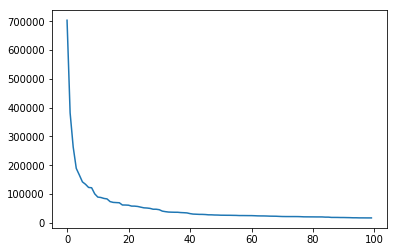

In [38]:
plt.plot(x, frequiences)

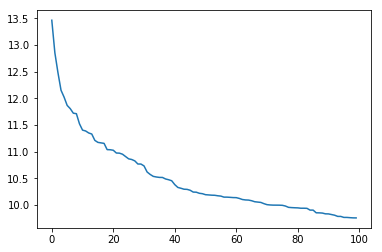

In [39]:
plt.plot(x, np.log(frequiences))

In [40]:
def prob_1(word):
    return words_count[word] / len(TOKEN)

In [41]:
prob_1('少女')

1.8844092042264802e-05

In [42]:
TOKEN[:10]
TOKEN_2_GRAM = [''.join(TOKEN[i:i+2]) for i in range(len(TOKEN[:-2]))]
TOKEN_2_GRAM[:10]

['此外', '自', '本周', '6', '月', '12', '日起', '除', '小米', '手机']

['此外自', '自本周', '本周6', '6月', '月12', '12日起', '日起除', '除小米', '小米手机', '手机6']

In [43]:
words_count_2 = Counter(TOKEN_2_GRAM)

In [44]:
words_count_2

Counter({'此外自': 7,
         '自本周': 2,
         '本周6': 3,
         '6月': 16936,
         '月12': 4305,
         '12日起': 8,
         '日起除': 1,
         '除小米': 1,
         '小米手机': 9,
         '手机6': 1,
         '6等': 1,
         '等15': 44,
         '15款': 5,
         '款机型': 2,
         '机型外': 1,
         '外其余': 53,
         '其余机型': 1,
         '机型已': 1,
         '已暂停': 12,
         '暂停更新': 1,
         '更新发布': 1,
         '发布含': 1,
         '含开发': 1,
         '开发版': 1,
         '版体验版': 1,
         '体验版内测': 1,
         '内测稳定版': 1,
         '稳定版暂不受': 1,
         '暂不受影响': 1,
         '影响以': 10,
         '以确保': 139,
         '确保工程师': 1,
         '工程师可以': 1,
         '可以集中': 5,
         '集中全部': 1,
         '全部精力': 10,
         '精力进行': 1,
         '进行系统优化': 1,
         '系统优化工作': 1,
         '工作有人': 3,
         '有人猜测': 5,
         '猜测这': 10,
         '这也': 1623,
         '也是': 7122,
         '是将': 174,
         '将精力': 12,
         '精力主要': 1,
         '主要用到': 1,
         '用到MIUI9': 1,
         'MIU

In [45]:
def prob_2(word1, word2):
    if word1 + word2 in words_count_2: return words_count_2[word1+word2] / len(TOKEN_2_GRAM)
    else:
        return 1 / len(TOKEN_2_GRAM)

In [46]:
1/len(TOKEN_2_GRAM)
prob_2('累','工人')
prob_2('程序员','脱发')
prob_2('为什么','要')
prob_2('他们','很')
prob_2('香港','人')
prob_2('我们','需要')

5.6759319823555707e-08

5.6759319823555707e-08

5.6759319823555707e-08

6.300284500414683e-06

1.7027795947066712e-06

4.8245421850022355e-06

1.1124826685416918e-05

In [47]:
def get_probablity(sentence):
    words = cut(sentence)
    
    sentence_pro = 1
    
    for i, word in enumerate(words[:-1]):
        next_ = words[i+1]
        
        probability = prob_2(word, next_)
        
        sentence_pro *= probability
    
    return sentence_pro

In [48]:
get_probablity('你长得很帅')
get_probablity('猩红色的天空下爆发着战争')
get_probablity('我们该去吃饭了')
get_probablity('游戏很好玩')
get_probablity('数学很复杂')

3.2216203868326836e-15

1.8256425000218093e-41

4.010382971073147e-26

1.2886481547330735e-14

8.698375044448247e-14

In [49]:
for sen in [generate(gram=example_grammar, target='sentence') for i in range(10)]:
    print('sentence: {} with Prb: {}'.format(sen, get_probablity(sen)))

sentence: 一个篮球听着这个小猫 with Prb: 1.1858498065887052e-33
sentence: 这个蓝色的女人看着这个好看的小猫 with Prb: 2.4322376672474084e-51
sentence: 这个小猫看着这个篮球 with Prb: 1.2454605500227163e-28
sentence: 这个小小的蓝色的小猫看见这个蓝色的蓝色的桌子 with Prb: 4.5950105566467554e-69
sentence: 这个桌子听着一个小猫 with Prb: 3.9168978460051175e-33
sentence: 这个小小的小小的蓝色的好看的小小的蓝色的小猫看着一个蓝色的女人 with Prb: 6.924007762637812e-98
sentence: 一个桌子听着一个小猫 with Prb: 3.9168978460051175e-33
sentence: 一个好看的桌子看着一个小猫 with Prb: 1.6049604395796124e-41
sentence: 这个小猫听着这个小小的女人 with Prb: 6.0577225591383005e-40
sentence: 这个桌子看见一个小猫 with Prb: 4.151535166742388e-29


In [50]:
' '.join(generate(gram=example_grammar, target='sentence') for i in range(2))

'一个女人坐在这个女人 这个蓝色的桌子听着一个女人'

In [51]:
need_compared = [
    "今天晚上请你吃大餐，我们一起吃日料 明天晚上请你吃大餐，我们一起吃苹果",
    "真事一只好看的小猫 真是一只好看的小猫",
    "今晚我去吃火锅 今晚火锅去吃我",
    "洋葱奶昔来一杯 养乐多绿来一杯"
]

In [52]:
for s in need_compared:
    s1, s2 = s.split()
    p1, p2 = get_probablity(s1), get_probablity(s2)
    
    better = s1 if p1 > p2 else s2
    
    print('{} is more possible'.format(better))
    print('-'*4 + ' {} with probility {}'.format(s1, p1))
    print('-'*4 + ' {} with probility {}'.format(s2, p2))

今天晚上请你吃大餐，我们一起吃日料 is more possible
---- 今天晚上请你吃大餐，我们一起吃日料 with probility 1.8889745916921315e-66
---- 明天晚上请你吃大餐，我们一起吃苹果 with probility 1.5111796733537052e-66
真是一只好看的小猫 is more possible
---- 真事一只好看的小猫 with probility 4.5242555959271015e-34
---- 真是一只好看的小猫 with probility 7.970947520145384e-27
今晚我去吃火锅 is more possible
---- 今晚我去吃火锅 with probility 3.401139863085618e-20
---- 今晚火锅去吃我 with probility 5.396995716765105e-28
养乐多绿来一杯 is more possible
---- 洋葱奶昔来一杯 with probility 1.8285698188632354e-22
---- 养乐多绿来一杯 with probility 3.2216203868326836e-15


In [53]:
need_compared_2 = []
for i in range(4):
    need_compared_2.append(' '.join(generate(gram=create_grammar(host, split='='), 
                                             target='host') for i in range(2)))

need_compared_2

['女士,您好我是55号,您需要喝酒吗？ 女士,您好我是292号,请问你要打牌吗？',
 '您好我是15号,您需要赌博吗？ 先生,您好我是77号,请问你要赌博吗？',
 '您好我是4号,请问你要打猎吗？ 您好我是46号,您需要赌博吗？',
 '女士,你好我是1号,您需要打牌吗？ 小朋友,你好我是2号,您需要赌博吗？']

In [54]:
for s in need_compared_2:
    s1, s2 = s.split()
    p1, p2 = get_probablity(s1), get_probablity(s2)
    
    better = s1 if p1 > p2 else s2
    
    print('{} is more possible'.format(better))
    print('-'*4 + ' {} with probility {}'.format(s1, p1))
    print('-'*4 + ' {} with probility {}'.format(s2, p2))

女士,您好我是55号,您需要喝酒吗？ is more possible
---- 女士,您好我是55号,您需要喝酒吗？ with probility 5.554280089702351e-84
---- 女士,您好我是292号,请问你要打牌吗？ with probility 5.0125888440162726e-89
您好我是15号,您需要赌博吗？ is more possible
---- 您好我是15号,您需要赌博吗？ with probility 9.827165435350733e-68
---- 先生,您好我是77号,请问你要赌博吗？ with probility 5.0125888440162726e-89
您好我是46号,您需要赌博吗？ is more possible
---- 您好我是4号,请问你要打猎吗？ with probility 1.624382181880194e-71
---- 您好我是46号,您需要赌博吗？ with probility 1.29304808359878e-69
女士,你好我是1号,您需要打牌吗？ is more possible
---- 女士,你好我是1号,您需要打牌吗？ with probility 3.662006291641881e-80
---- 小朋友,你好我是2号,您需要赌博吗？ with probility 2.790609174068703e-80
